In [1]:
using Revise
using Kinetic
using DifferentialEquations, Flux
using DiffEqFlux, Optim
using Plots

In [2]:
function boltzmann!(df, f::Array{<:Real,3}, p, t)
    Kn, M, phi, psi, phipsi = p
    df .= boltzmann_fft(f, Kn, M, phi, psi, phipsi)
end

function bgk!(df, f::Array{<:Real,3}, p, t)
    g, tau = p
    df .= (g .- f) ./ tau
end

bgk! (generic function with 1 method)

In [3]:
function reduce_distribution(f::AbstractArray{<:Real,3}, w::AbstractArray{<:Real,3})
    h = zeros(axes(f, 1))
    for i in eachindex(h)
        h[i] = sum(@. w[i,:,:] * f[i,:,:])
    end
    
    return h
end

reduce_distribution (generic function with 1 method)

In [46]:
maxTime = 8.
tlen = 9
u0 = -8.
u1 = 8.
nu = 40
nug = 0
vMeshType = "rectangle"
nm = 5
knudsen = 1.
inK = 0
alpha = 1.0
omega = 0.5
nh = 5;

In [47]:
tspan = (0.0, maxTime)
tRange = range(tspan[1], tspan[2], length=tlen)
γ = heat_capacity_ratio(inK, 3)
vSpace = VSpace3D(u0, u1, nu, u0, u1, nu, u0, u1, nu, vMeshType)
mu_ref = ref_vhs_vis(knudsen, alpha, omega)
kn_bzm = hs_boltz_kn(mu_ref, 1.0);

In [48]:
phi, psi, phipsi = kernel_mode( nm, vSpace.u1, vSpace.v1, vSpace.w1, vSpace.du[1,1,1], vSpace.dv[1,1,1], vSpace.dw[1,1,1],
                                vSpace.nu, vSpace.nv, vSpace.nw, alpha );

In [54]:
f1 = Float32.(0.5 * (1/π)^1.5 .* (exp.(-(vSpace.u .- 2).^2) .+ exp.(-(vSpace.u .+ 2).^2)) .* 
     exp.(-vSpace.v.^2) .* exp.(-vSpace.w.^2)) |> Array
prim1 = conserve_prim(moments_conserve(f1, vSpace.u, vSpace.v, vSpace.w, vSpace.weights), γ)
M1 = Float32.(maxwellian(vSpace.u, vSpace.v, vSpace.w, prim1)) |> Array
τ1 = mu_ref * 2. * prim1[end]^(0.5) / prim1[1];

f2 = Float32.(0.25 * (0.8/π)^1.5 .* ( exp.(-0.8 .* (vSpace.u .- 1.5).^2) ) .* 
     exp.(-vSpace.v.^2) .* exp.(-vSpace.w.^2)) |> Array
prim2 = conserve_prim(moments_conserve(f2, vSpace.u, vSpace.v, vSpace.w, vSpace.weights), γ)
M2 = Float32.(maxwellian(vSpace.u, vSpace.v, vSpace.w, prim2)) |> Array
τ2 = mu_ref * 2. * prim2[end]^(0.5) / prim2[1];

In [55]:
#--- Boltzmann ---#
prob = ODEProblem(boltzmann!, f1, tspan, [kn_bzm, nm, phi, psi, phipsi])
data_boltz1 = solve(prob, Tsit5(), saveat=tRange) |> Array;

prob = ODEProblem(boltzmann!, f2, tspan, [kn_bzm, nm, phi, psi, phipsi])
data_boltz2 = solve(prob, Tsit5(), saveat=tRange) |> Array;

data_boltz = [data_boltz1, data_boltz2];

In [56]:
#--- BGK ---#
prob = ODEProblem(bgk!, f1, tspan, [M1, τ1])
data_bgk1 = solve(prob, Tsit5(), saveat=tRange) |> Array;

prob = ODEProblem(bgk!, f2, tspan, [M2, τ2])
data_bgk2 = solve(prob, Tsit5(), saveat=tRange) |> Array;

data_bgk = [data_bgk1, data_bgk2];

In [57]:
data_boltz_1D1 = zeros(Float32, axes(data_boltz1, 1), axes(data_boltz1, 4))
data_bgk_1D1 = zeros(Float32, axes(data_bgk1, 1), axes(data_bgk1, 4))
for j in axes(data_boltz_1D1, 2)
    data_boltz_1D1[:,j] .= reduce_distribution(data_boltz1[:,:,:,j], vSpace.weights)
    data_bgk_1D1[:,j] .= reduce_distribution(data_bgk1[:,:,:,j], vSpace.weights)
end
f0_1D1 = reduce_distribution(f1, vSpace.weights)
M0_1D1 = reduce_distribution(M1, vSpace.weights);

data_boltz_1D2 = zeros(Float32, axes(data_boltz2, 1), axes(data_boltz2, 4))
data_bgk_1D2 = zeros(Float32, axes(data_bgk2, 1), axes(data_bgk2, 4))
for j in axes(data_boltz_1D2, 2)
    data_boltz_1D2[:,j] .= reduce_distribution(data_boltz2[:,:,:,j], vSpace.weights)
    data_bgk_1D2[:,j] .= reduce_distribution(data_bgk2[:,:,:,j], vSpace.weights)
end
f0_1D2 = reduce_distribution(f2, vSpace.weights)
M0_1D2 = reduce_distribution(M2, vSpace.weights);

data_boltz_1D = [data_boltz_1D1, data_boltz_1D2]
data_bgk_1D = [data_bgk_1D1, data_bgk_1D2]
f0_1D = [f0_1D1, f0_1D2]
M0_1D = [M0_1D1, M0_1D2];

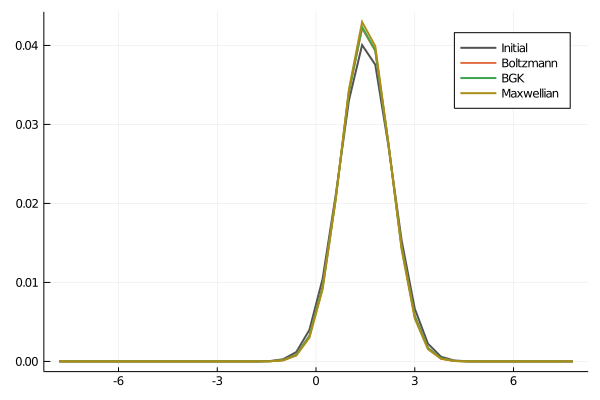

In [58]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[2][:,1], lw=2, label="Initial", color=:gray32)
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[2][:,end], lw=2, label="Boltzmann")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_bgk_1D[2][:,end], lw=2, label="BGK")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], M0_1D[2][:], lw=2, label="Maxwellian", color=5)

In [59]:
#--- neural ode ---#
dudt = FastChain( (x, p) -> x.^2, 
                   FastDense(vSpace.nu, vSpace.nu*nh, tanh), 
                   FastDense(vSpace.nu*nh, vSpace.nu*nh, tanh), 
                   FastDense(vSpace.nu*nh, vSpace.nu) )
n_ode = NeuralODE(dudt, tspan, Tsit5(), saveat=tRange)

function loss_n_ode(p)
    _1 = n_ode(f0_1D[1], p)
    _2 = n_ode(f0_1D[2], p)
    loss = sum(abs2, _1 .- data_boltz_1D[1]) + sum(abs2, _2 .- data_boltz_1D[2])
    return loss, _1
end

cb = function (p, l, pred; doplot=true)
    display(l)
    # plot current prediction against dataset
    if doplot
        pl = plot(tRange, data_boltz_1D[1][vSpace.nu÷2,:], lw=2, label="Exact")
        scatter!(pl, tRange, pred[vSpace.nu÷2,:], lw=2, label="NN prediction")
        display(plot(pl))
    end
    return false
end

#30 (generic function with 1 method)

0.6464990444852221

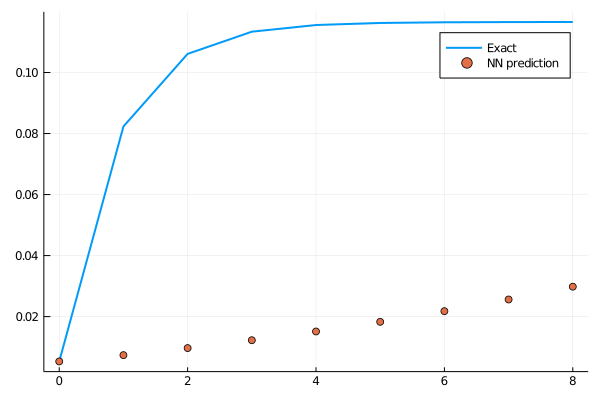

loss: 0.646:   0%|▏                                        |  ETA: 0:38:45

0.5214302651591614

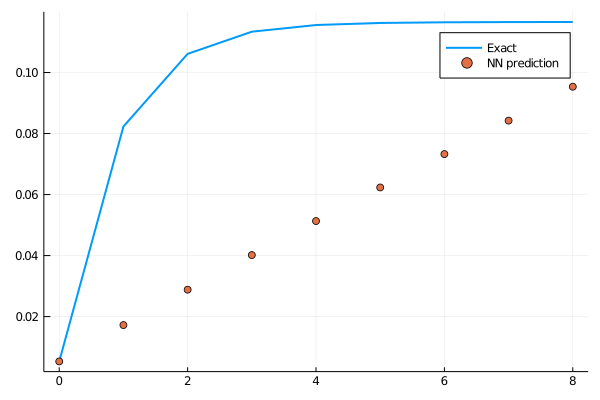

loss: 0.521:   1%|▎                                        |  ETA: 0:19:53

0.4508725509487012

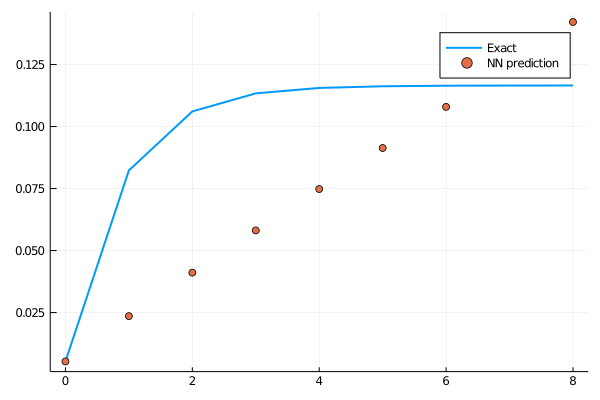

loss: 0.451:   1%|▍                                        |  ETA: 0:12:13

0.3793492137168975

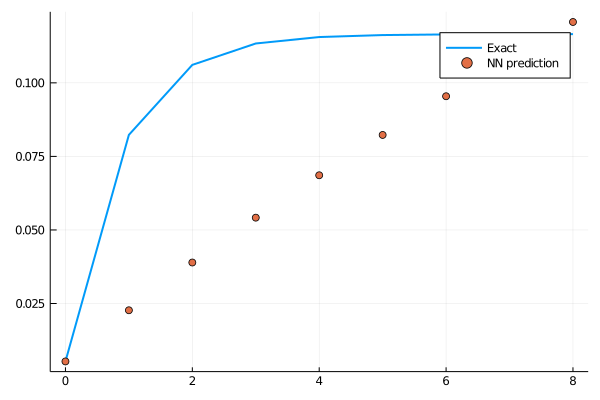

loss: 0.379:   1%|▌                                        |  ETA: 0:09:35

0.3280779238045252

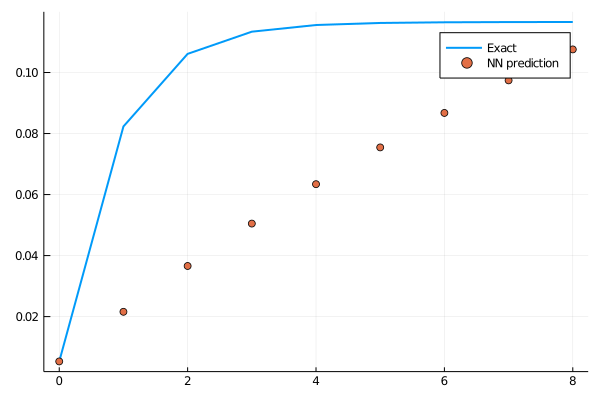

loss: 0.328:   2%|▋                                        |  ETA: 0:07:56

0.2888408377424236

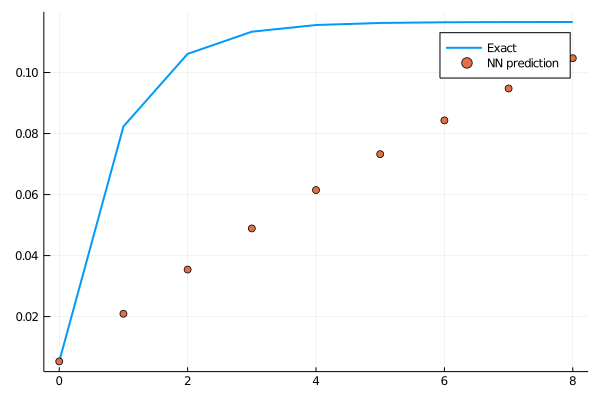

loss: 0.289:   2%|▉                                        |  ETA: 0:06:27

0.26257781223824084

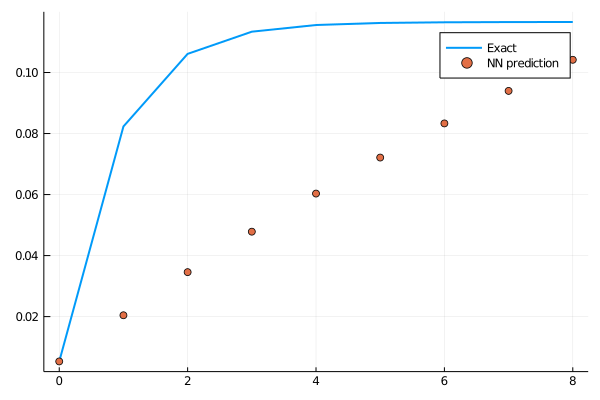

loss: 0.263:   2%|█                                        |  ETA: 0:05:43

0.24501017835287703

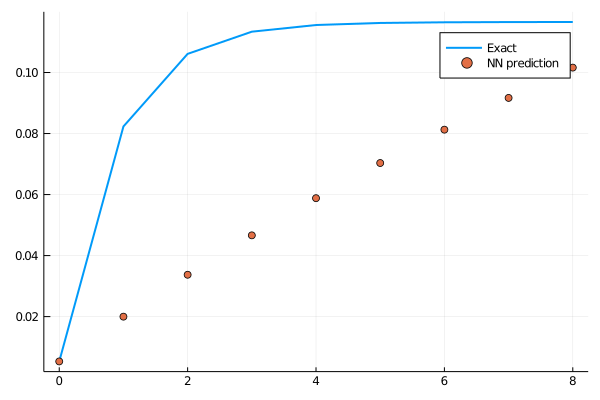

loss: 0.245:   3%|█▏                                       |  ETA: 0:05:08

0.23184082308474985

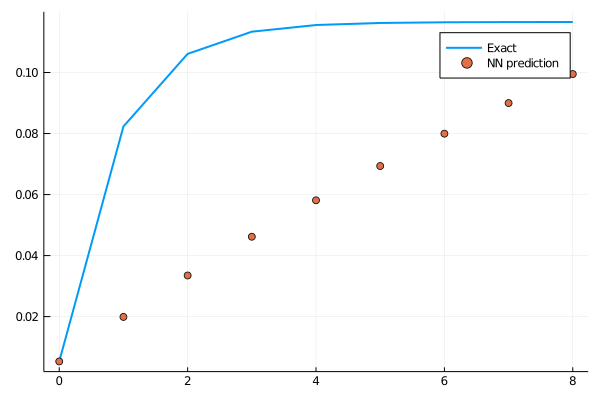

loss: 0.232:   3%|█▎                                       |  ETA: 0:04:32

0.21225309697671746

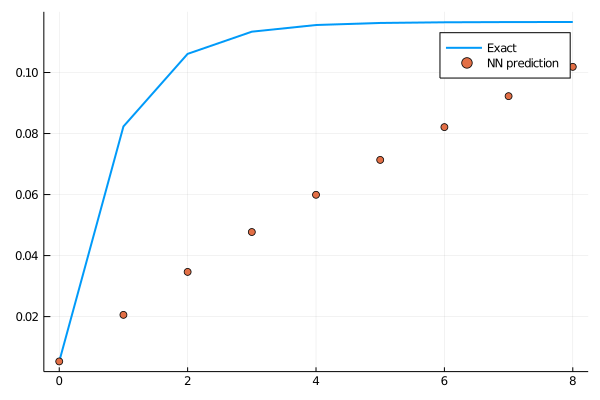

loss: 0.212:   3%|█▍                                       |  ETA: 0:04:12

0.19247263214075627

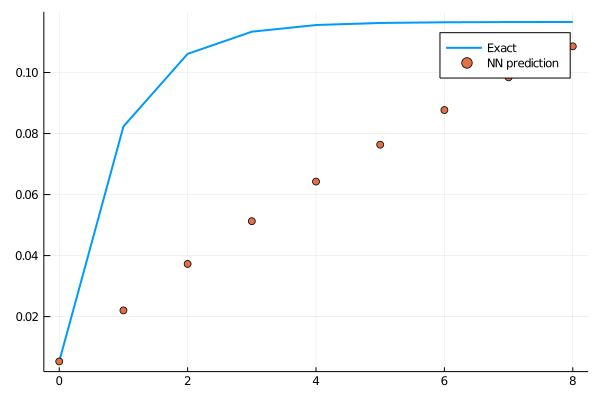

loss: 0.192:   4%|█▌                                       |  ETA: 0:03:55

0.17526140466011392

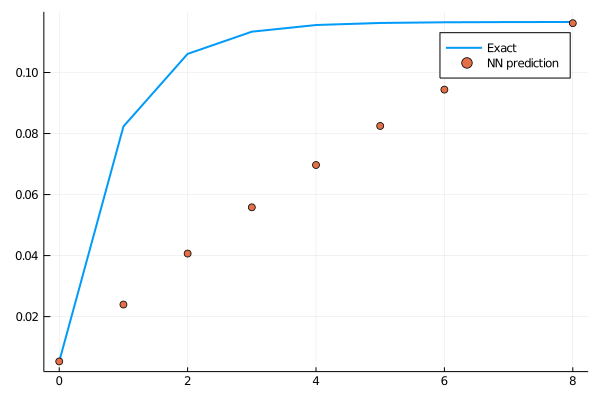

loss: 0.175:   4%|█▋                                       |  ETA: 0:03:35

0.1565179472477853

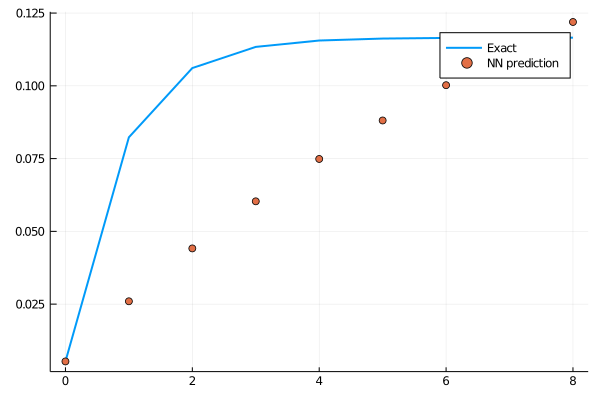

loss: 0.157:   4%|█▊                                       |  ETA: 0:03:23

0.13975600461643384

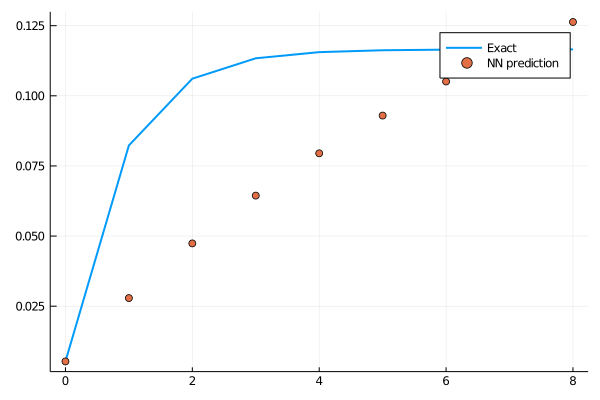

loss: 0.14:   5%|█▉                                       |  ETA: 0:03:12

0.1262279442480361

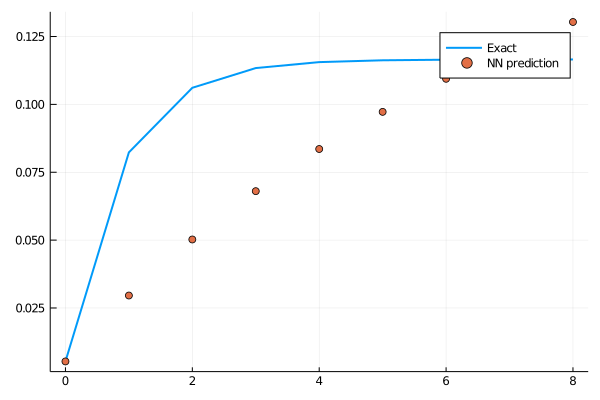

loss: 0.126:   5%|██                                       |  ETA: 0:02:59

0.11472783450475738

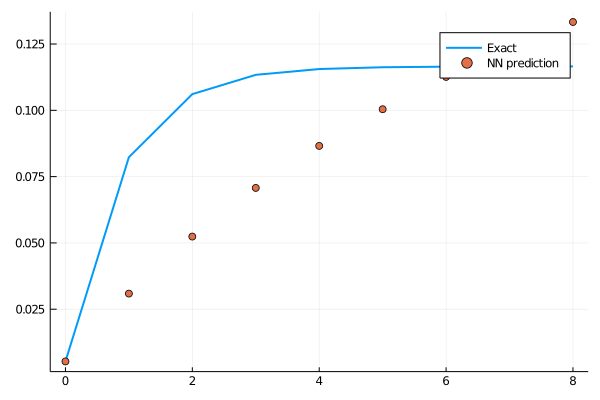

loss: 0.115:   5%|██▏                                      |  ETA: 0:02:51

0.10565723785350203

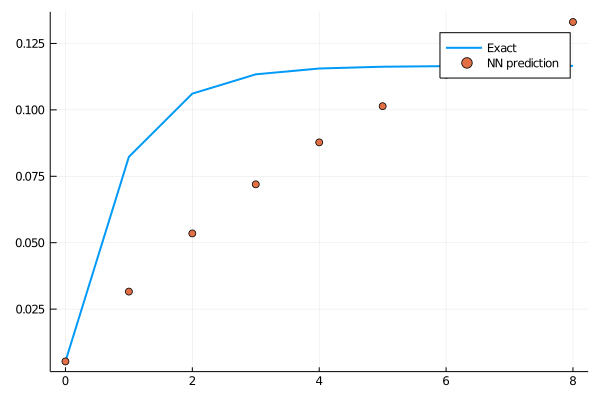

loss: 0.106:   6%|██▎                                      |  ETA: 0:02:44

0.09746539298907954

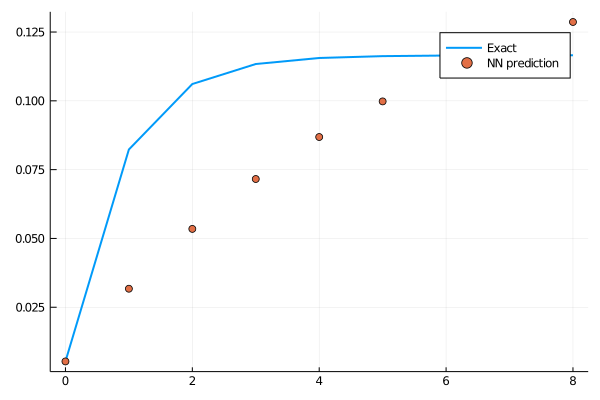

loss: 0.0975:   6%|██▌                                      |  ETA: 0:02:34

0.08940307922215657

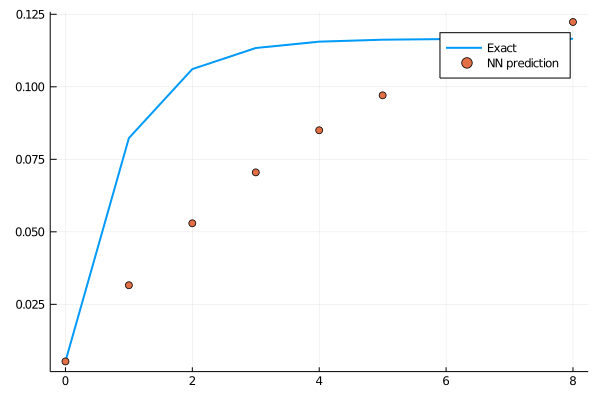

loss: 0.0894:   6%|██▋                                      |  ETA: 0:02:29

0.08276469310318563

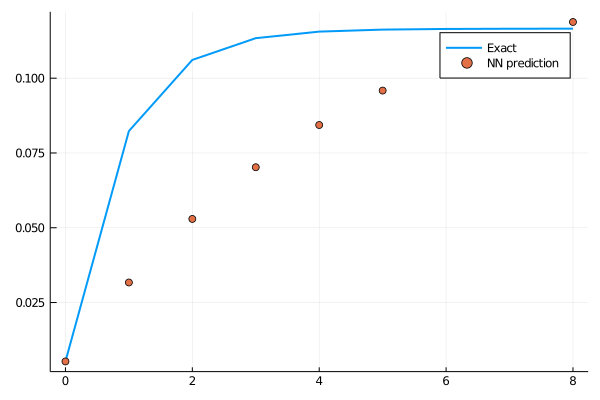

loss: 0.0828:   7%|██▊                                      |  ETA: 0:02:24

0.0765843114150593

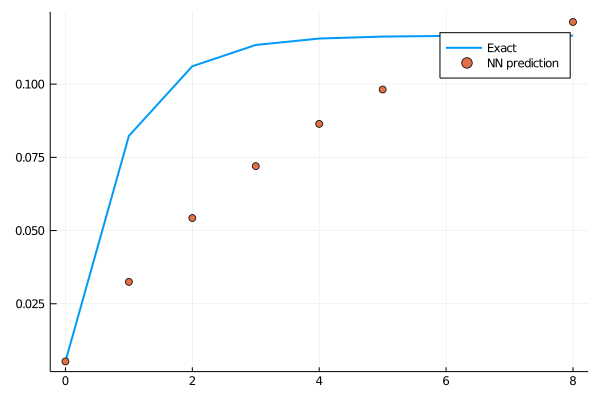

loss: 0.0766:   7%|██▉                                      |  ETA: 0:02:17

0.06943207433395367

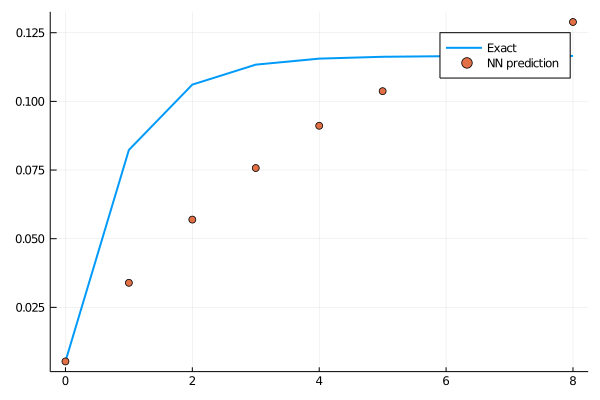

loss: 0.0694:   7%|███                                      |  ETA: 0:02:13

0.06184202121759618

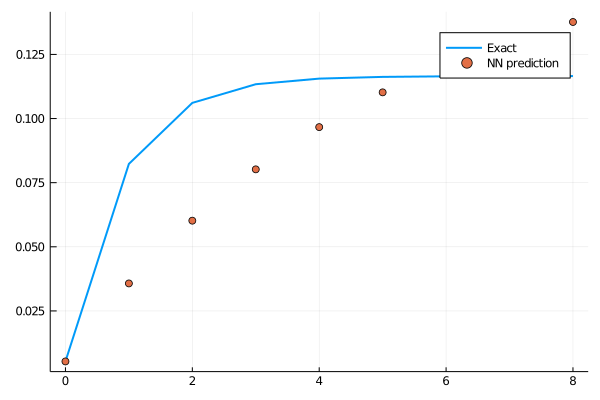

loss: 0.0618:   8%|███▏                                     |  ETA: 0:02:09

0.05514672875336208

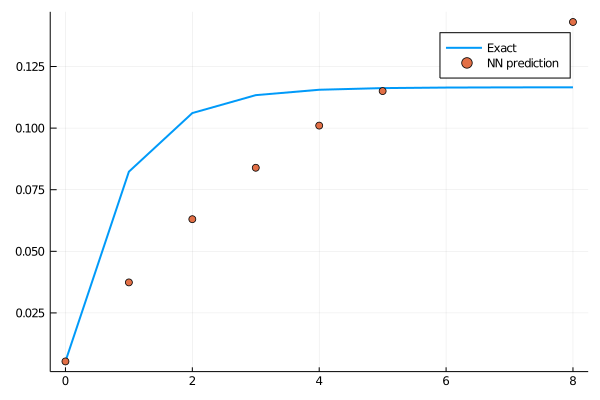

loss: 0.0551:   8%|███▎                                     |  ETA: 0:02:04

0.05076648087320148

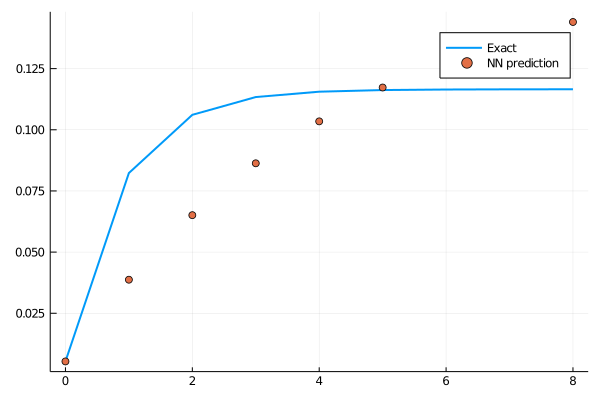

loss: 0.0508:   8%|███▍                                     |  ETA: 0:02:01

0.04819105376599918

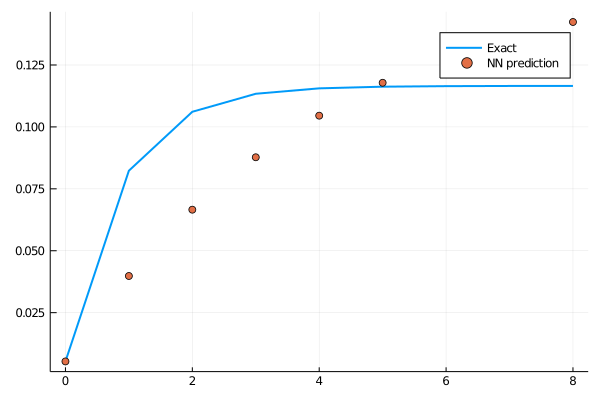

loss: 0.0482:   9%|███▌                                     |  ETA: 0:01:58

0.04621629830106608

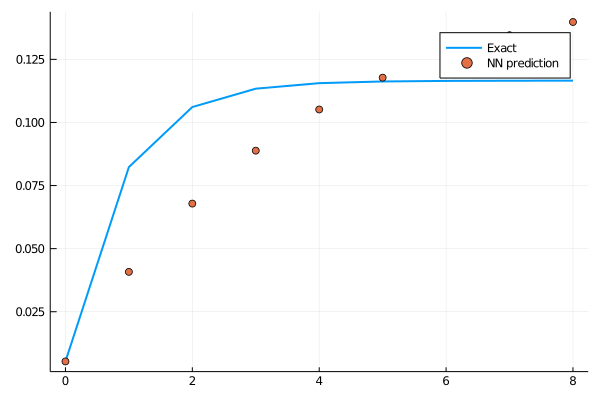

loss: 0.0462:   9%|███▊                                     |  ETA: 0:01:54

0.0445747937386269

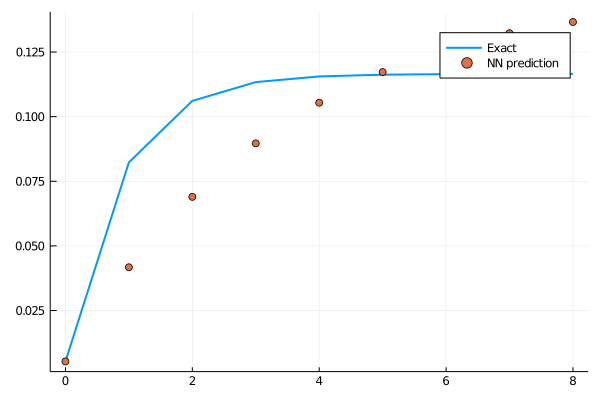

loss: 0.0446:   9%|███▉                                     |  ETA: 0:01:51

0.04203965448964665

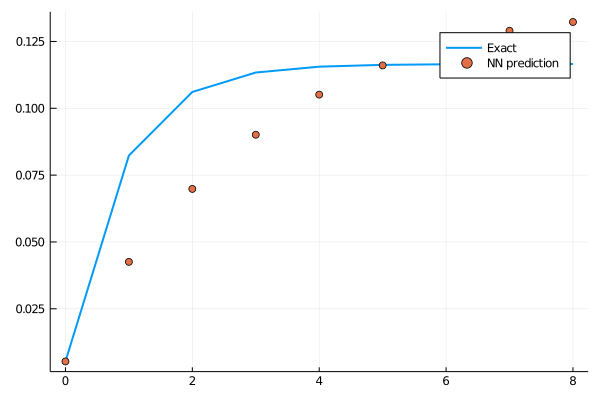

loss: 0.042:  10%|███▉                                     |  ETA: 0:01:49

0.038088639786191744

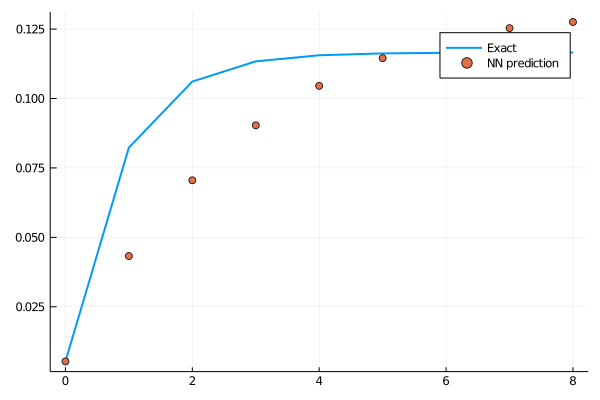

loss: 0.0381:  10%|████▏                                    |  ETA: 0:01:46

0.03391136351591986

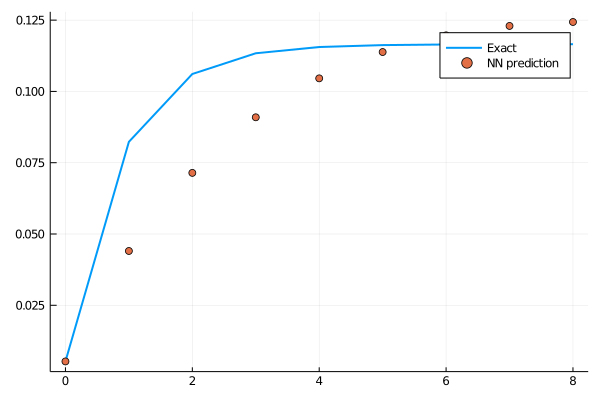

loss: 0.0339:  10%|████▎                                    |  ETA: 0:01:43

0.030560312007450217

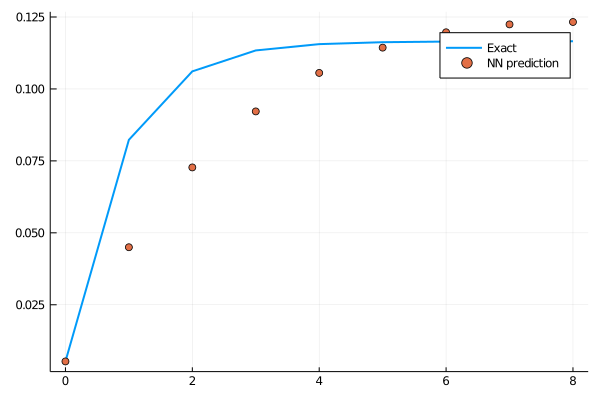

loss: 0.0306:  11%|████▍                                    |  ETA: 0:01:42

0.028988588033662985

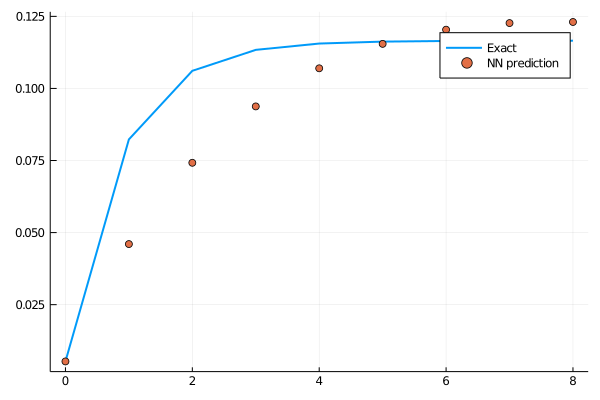

loss: 0.029:  11%|████▌                                    |  ETA: 0:01:39

0.028711696323518967

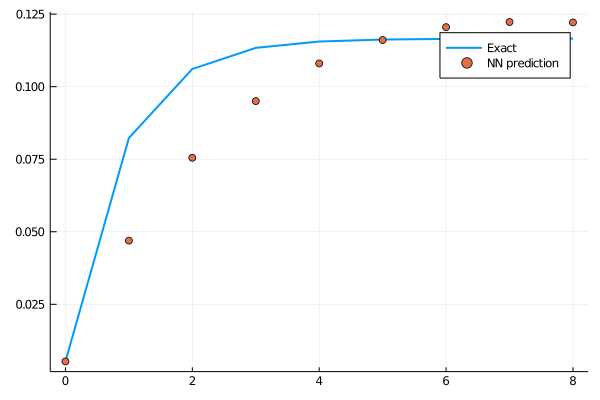

loss: 0.0287:  11%|████▋                                    |  ETA: 0:01:37

0.028439353405171022

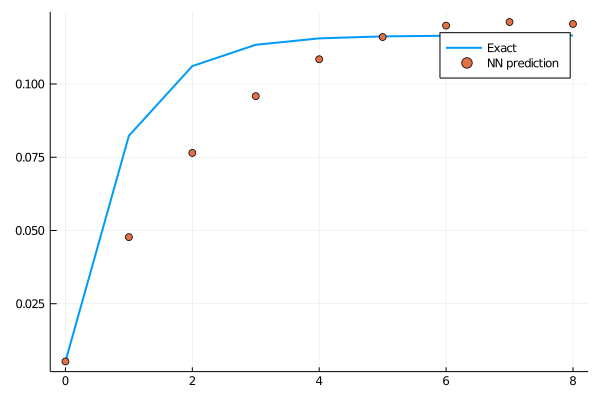

loss: 0.0284:  12%|████▊                                    |  ETA: 0:01:35

0.027544944854640947

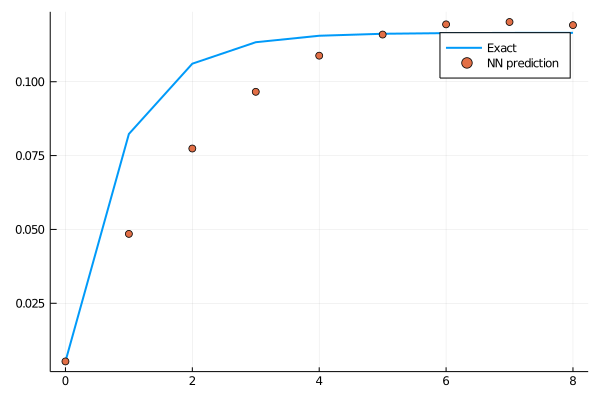

loss: 0.0275:  12%|████▉                                    |  ETA: 0:01:33

0.0256521477048062

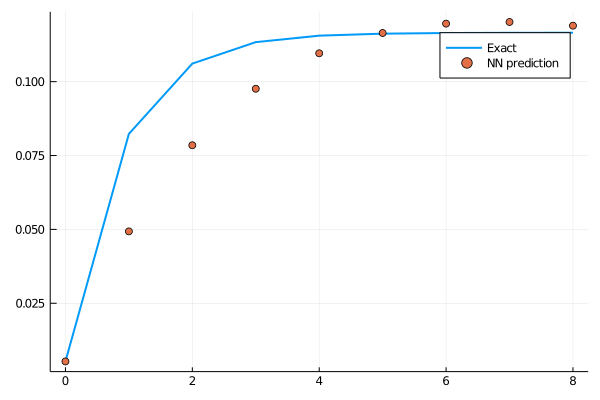

loss: 0.0257:  12%|█████                                    |  ETA: 0:01:31

0.02322930409894142

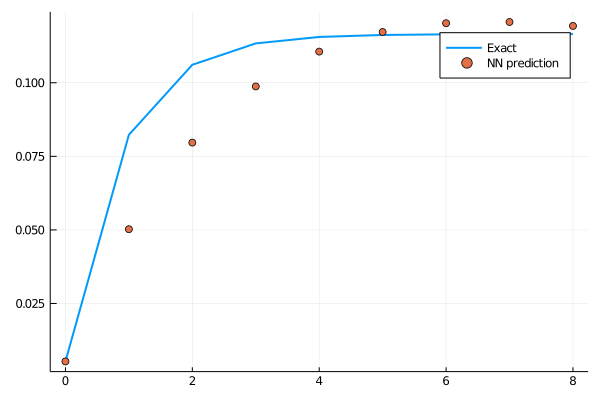

loss: 0.0232:  13%|█████▏                                   |  ETA: 0:01:30

0.02097543422354871

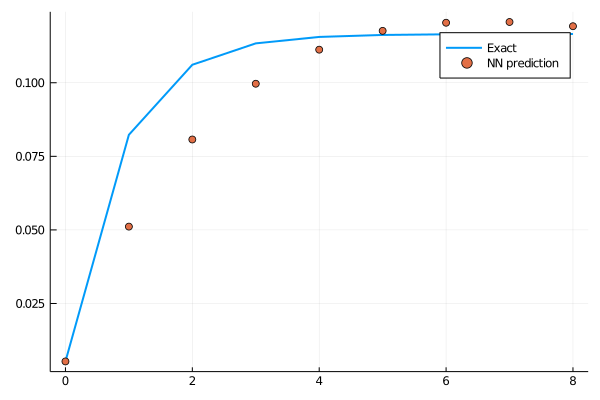

loss: 0.021:  13%|█████▍                                   |  ETA: 0:01:28

0.019381132518127012

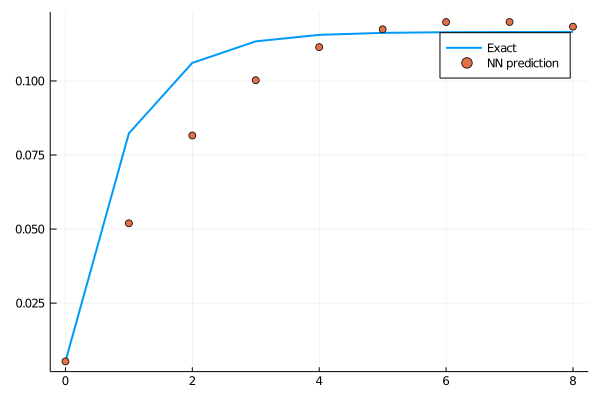

loss: 0.0194:  13%|█████▌                                   |  ETA: 0:01:27

0.01877778065107319

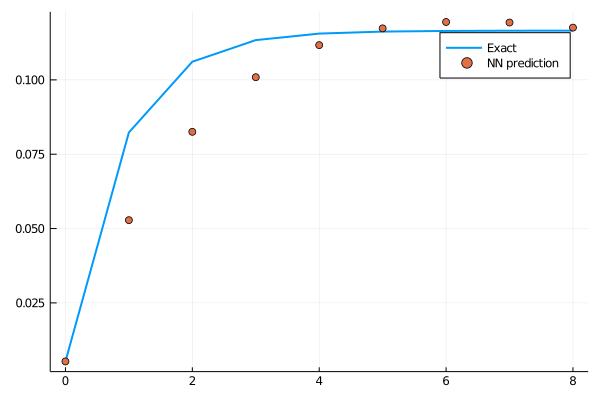

loss: 0.0188:  14%|█████▋                                   |  ETA: 0:01:26

0.018649274093073563

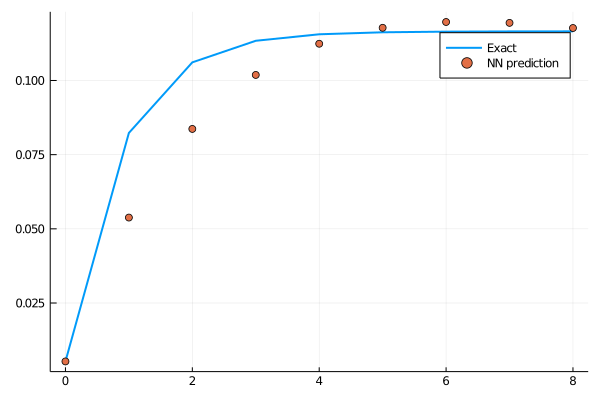

loss: 0.0186:  14%|█████▊                                   |  ETA: 0:01:24

0.018339948626506928

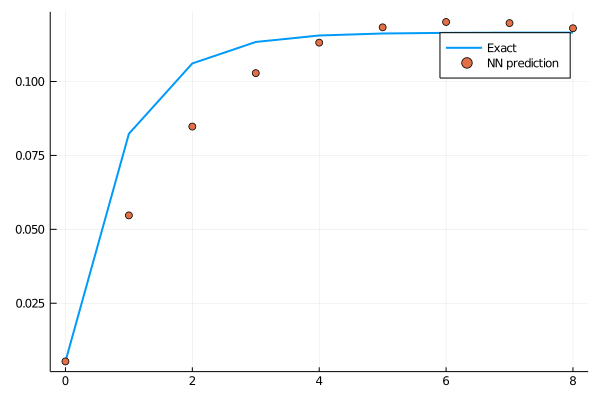

loss: 0.0183:  14%|█████▉                                   |  ETA: 0:01:23

0.017337560263044772

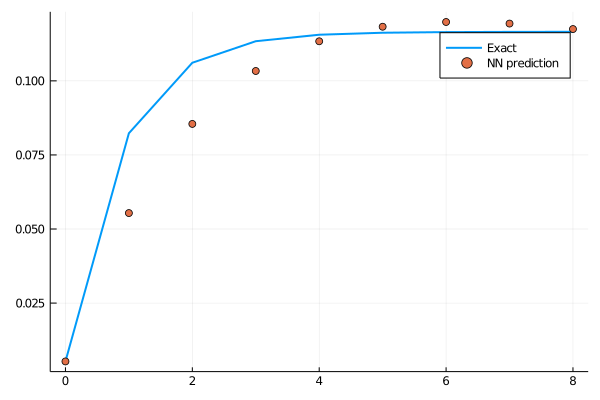

loss: 0.0173:  15%|██████                                   |  ETA: 0:01:22

0.015819076786759364

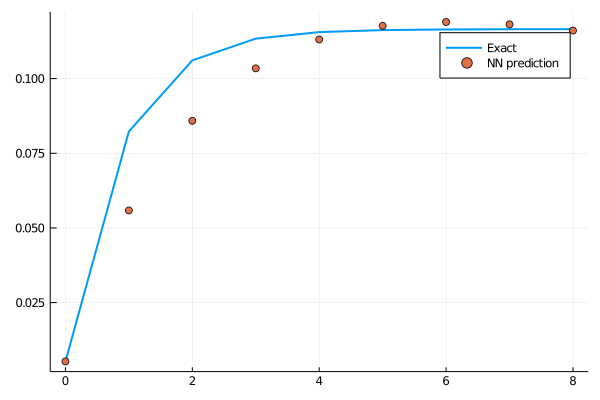

loss: 0.0158:  15%|██████▏                                  |  ETA: 0:01:20

0.014267064337076292

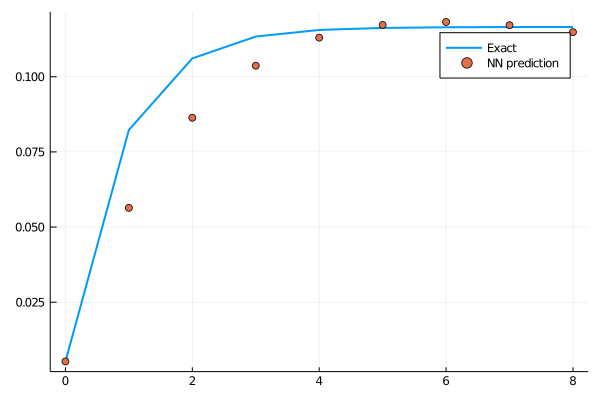

loss: 0.0143:  15%|██████▎                                  |  ETA: 0:01:19

0.013045088442716948

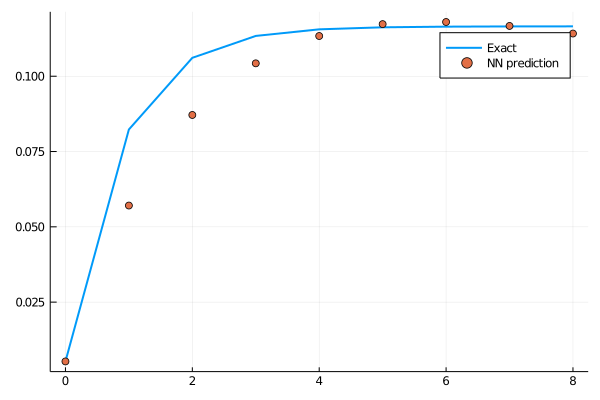

loss: 0.013:  16%|██████▍                                  |  ETA: 0:01:18

0.0125018616480492

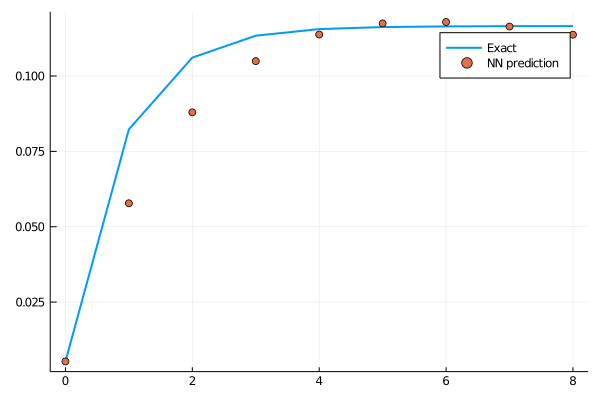

loss: 0.0125:  16%|██████▌                                  |  ETA: 0:01:17

0.01231197963402285

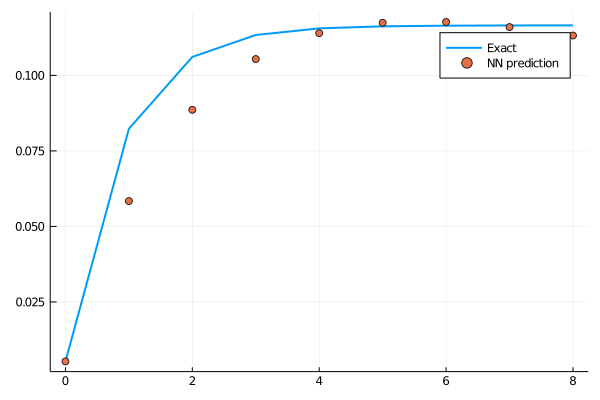

loss: 0.0123:  16%|██████▋                                  |  ETA: 0:01:16

0.012029729350831068

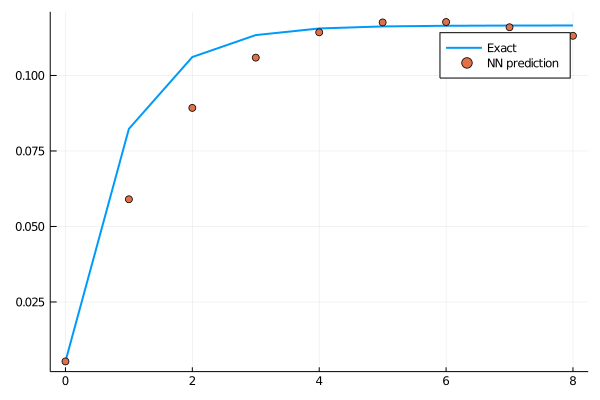

loss: 0.012:  17%|██████▊                                  |  ETA: 0:01:15

0.011480514982733732

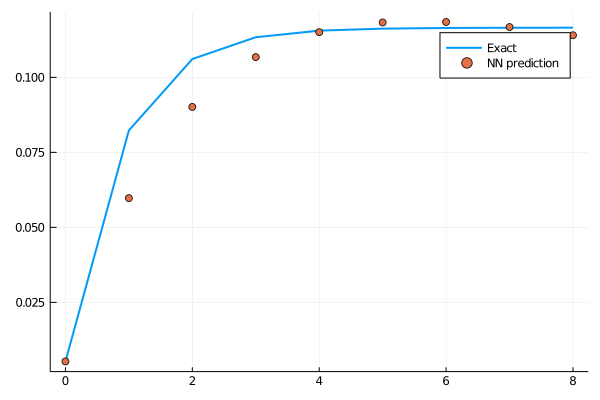

loss: 0.0115:  17%|███████                                  |  ETA: 0:01:13

0.01076241560462591

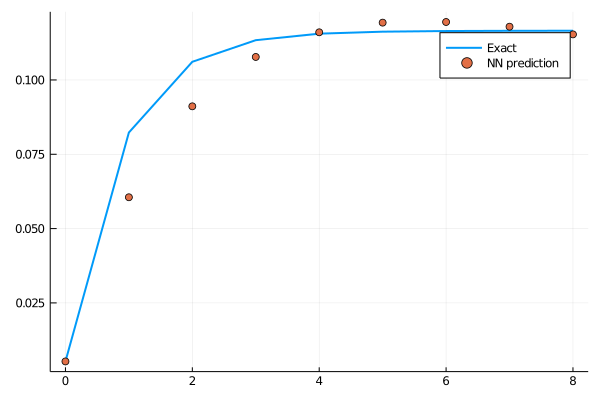

loss: 0.0108:  17%|███████▏                                 |  ETA: 0:01:13

0.009973478556011495

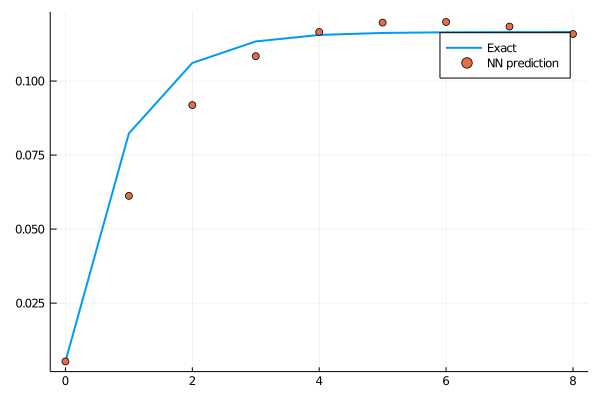

loss: 0.00997:  18%|███████▎                                 |  ETA: 0:01:12

0.00931057877319932

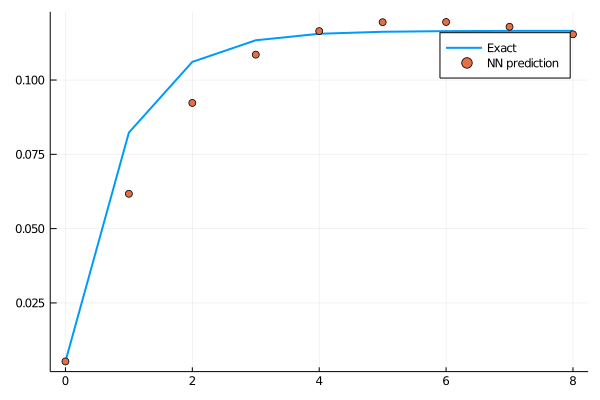

loss: 0.00931:  18%|███████▍                                 |  ETA: 0:01:11

0.008908604511250548

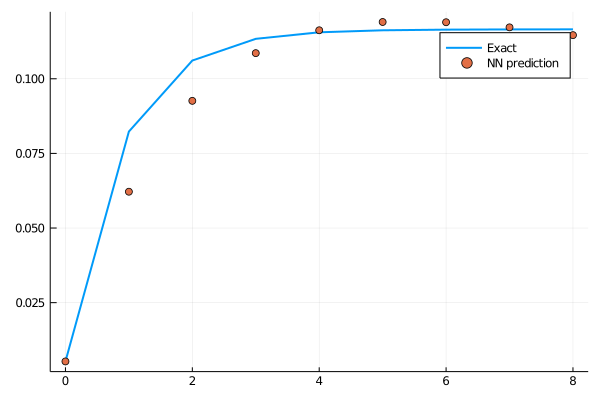

loss: 0.00891:  18%|███████▌                                 |  ETA: 0:01:10

0.00867566841259462

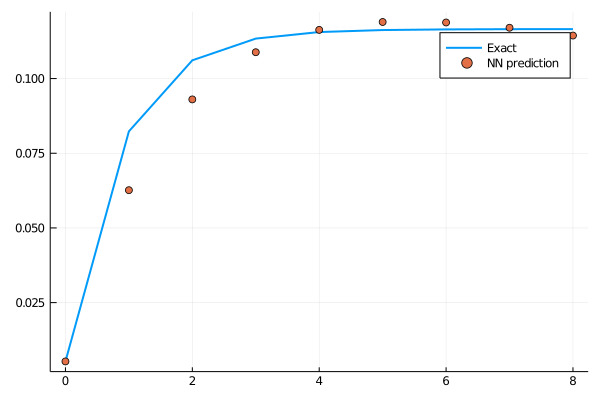

loss: 0.00868:  19%|███████▋                                 |  ETA: 0:01:09

0.008486482225858464

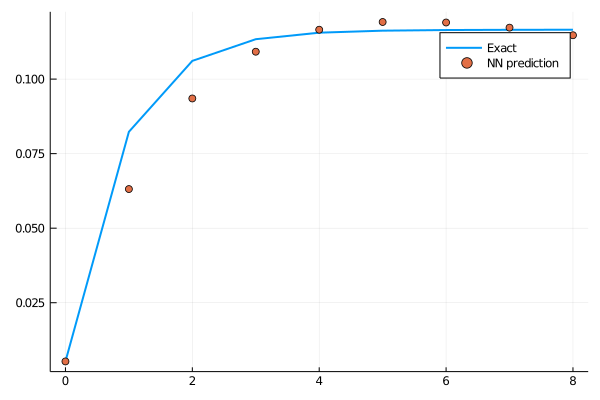

loss: 0.00849:  19%|███████▊                                 |  ETA: 0:01:08

0.00822248533896989

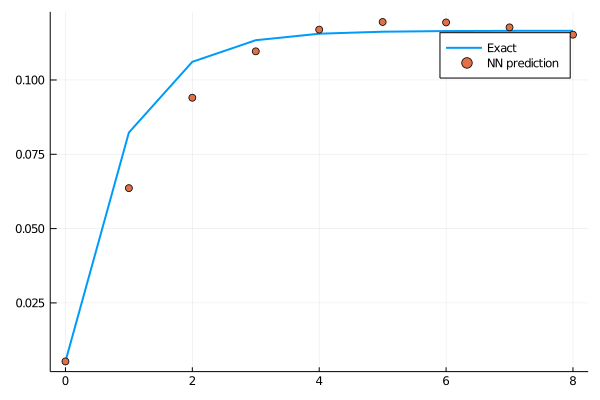

loss: 0.00822:  19%|███████▉                                 |  ETA: 0:01:08

0.007871125574680674

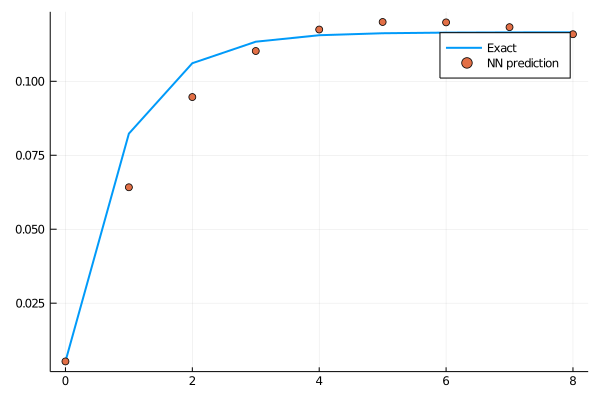

loss: 0.00787:  20%|████████                                 |  ETA: 0:01:07

0.007448841801084419

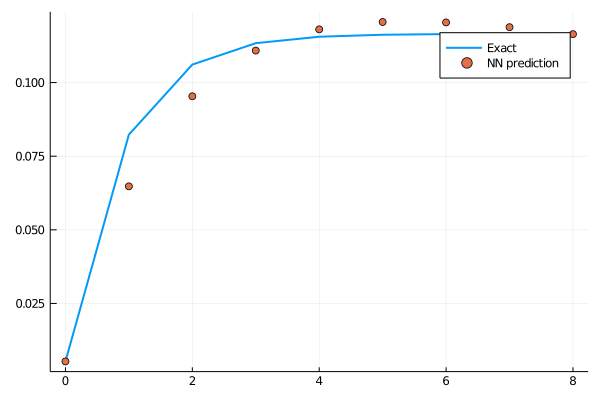

loss: 0.00745:  20%|████████▎                                |  ETA: 0:01:06

0.0070778117994055095

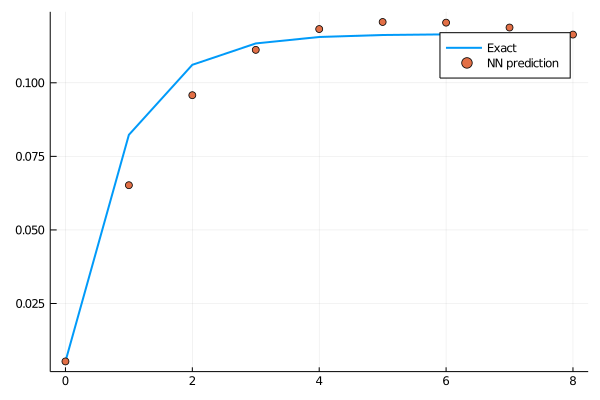

loss: 0.00708:  20%|████████▍                                |  ETA: 0:01:06

0.006812924801100535

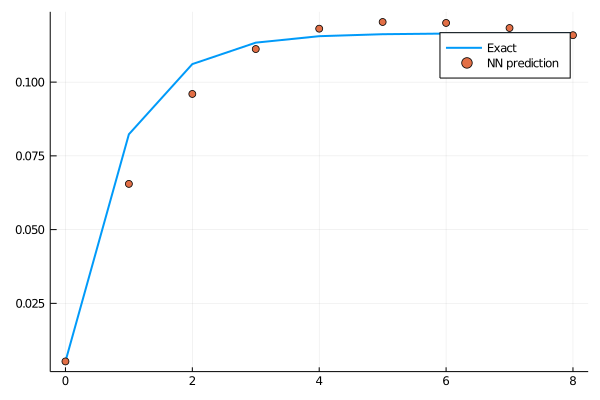

loss: 0.00681:  21%|████████▌                                |  ETA: 0:01:05

0.006627672278628996

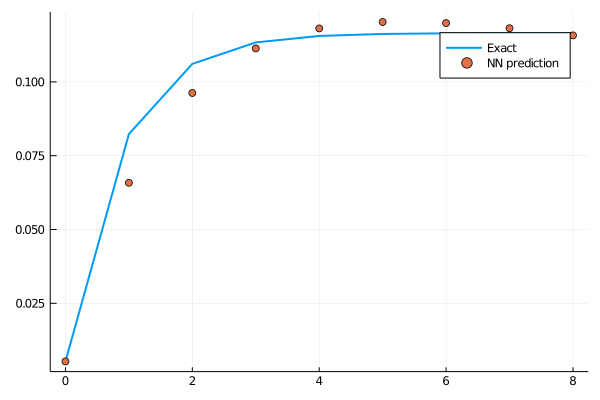

loss: 0.00663:  21%|████████▋                                |  ETA: 0:01:04

0.006442702083452058

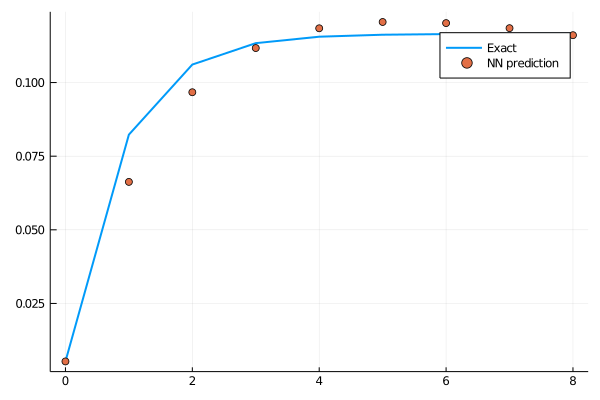

loss: 0.00644:  21%|████████▊                                |  ETA: 0:01:04

0.006249748417513088

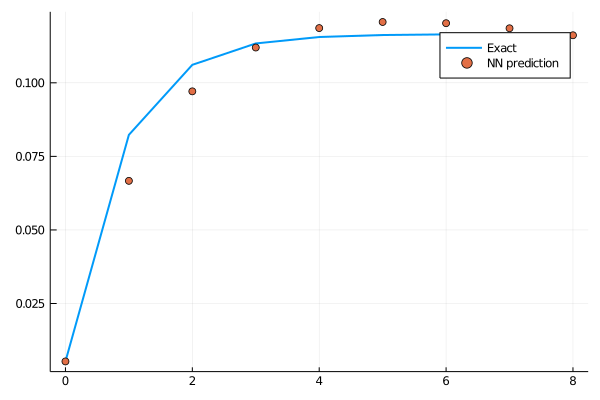

loss: 0.00625:  22%|████████▉                                |  ETA: 0:01:04

0.006002341524724869

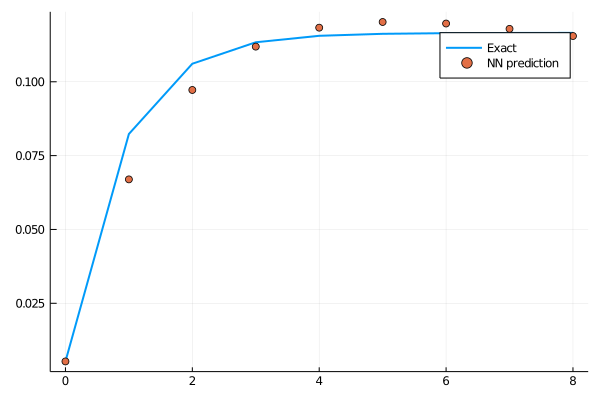

loss: 0.006:  22%|█████████                                |  ETA: 0:01:03

0.005722977147852657

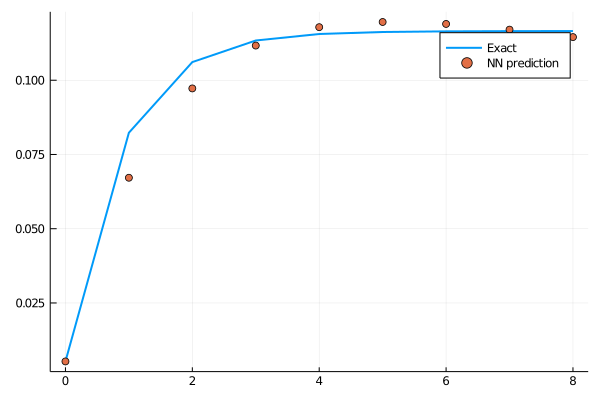

loss: 0.00572:  22%|█████████▏                               |  ETA: 0:01:03

0.005470100434787565

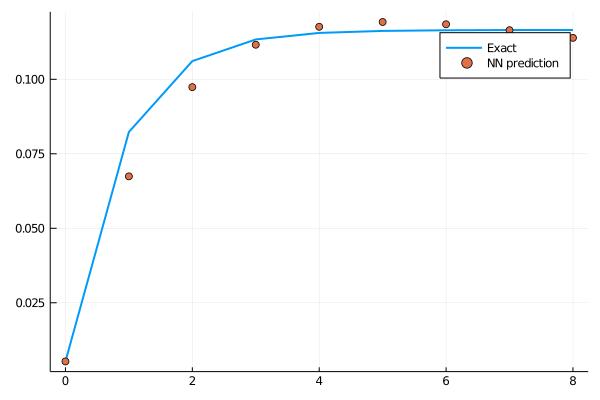

loss: 0.00547:  23%|█████████▎                               |  ETA: 0:01:02

0.005260836231744016

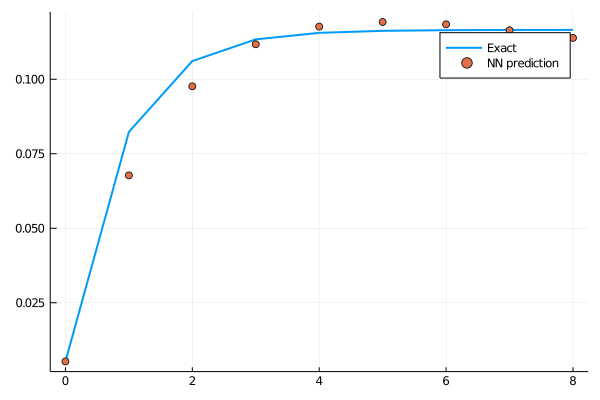

loss: 0.00526:  23%|█████████▍                               |  ETA: 0:01:02

0.005075943246251319

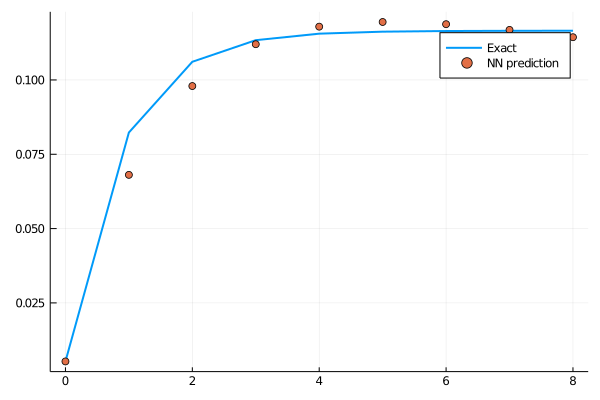

loss: 0.00508:  23%|█████████▌                               |  ETA: 0:01:02

0.004917076375394138

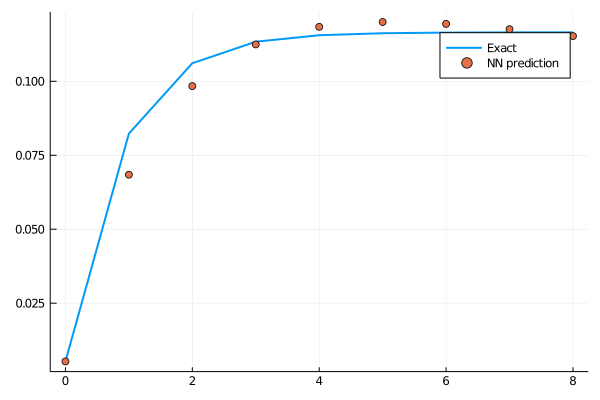

loss: 0.00492:  24%|█████████▋                               |  ETA: 0:01:01

0.004748449481586777

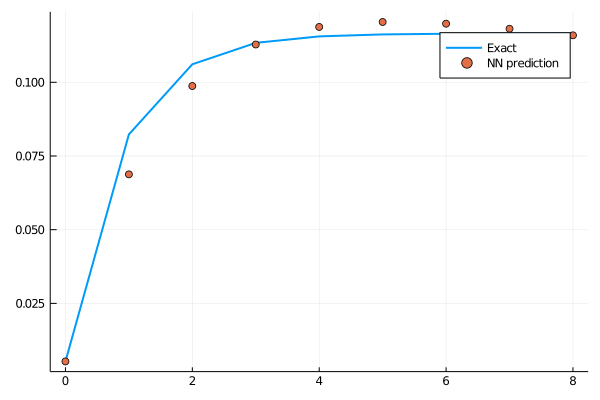

loss: 0.00475:  24%|█████████▉                               |  ETA: 0:01:01

0.004565666350913547

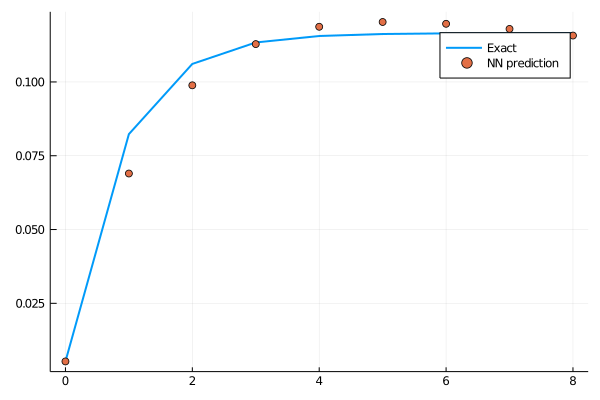

loss: 0.00457:  24%|██████████                               |  ETA: 0:01:00

0.004398119279093095

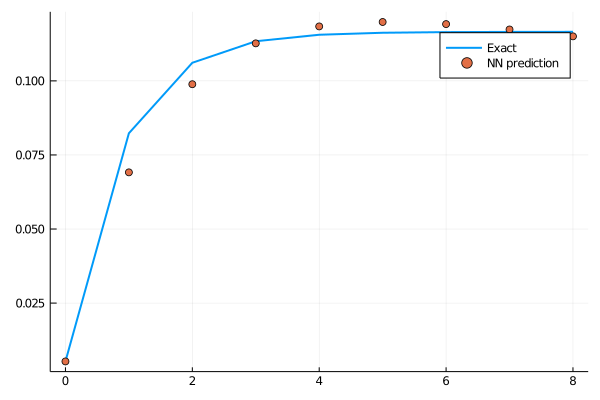

loss: 0.0044:  25%|██████████▏                              |  ETA: 0:01:00

0.004236483236874665

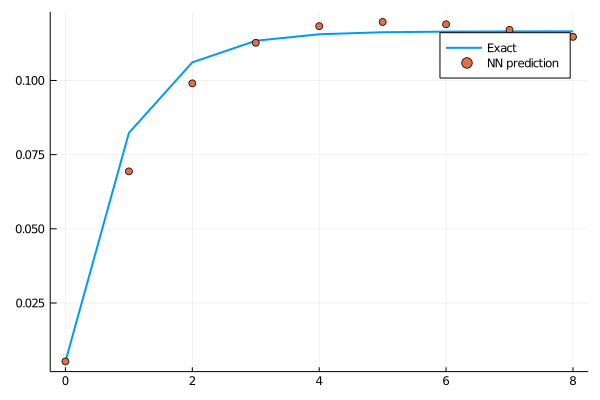

loss: 0.00424:  25%|██████████▎                              |  ETA: 0:00:59

0.004081603597069011

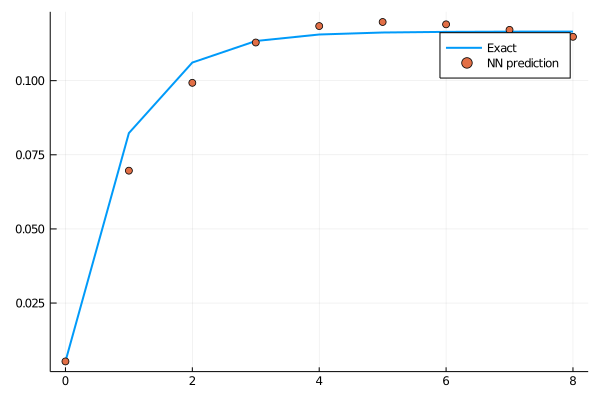

loss: 0.00408:  25%|██████████▍                              |  ETA: 0:00:59

0.00394533592193876

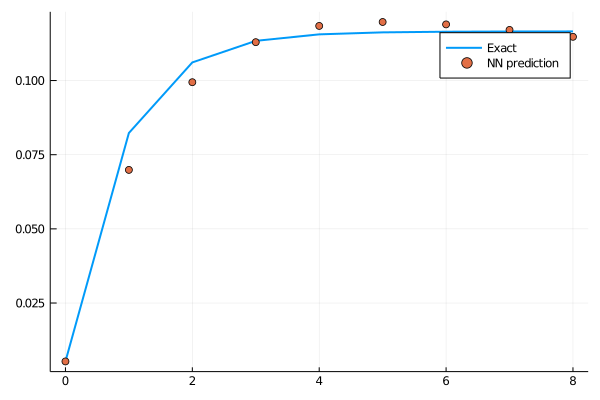

loss: 0.00395:  26%|██████████▌                              |  ETA: 0:00:58

0.0038271864895671605

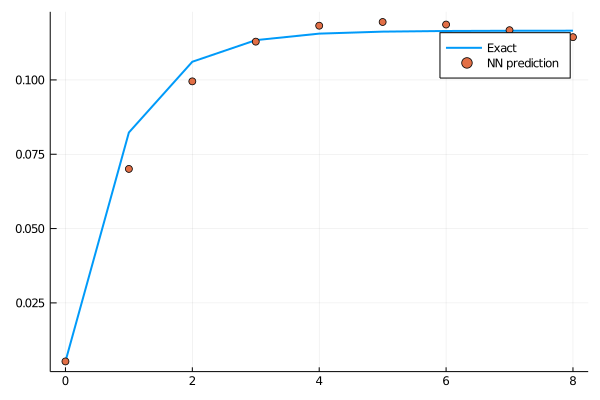

loss: 0.00383:  26%|██████████▋                              |  ETA: 0:00:58

0.003714904368106219

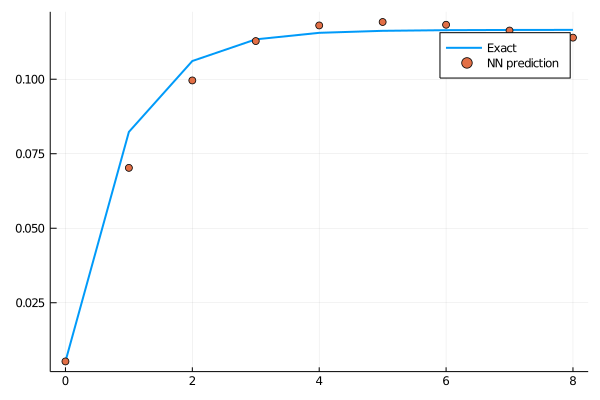

loss: 0.00371:  26%|██████████▊                              |  ETA: 0:00:58

0.003603393019499484

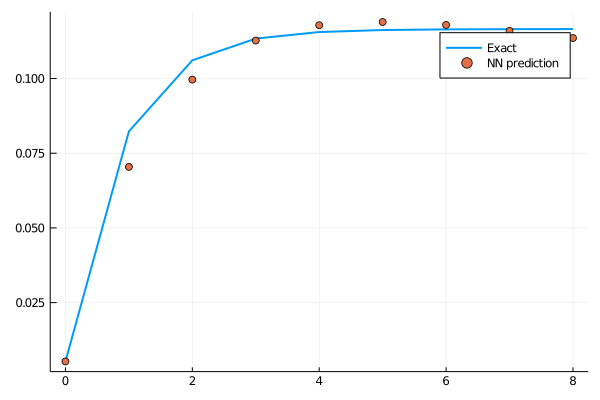

loss: 0.0036:  27%|██████████▉                              |  ETA: 0:00:57

0.0034874111296746262

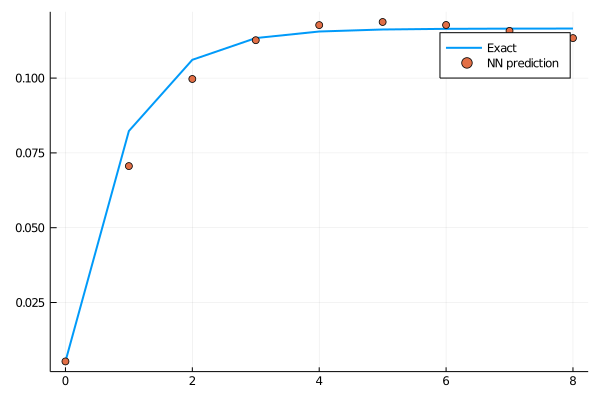

loss: 0.00349:  27%|███████████▏                             |  ETA: 0:00:57

0.0033671912444370733

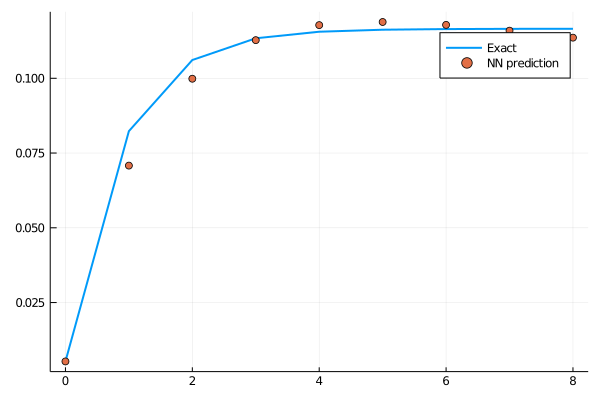

loss: 0.00337:  27%|███████████▎                             |  ETA: 0:00:56

0.0032503960640397423

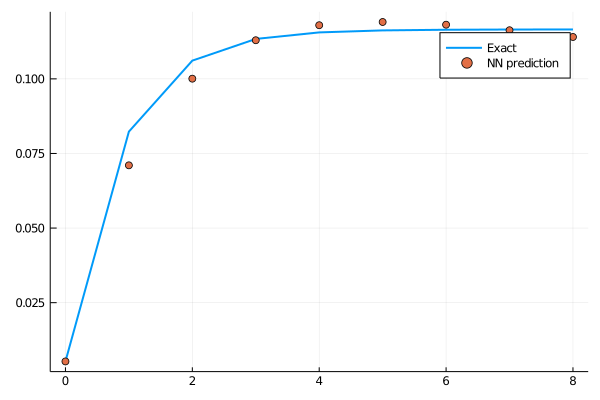

loss: 0.00325:  28%|███████████▍                             |  ETA: 0:00:56

0.0031489925718254158

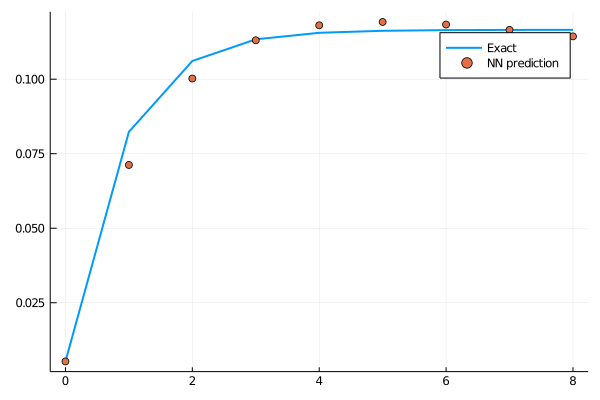

loss: 0.00315:  28%|███████████▌                             |  ETA: 0:00:55

0.0030623522573700176

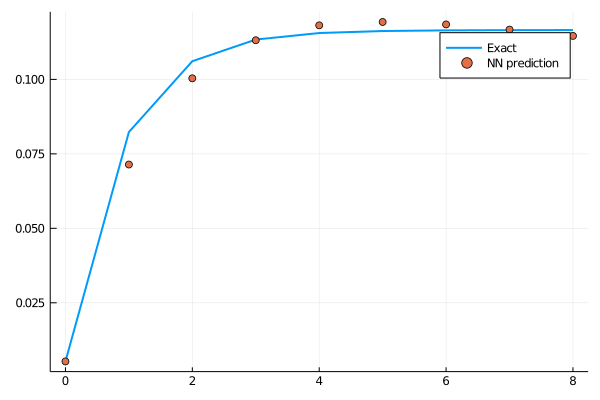

loss: 0.00306:  28%|███████████▋                             |  ETA: 0:00:55

0.0029787520548007576

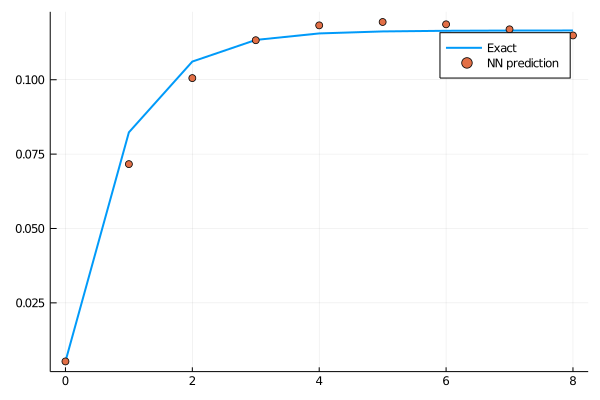

loss: 0.00298:  29%|███████████▊                             |  ETA: 0:00:55

0.0028898356415584564

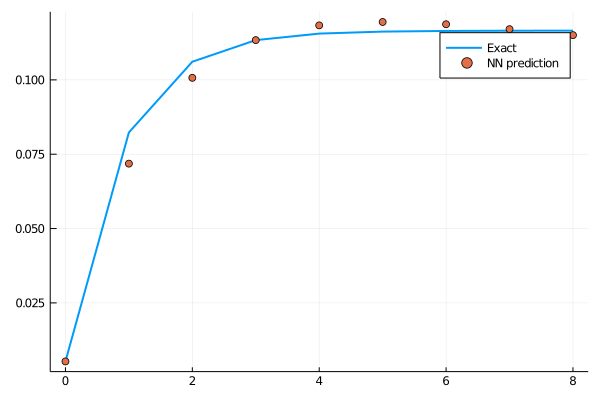

loss: 0.00289:  29%|███████████▉                             |  ETA: 0:00:54

0.0027949746302521413

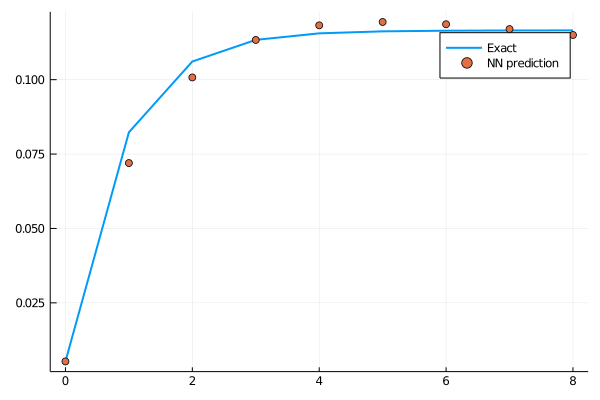

loss: 0.00279:  29%|████████████                             |  ETA: 0:00:54

0.0027034783296450058

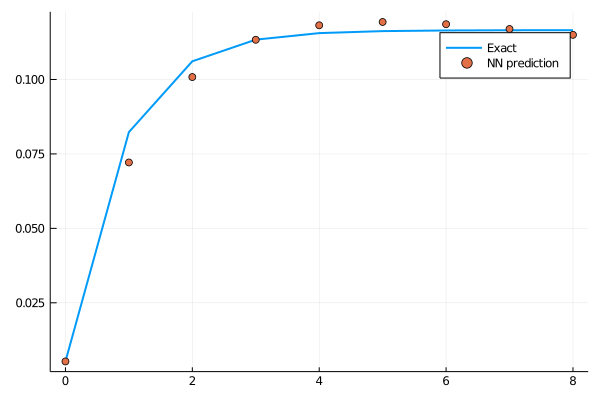

loss: 0.0027:  30%|████████████▏                            |  ETA: 0:00:54

0.0026196839932664086

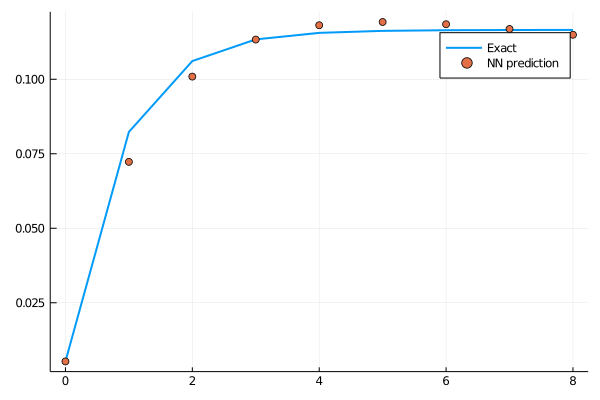

loss: 0.00262:  30%|████████████▎                            |  ETA: 0:00:53

0.002545142549629372

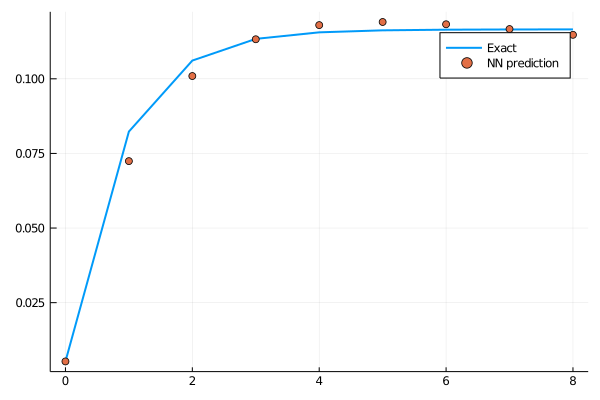

loss: 0.00255:  30%|████████████▍                            |  ETA: 0:00:53

0.002476276222722498

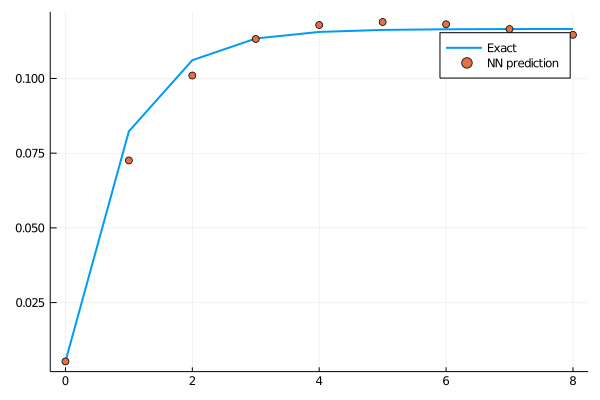

loss: 0.00248:  31%|████████████▌                            |  ETA: 0:00:52

0.002405532775592566

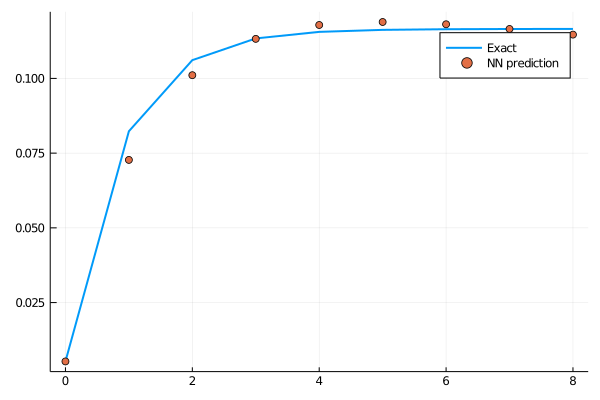

loss: 0.00241:  31%|████████████▊                            |  ETA: 0:00:52

0.0023335167036589687

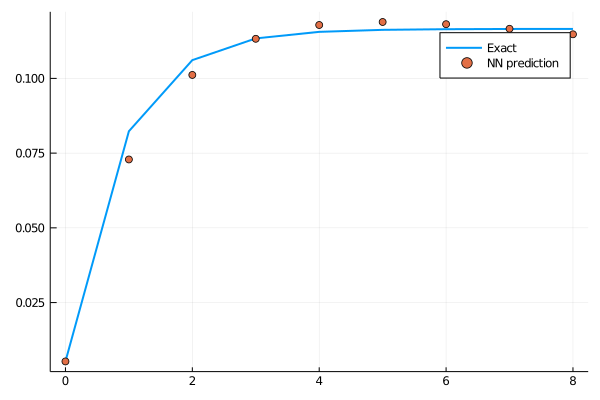

loss: 0.00233:  31%|████████████▉                            |  ETA: 0:00:52

0.002261600375085361

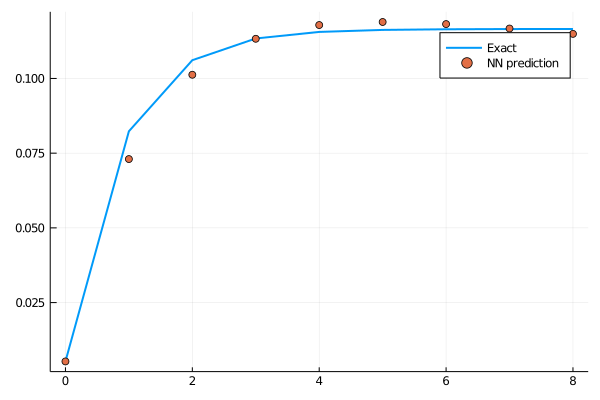

loss: 0.00226:  32%|█████████████                            |  ETA: 0:00:51

0.0021939762701235037

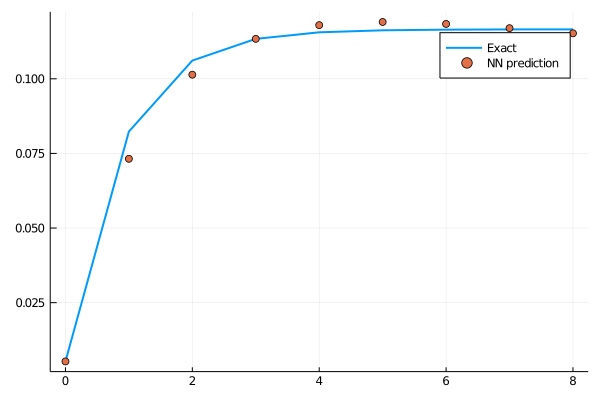

loss: 0.00219:  32%|█████████████▏                           |  ETA: 0:00:51

0.0021332183444141943

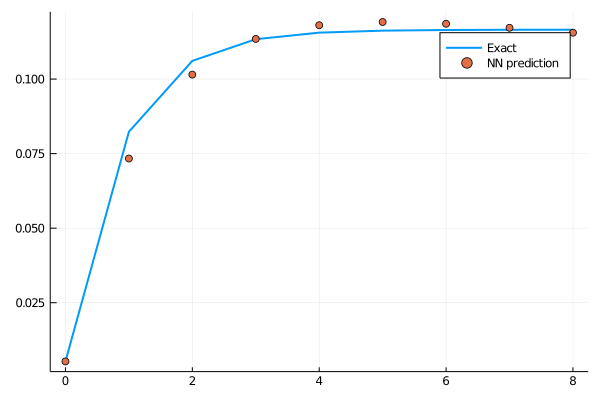

loss: 0.00213:  32%|█████████████▎                           |  ETA: 0:00:50

0.0020768957046662043

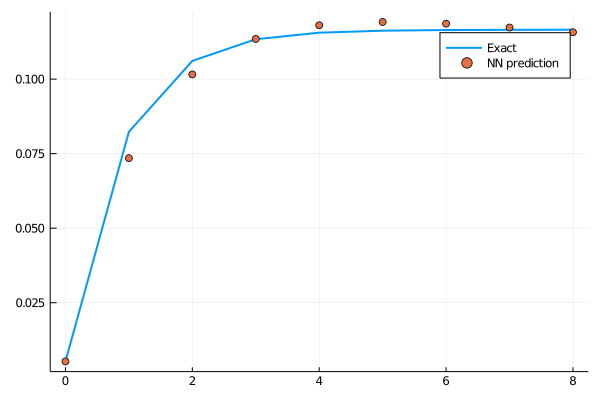

loss: 0.00208:  33%|█████████████▍                           |  ETA: 0:00:50

0.0020214551653515585

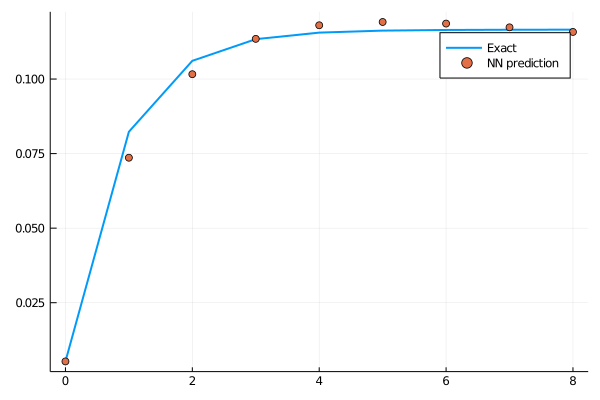

loss: 0.00202:  33%|█████████████▌                           |  ETA: 0:00:50

0.001964930272074784

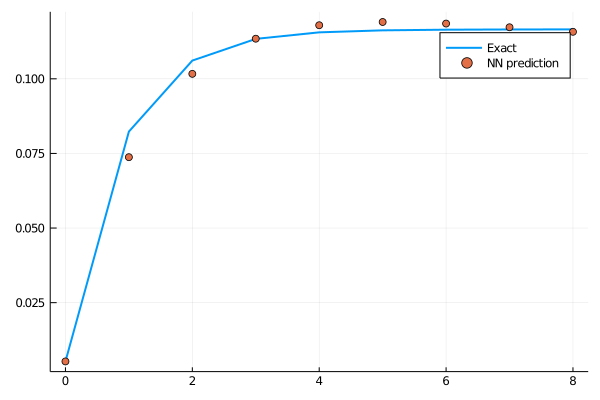

loss: 0.00196:  33%|█████████████▋                           |  ETA: 0:00:49

0.0019082019902991914

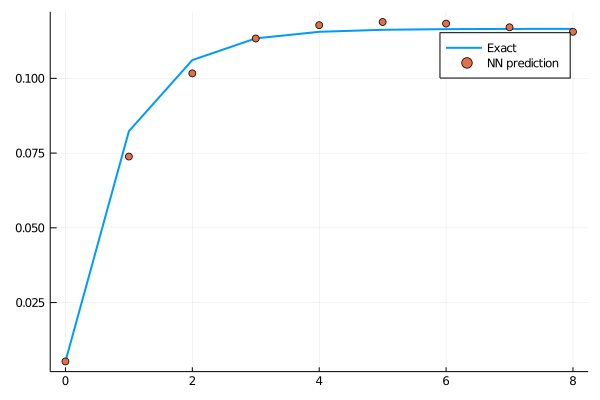

loss: 0.00191:  34%|█████████████▊                           |  ETA: 0:00:49

0.0018546021809181116

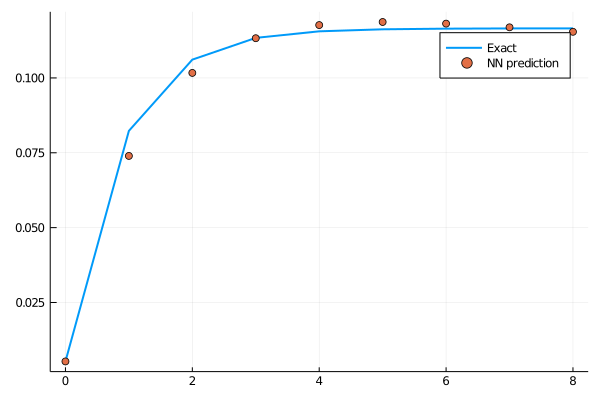

loss: 0.00185:  34%|██████████████                           |  ETA: 0:00:49

0.00180481003903908

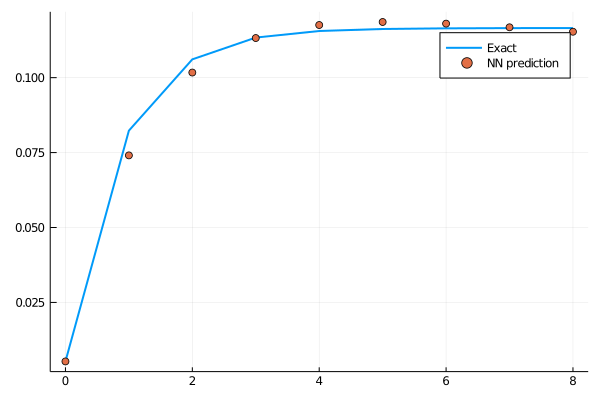

loss: 0.0018:  34%|██████████████▏                          |  ETA: 0:00:48

0.0017575440850617235

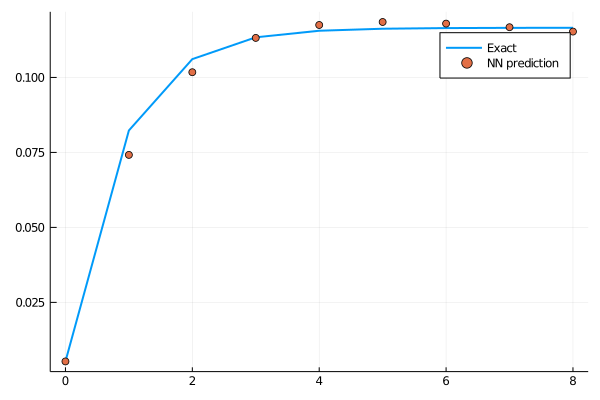

loss: 0.00176:  35%|██████████████▏                          |  ETA: 0:00:48

0.0017116841622470626

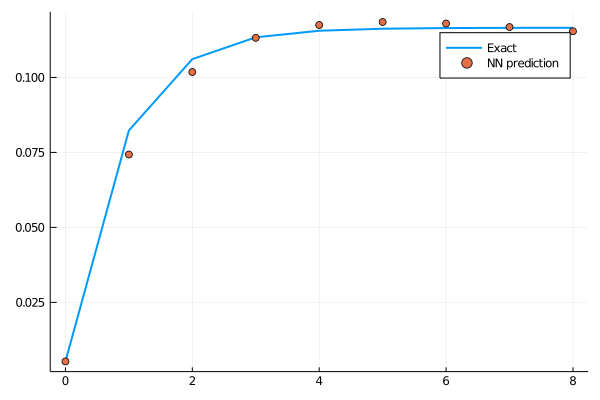

loss: 0.00171:  35%|██████████████▍                          |  ETA: 0:00:48

0.0016658542581902875

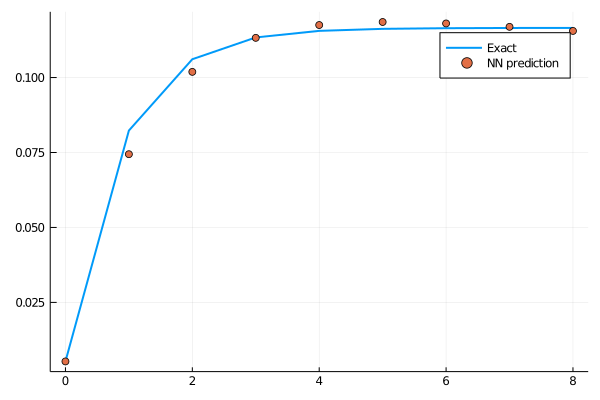

loss: 0.00167:  35%|██████████████▌                          |  ETA: 0:00:47

0.0016205640045966906

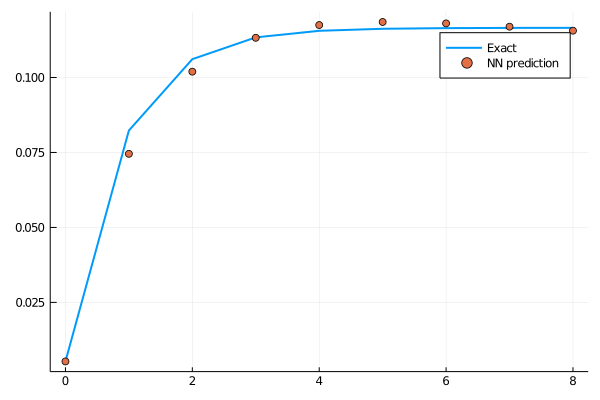

loss: 0.00162:  36%|██████████████▋                          |  ETA: 0:00:47

0.0015771888193860932

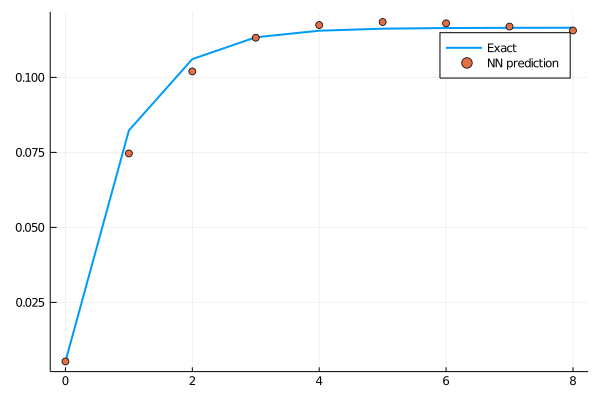

loss: 0.00158:  36%|██████████████▊                          |  ETA: 0:00:47

0.0015357440883186468

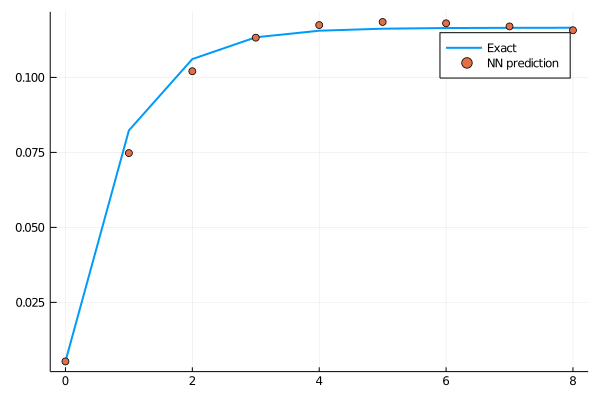

loss: 0.00154:  36%|██████████████▉                          |  ETA: 0:00:46

0.0014961336504621158

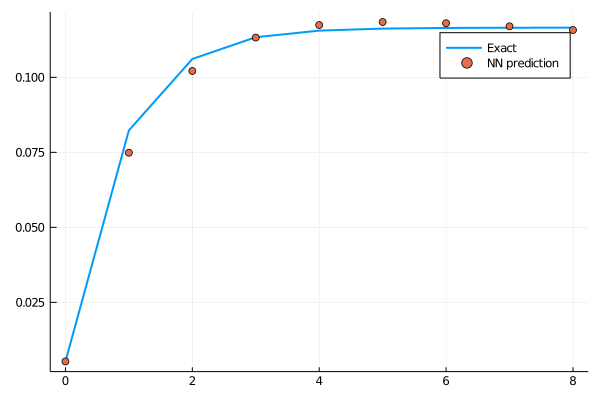

loss: 0.0015:  37%|███████████████                          |  ETA: 0:00:46

0.0014579398534211798

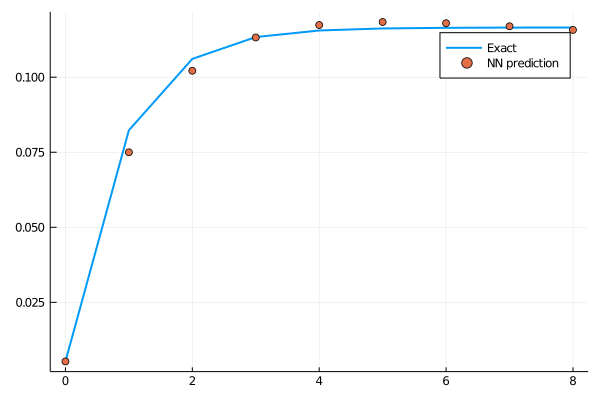

loss: 0.00146:  37%|███████████████▏                         |  ETA: 0:00:46

0.001420176927150505

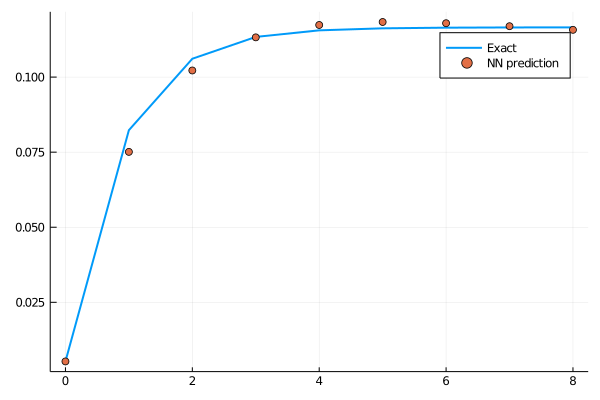

loss: 0.00142:  37%|███████████████▎                         |  ETA: 0:00:46

0.0013832659887865397

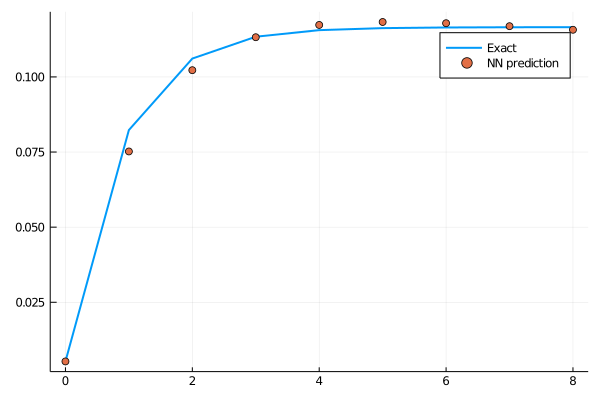

loss: 0.00138:  38%|███████████████▍                         |  ETA: 0:00:45

0.0013476552295463627

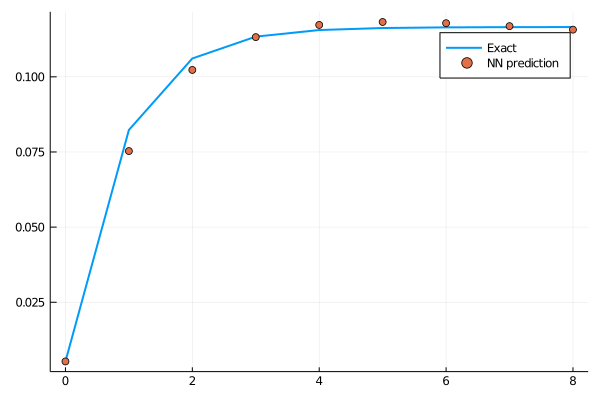

loss: 0.00135:  38%|███████████████▋                         |  ETA: 0:00:45

0.0013131747862908294

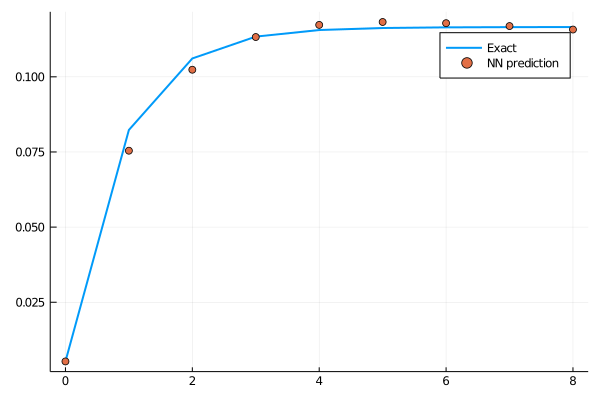

loss: 0.00131:  38%|███████████████▊                         |  ETA: 0:00:45

0.001279916190031475

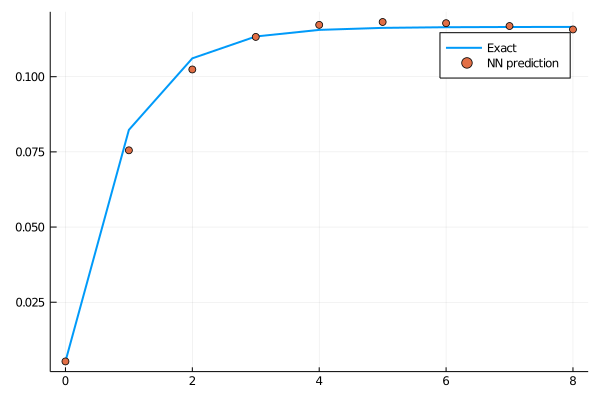

loss: 0.00128:  39%|███████████████▉                         |  ETA: 0:00:44

0.0012478642662372716

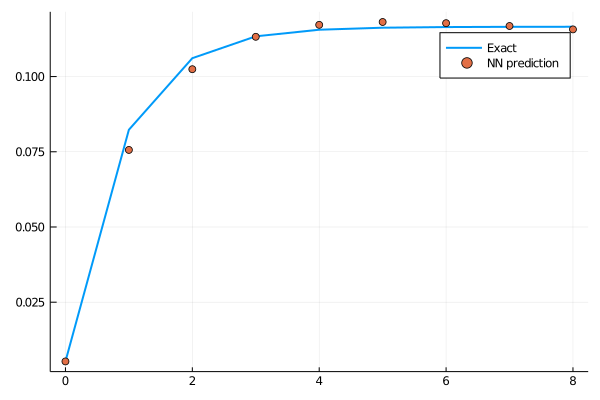

loss: 0.00125:  39%|████████████████                         |  ETA: 0:00:44

0.0012168598748042983

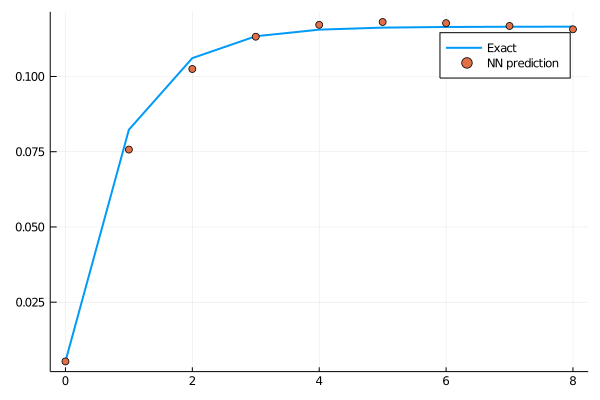

loss: 0.00122:  39%|████████████████▏                        |  ETA: 0:00:44

0.0011865327208266955

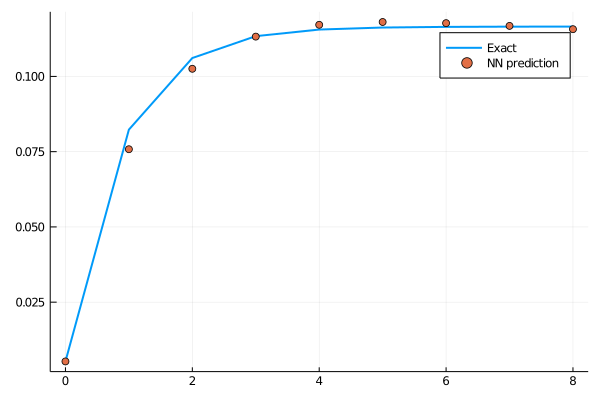

loss: 0.00119:  40%|████████████████▎                        |  ETA: 0:00:43

0.0011569578103230213

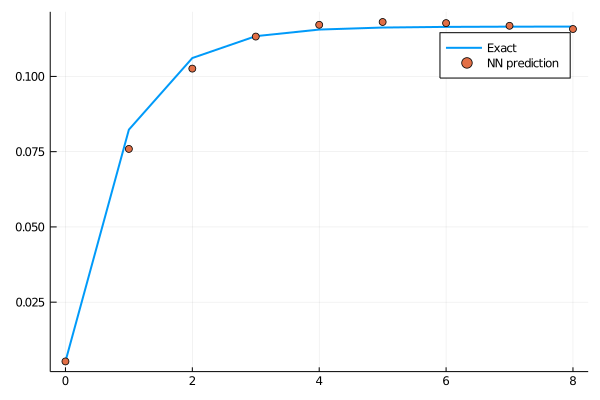

loss: 0.00116:  40%|████████████████▍                        |  ETA: 0:00:43

0.0011283074580924763

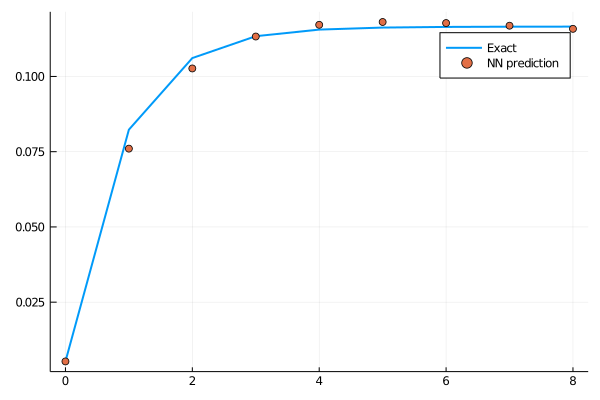

loss: 0.00113:  40%|████████████████▌                        |  ETA: 0:00:43

0.0011006159873705823

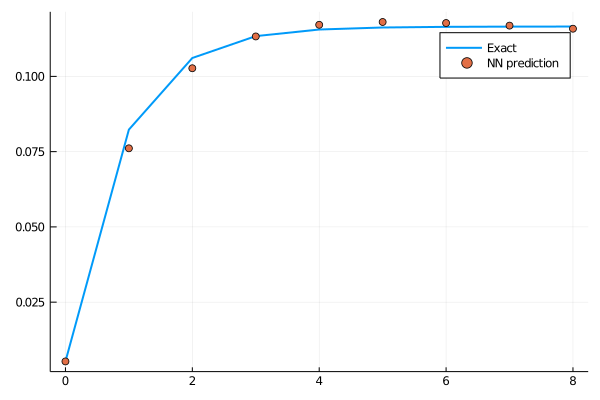

loss: 0.0011:  41%|████████████████▋                        |  ETA: 0:00:42

0.0010738487635406668

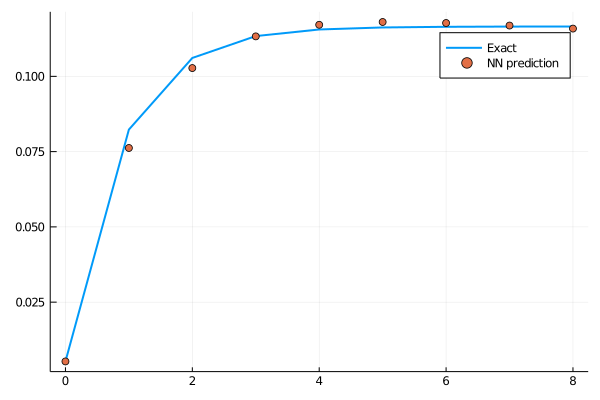

loss: 0.00107:  41%|████████████████▊                        |  ETA: 0:00:42

0.0010479788888408377

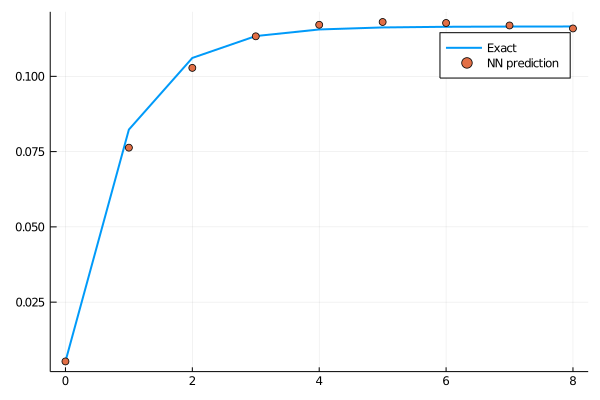

loss: 0.00105:  41%|████████████████▉                        |  ETA: 0:00:42

0.001022785741507283

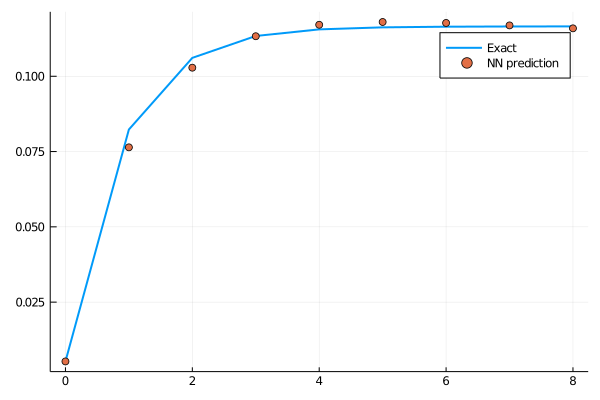

loss: 0.00102:  42%|█████████████████                        |  ETA: 0:00:42

0.0009981192828269158

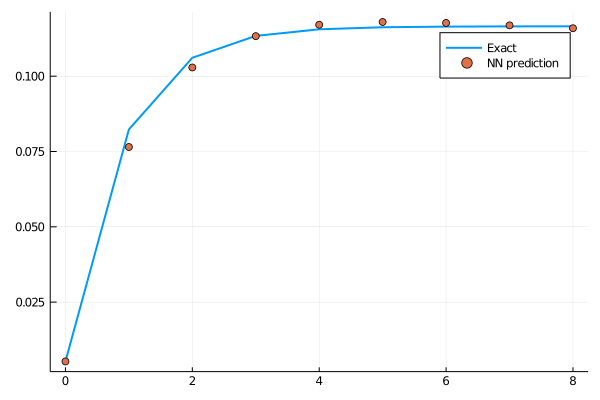

loss: 0.000998:  42%|█████████████████▎                       |  ETA: 0:00:41

0.000974116860082627

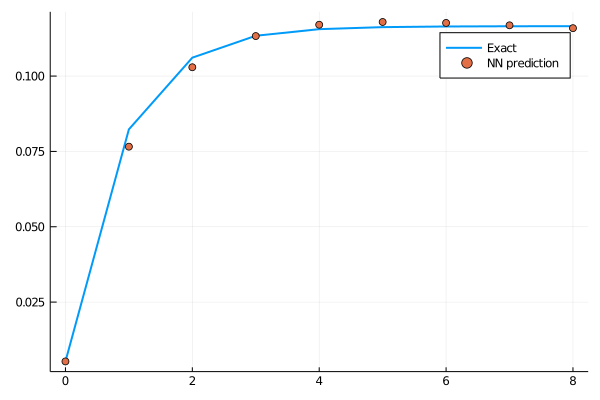

loss: 0.000974:  42%|█████████████████▍                       |  ETA: 0:00:41

0.0009509735781894612

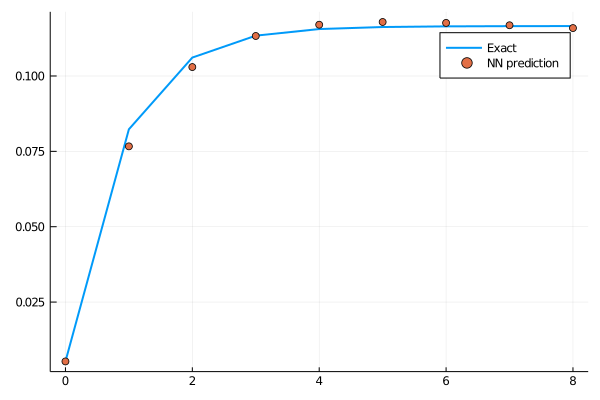

loss: 0.000951:  43%|█████████████████▌                       |  ETA: 0:00:41

0.0009286422199232749

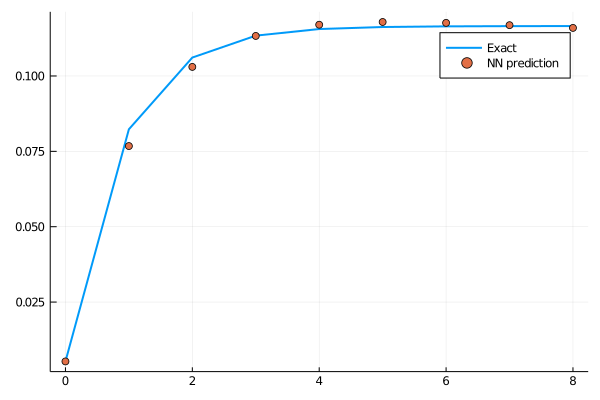

loss: 0.000929:  43%|█████████████████▋                       |  ETA: 0:00:40

0.0009069292891519582

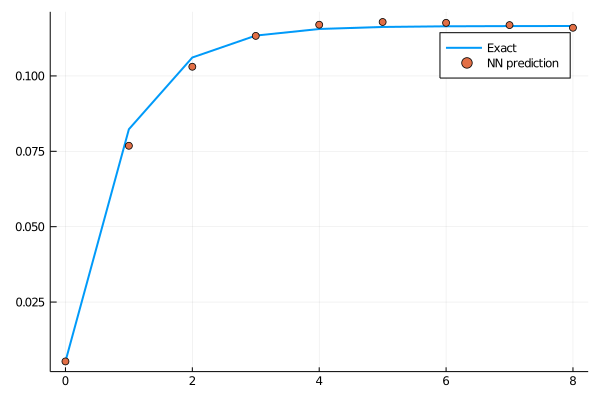

loss: 0.000907:  43%|█████████████████▊                       |  ETA: 0:00:40

0.000885717150844282

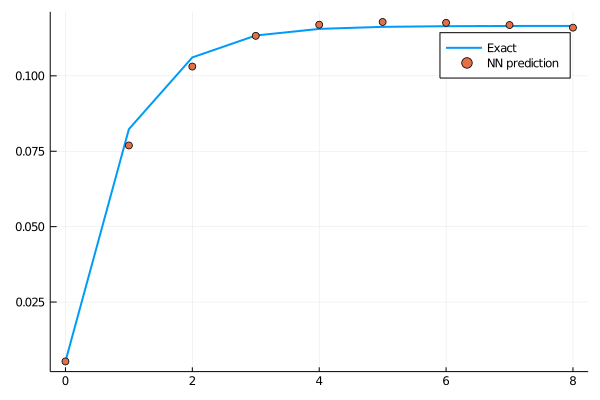

loss: 0.000886:  44%|█████████████████▉                       |  ETA: 0:00:40

0.0008649921871789376

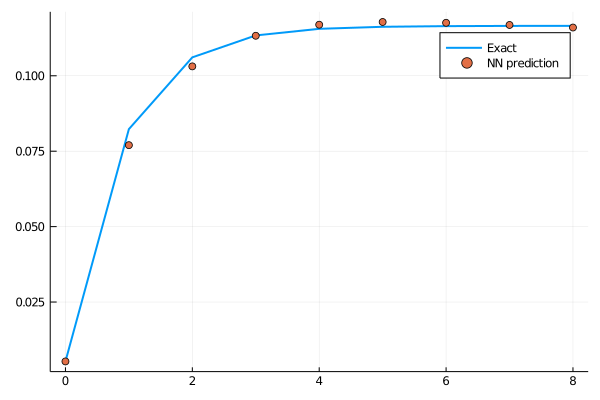

loss: 0.000865:  44%|██████████████████                       |  ETA: 0:00:39

0.0008448660496880675

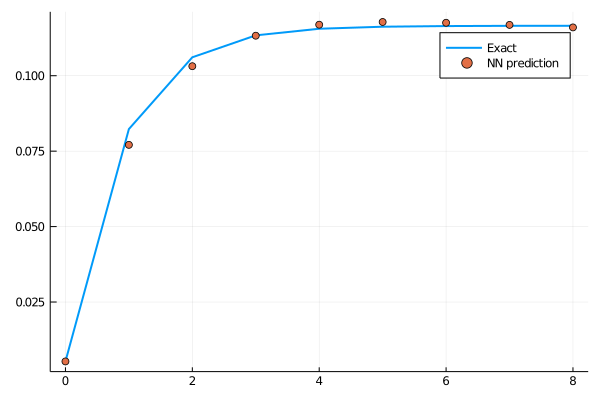

loss: 0.000845:  44%|██████████████████▏                      |  ETA: 0:00:39

0.0008254140732185056

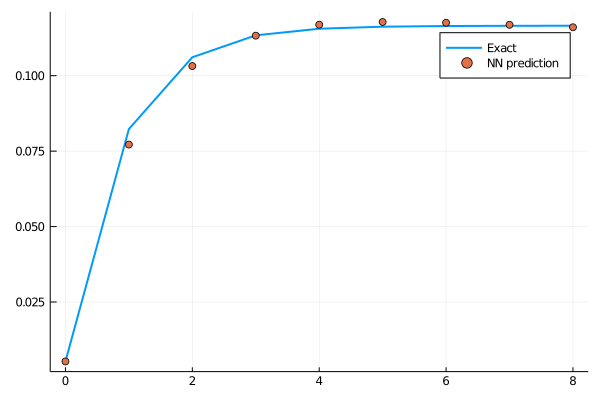

loss: 0.000825:  45%|██████████████████▎                      |  ETA: 0:00:39

0.0008065799240845967

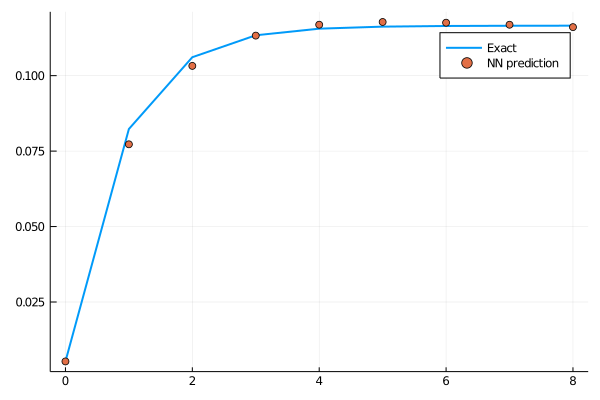

loss: 0.000807:  45%|██████████████████▌                      |  ETA: 0:00:39

0.0007882392221008476

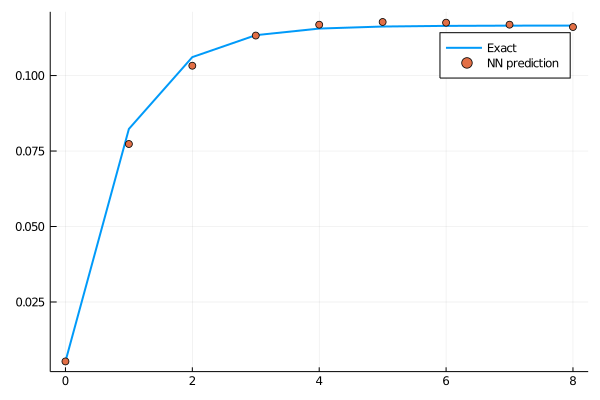

loss: 0.000788:  45%|██████████████████▋                      |  ETA: 0:00:38

0.0007703182917212877

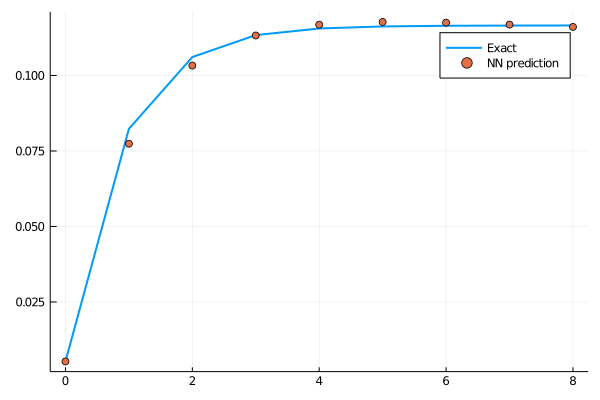

loss: 0.00077:  46%|██████████████████▊                      |  ETA: 0:00:38

0.0007528822920026117

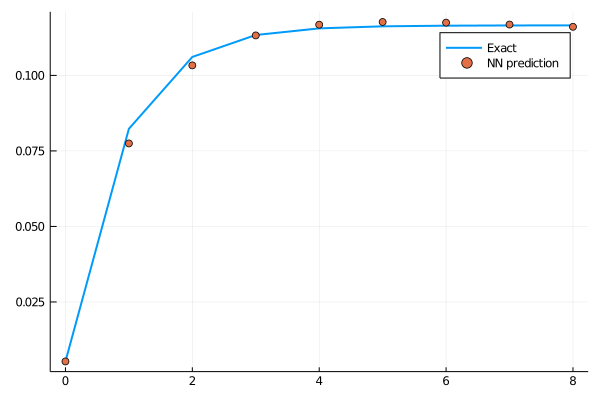

loss: 0.000753:  46%|██████████████████▉                      |  ETA: 0:00:38

0.0007359498317252135

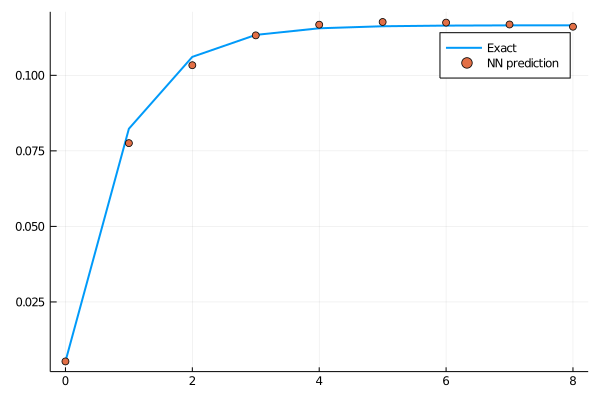

loss: 0.000736:  46%|███████████████████                      |  ETA: 0:00:38

0.0007195469845551496

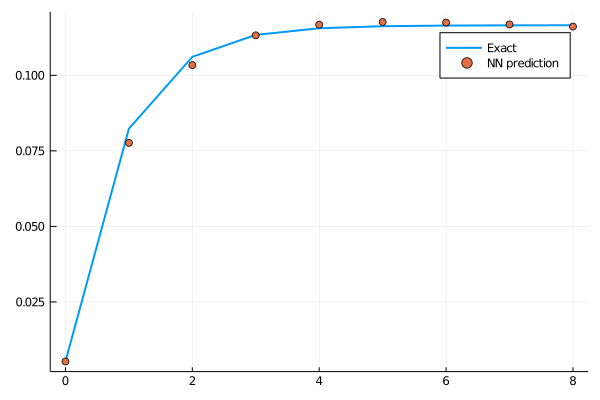

loss: 0.00072:  47%|███████████████████▏                     |  ETA: 0:00:37

0.0007036173676499419

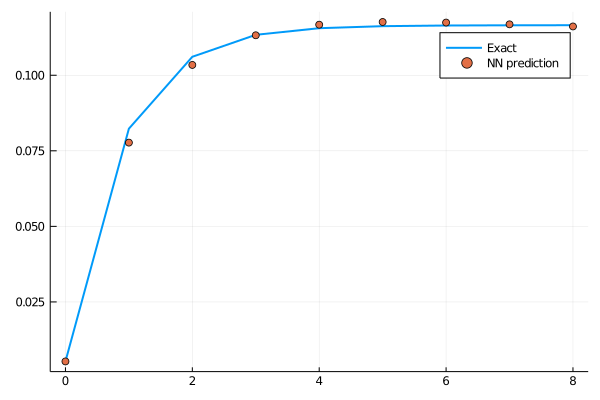

loss: 0.000704:  47%|███████████████████▎                     |  ETA: 0:00:37

0.0006880805386241144

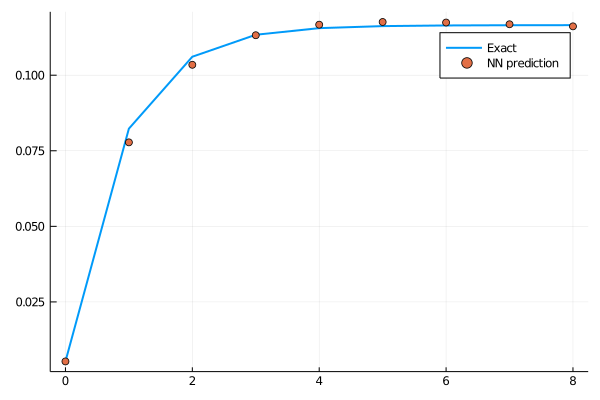

loss: 0.000688:  47%|███████████████████▍                     |  ETA: 0:00:37

0.0006729467912480208

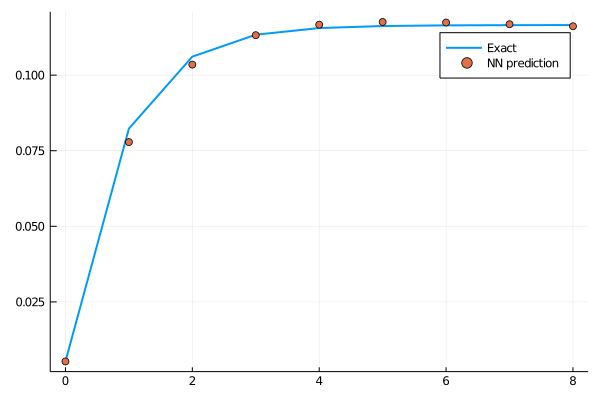

loss: 0.000673:  48%|███████████████████▌                     |  ETA: 0:00:37

0.0006582290166437564

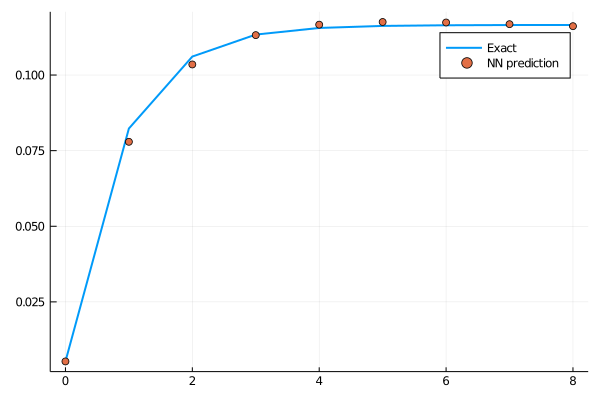

loss: 0.000658:  48%|███████████████████▋                     |  ETA: 0:00:36

0.0006439233381741347

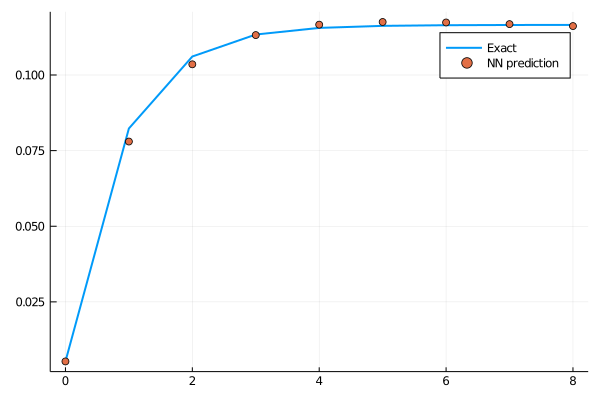

loss: 0.000644:  48%|███████████████████▊                     |  ETA: 0:00:36

0.0006300290057022343

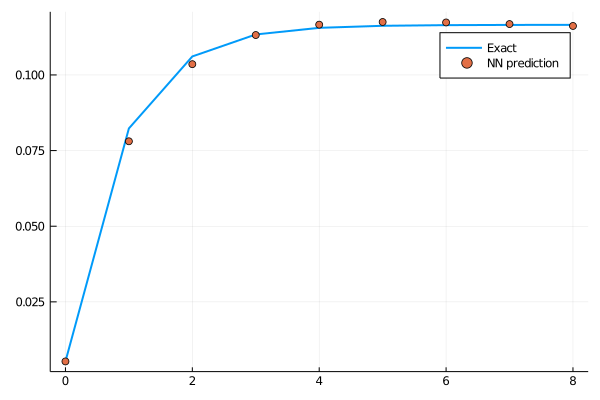

loss: 0.00063:  49%|███████████████████▉                     |  ETA: 0:00:36

0.0006165088329628643

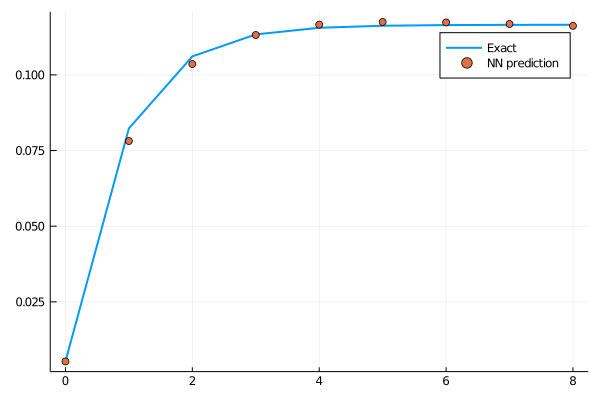

loss: 0.000617:  49%|████████████████████▏                    |  ETA: 0:00:35

0.0006033422515698388

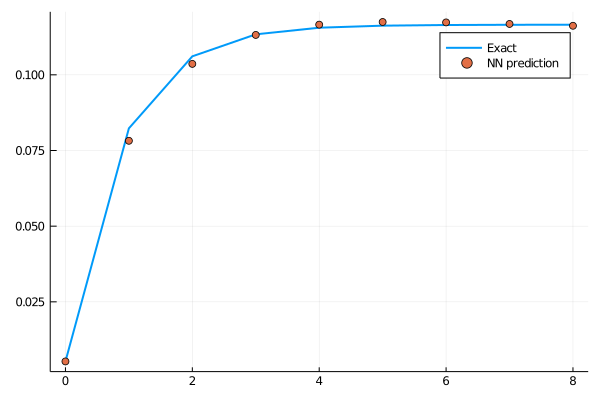

loss: 0.000603:  49%|████████████████████▎                    |  ETA: 0:00:35

0.0005905164330496365

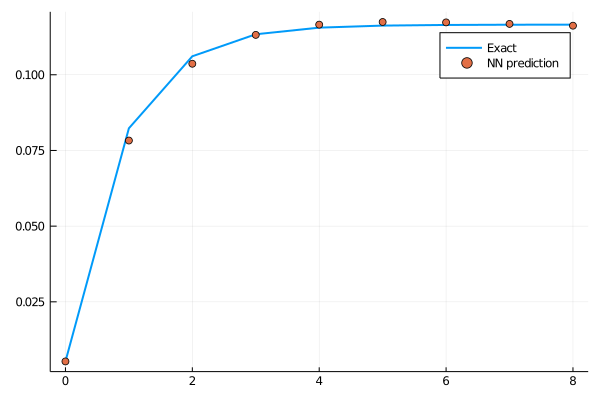

loss: 0.000591:  50%|████████████████████▍                    |  ETA: 0:00:35

0.0005780355288339459

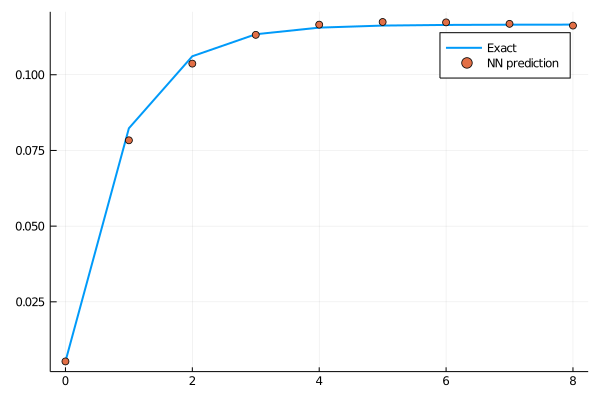

loss: 0.000578:  50%|████████████████████▌                    |  ETA: 0:00:35

0.0005658962475831212

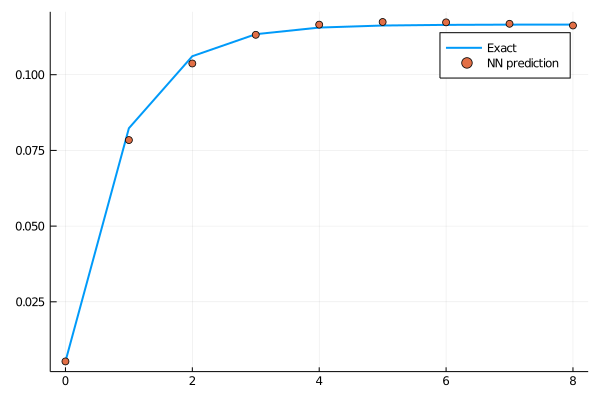

loss: 0.000566:  50%|████████████████████▋                    |  ETA: 0:00:35

0.0005540794109960026

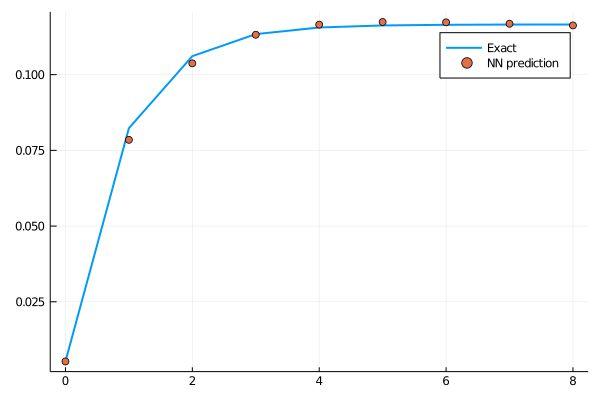

loss: 0.000554:  51%|████████████████████▊                    |  ETA: 0:00:34

0.0005425812159279833

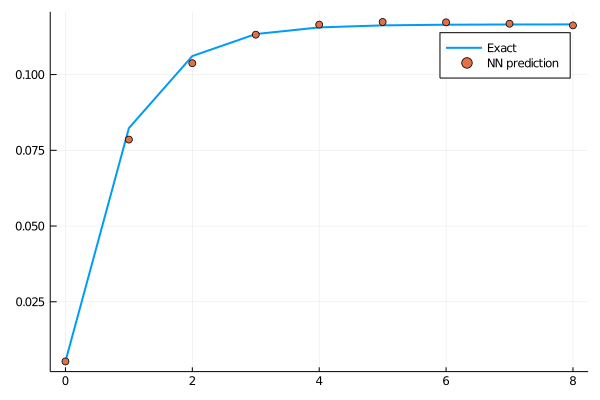

loss: 0.000543:  51%|████████████████████▉                    |  ETA: 0:00:34

0.0005313828370272078

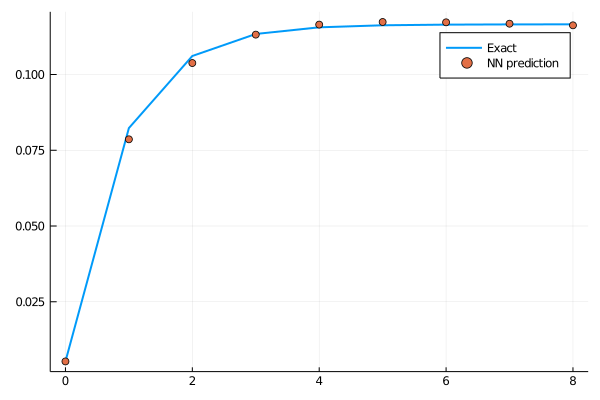

loss: 0.000531:  51%|█████████████████████                    |  ETA: 0:00:34

0.00052047689006709

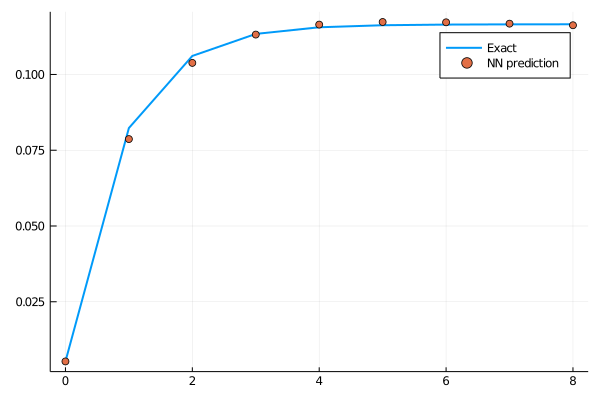

loss: 0.00052:  52%|█████████████████████▏                   |  ETA: 0:00:34

0.0005098560431773911

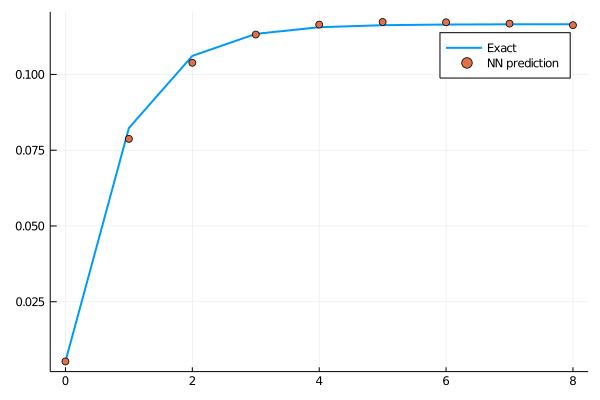

loss: 0.00051:  52%|█████████████████████▍                   |  ETA: 0:00:33

0.0004995171424159967

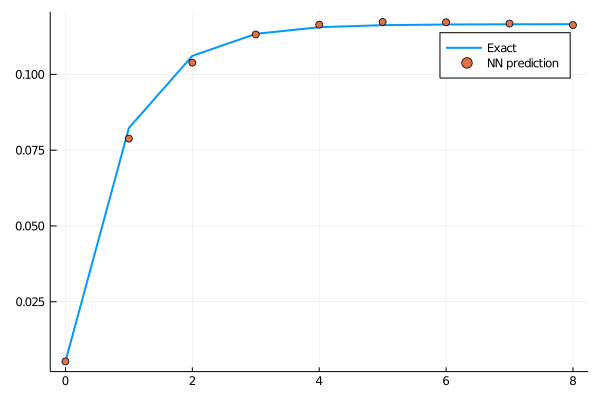

loss: 0.0005:  52%|█████████████████████▌                   |  ETA: 0:00:33

0.0004894564920756905

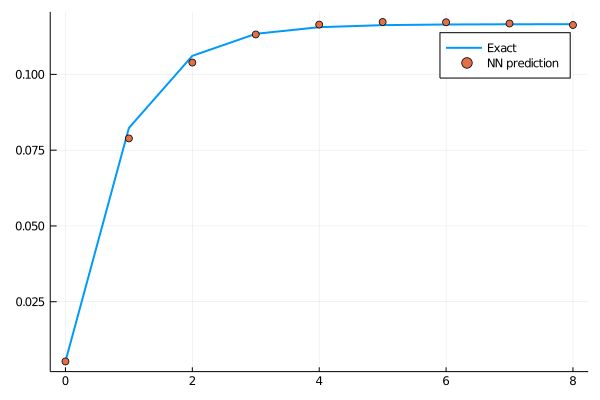

loss: 0.000489:  53%|█████████████████████▋                   |  ETA: 0:00:33

0.0004796615629712083

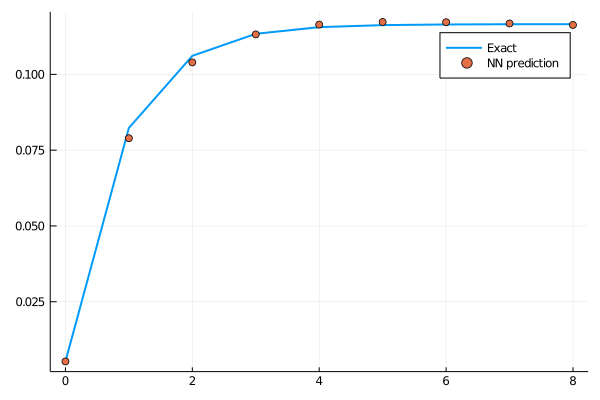

loss: 0.00048:  53%|█████████████████████▊                   |  ETA: 0:00:33

0.0004701192812885971

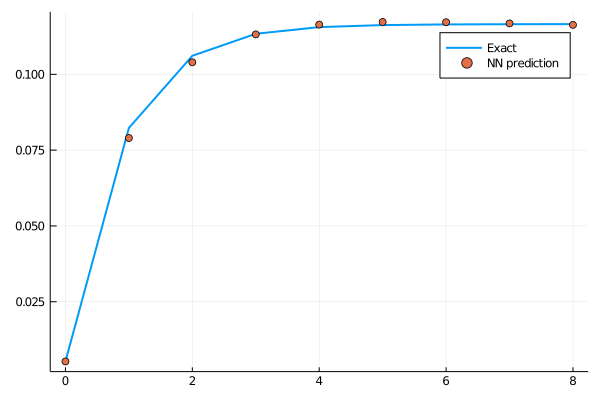

loss: 0.00047:  53%|█████████████████████▉                   |  ETA: 0:00:32

0.0004608213198755631

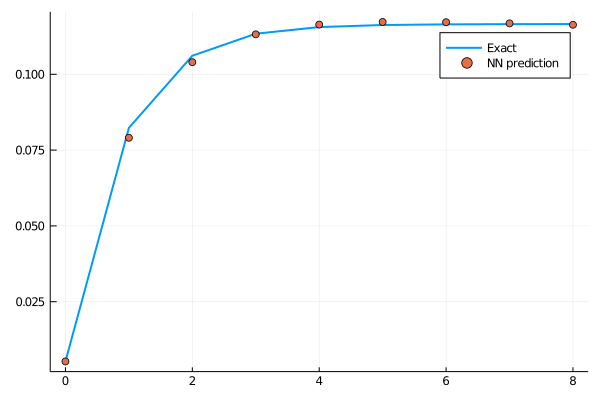

loss: 0.000461:  54%|██████████████████████                   |  ETA: 0:00:32

0.00045176400006616323

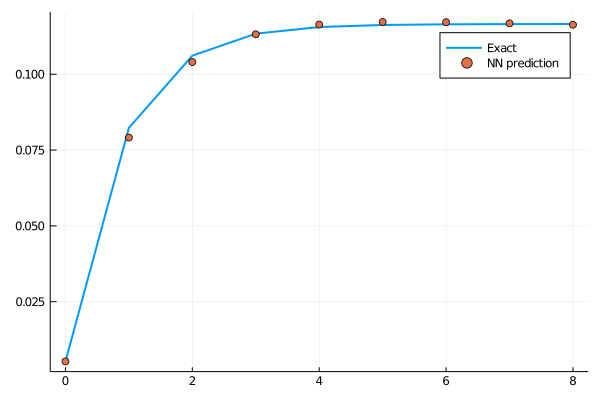

loss: 0.000452:  54%|██████████████████████▏                  |  ETA: 0:00:32

0.0004429476909343972

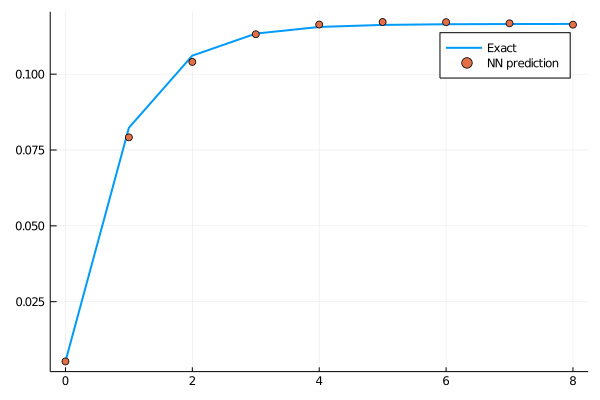

loss: 0.000443:  54%|██████████████████████▎                  |  ETA: 0:00:32

0.0004343634343010413

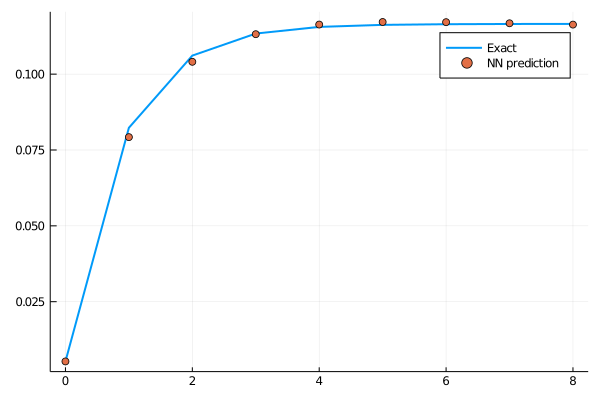

loss: 0.000434:  55%|██████████████████████▍                  |  ETA: 0:00:31

0.0004259999444641298

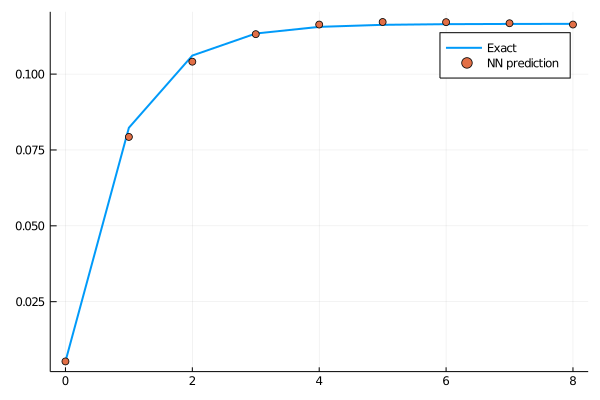

loss: 0.000426:  55%|██████████████████████▌                  |  ETA: 0:00:31

0.0004178482518182563

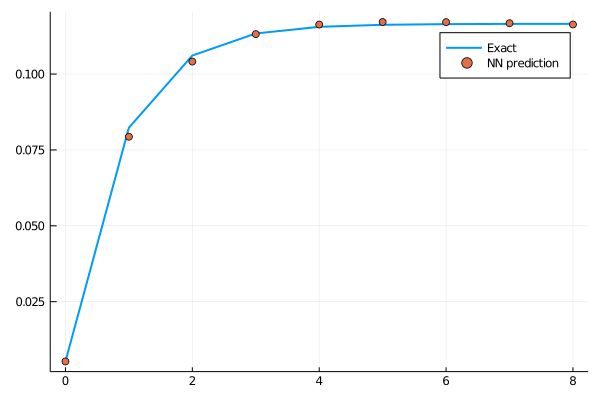

loss: 0.000418:  55%|██████████████████████▋                  |  ETA: 0:00:31

0.0004099050889331515

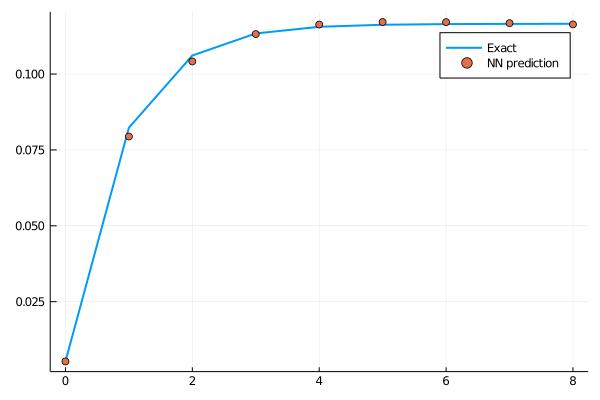

loss: 0.00041:  56%|██████████████████████▊                  |  ETA: 0:00:31

0.00040216802847657825

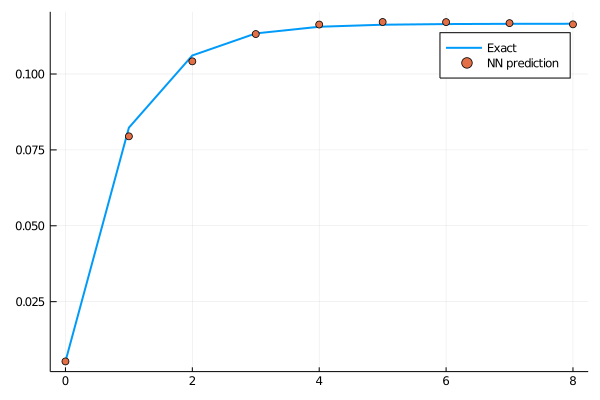

loss: 0.000402:  56%|███████████████████████                  |  ETA: 0:00:30

0.00039463332289829645

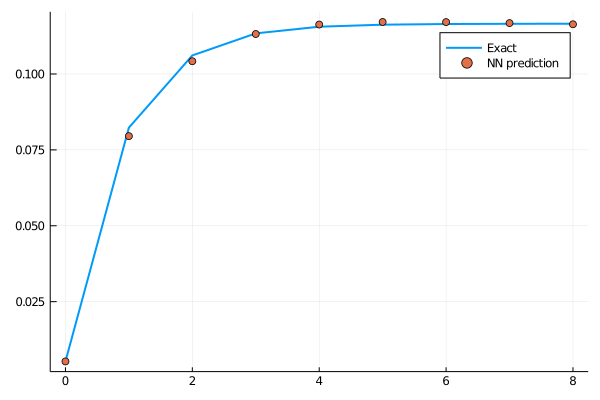

loss: 0.000395:  56%|███████████████████████▏                 |  ETA: 0:00:30

0.00038729080197521376

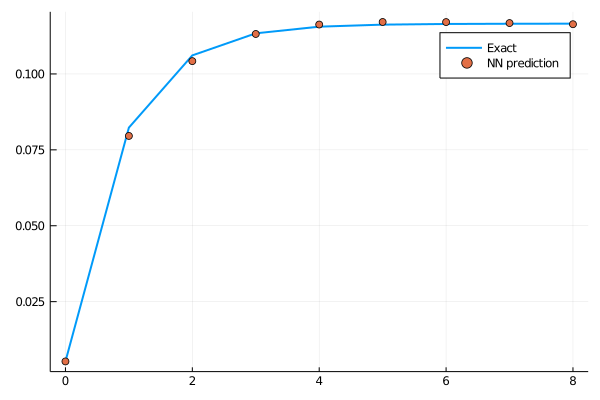

loss: 0.000387:  57%|███████████████████████▎                 |  ETA: 0:00:30

0.00038013339811731315

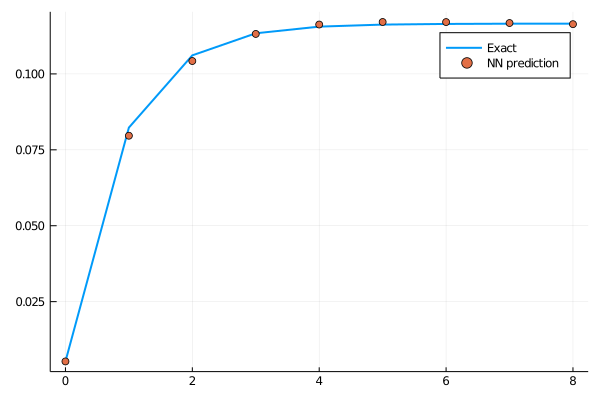

loss: 0.00038:  57%|███████████████████████▍                 |  ETA: 0:00:30

0.00037315697176423053

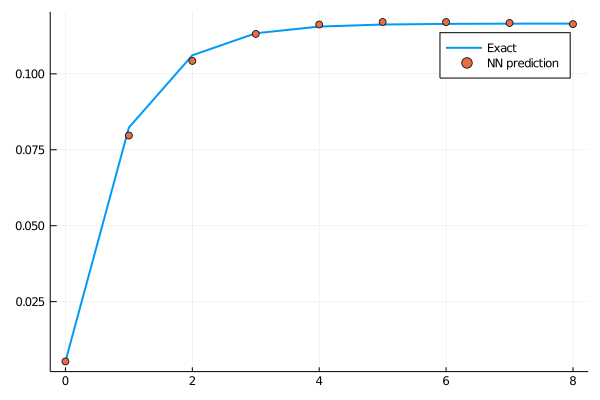

loss: 0.000373:  57%|███████████████████████▌                 |  ETA: 0:00:30

0.00036635960785066137

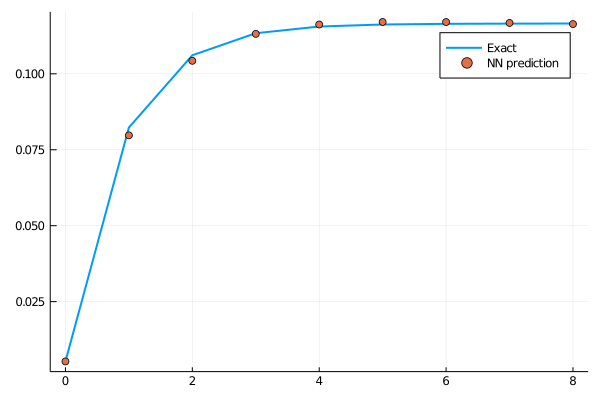

loss: 0.000366:  58%|███████████████████████▋                 |  ETA: 0:00:29

0.0003597367563363604

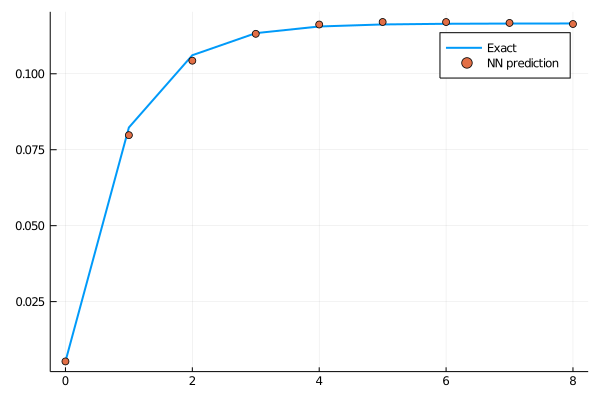

loss: 0.00036:  58%|███████████████████████▊                 |  ETA: 0:00:29

0.0003532825883311011

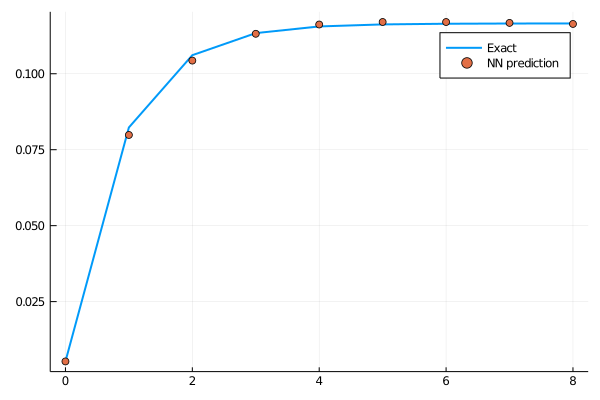

loss: 0.000353:  58%|███████████████████████▉                 |  ETA: 0:00:29

0.0003469912871342419

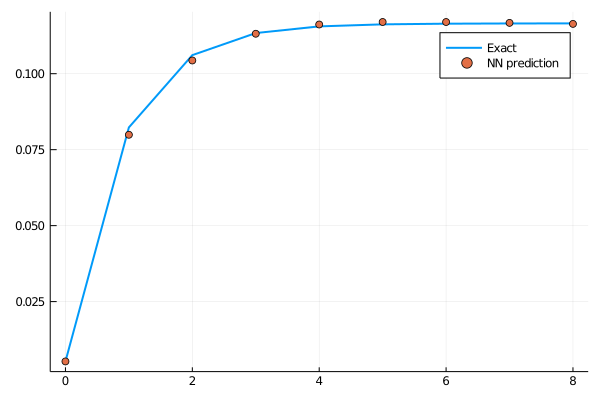

loss: 0.000347:  59%|████████████████████████                 |  ETA: 0:00:29

0.00034085839789327083

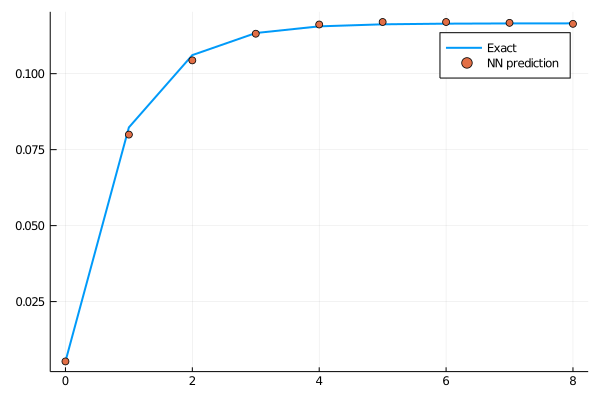

loss: 0.000341:  59%|████████████████████████▎                |  ETA: 0:00:28

0.00033488068686287877

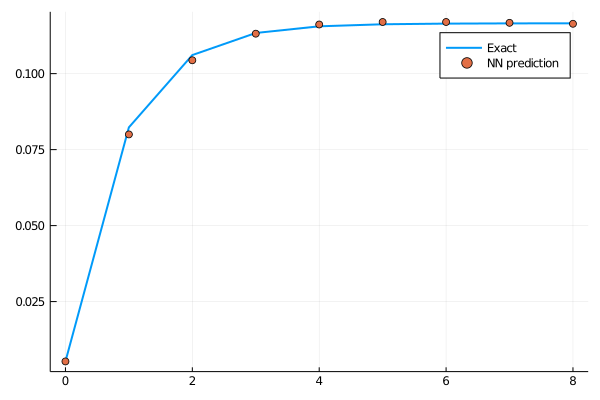

loss: 0.000335:  59%|████████████████████████▍                |  ETA: 0:00:28

0.0003290548726807806

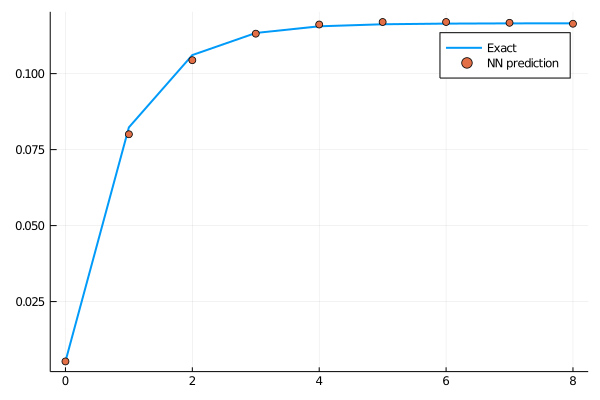

loss: 0.000329:  60%|████████████████████████▍                |  ETA: 0:00:28

0.0003233766180117947

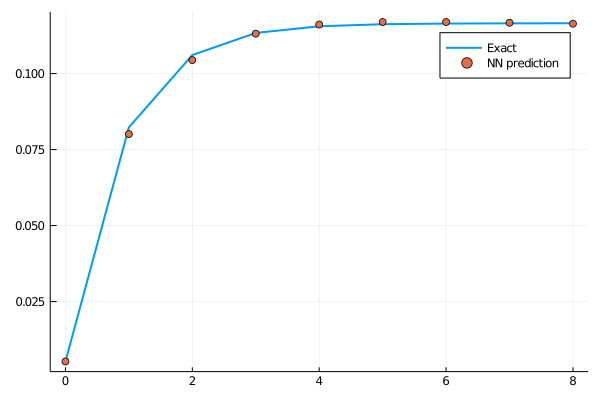

loss: 0.000323:  60%|████████████████████████▋                |  ETA: 0:00:28

0.00031784170004486585

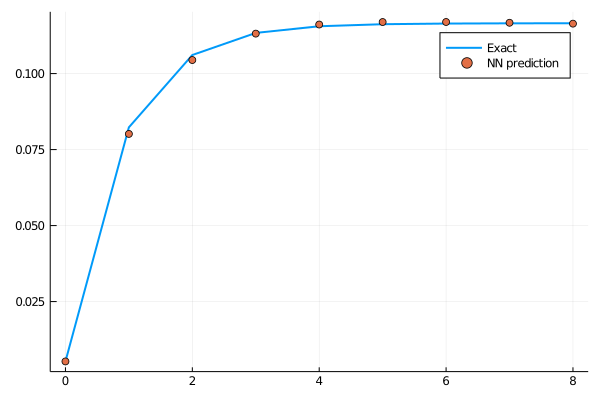

loss: 0.000318:  60%|████████████████████████▊                |  ETA: 0:00:27

0.0003124464861092633

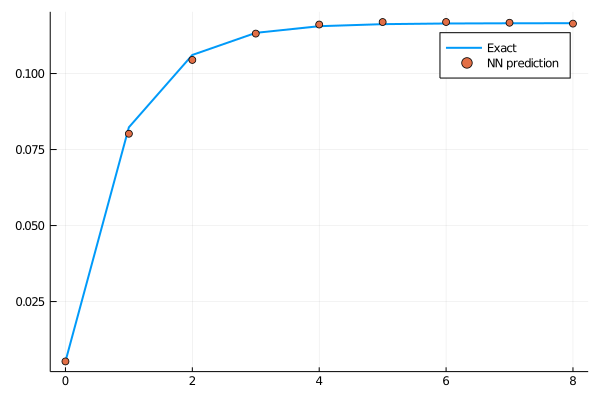

loss: 0.000312:  61%|████████████████████████▉                |  ETA: 0:00:27

0.00030718925364348423

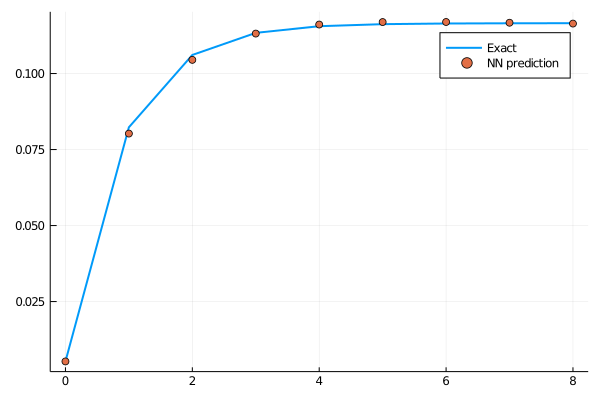

loss: 0.000307:  61%|█████████████████████████                |  ETA: 0:00:27

0.00030206898582988746

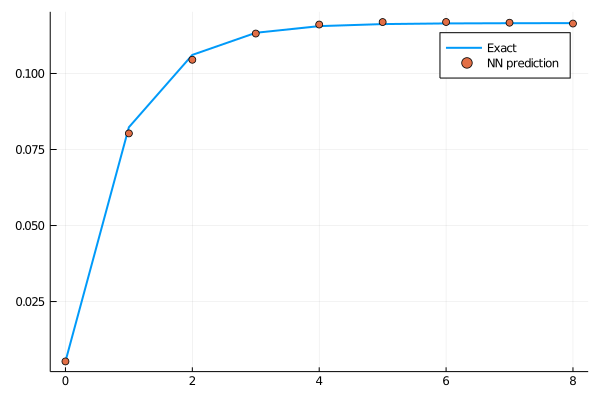

loss: 0.000302:  61%|█████████████████████████▏               |  ETA: 0:00:27

0.0002970881403287375

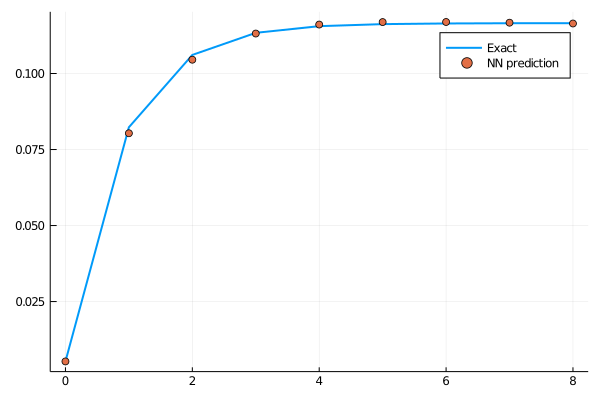

loss: 0.000297:  62%|█████████████████████████▎               |  ETA: 0:00:26

0.00029225556615586226

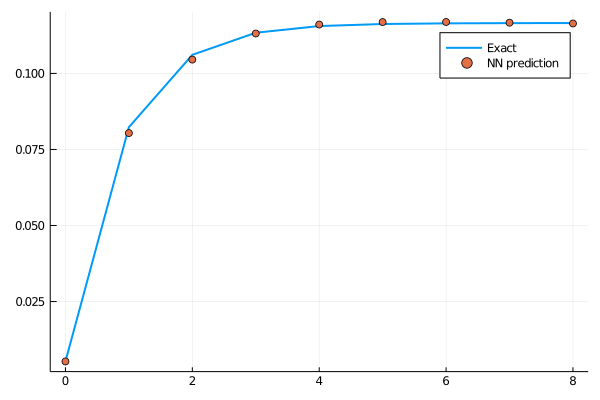

loss: 0.000292:  62%|█████████████████████████▍               |  ETA: 0:00:26

0.00028759675019969895

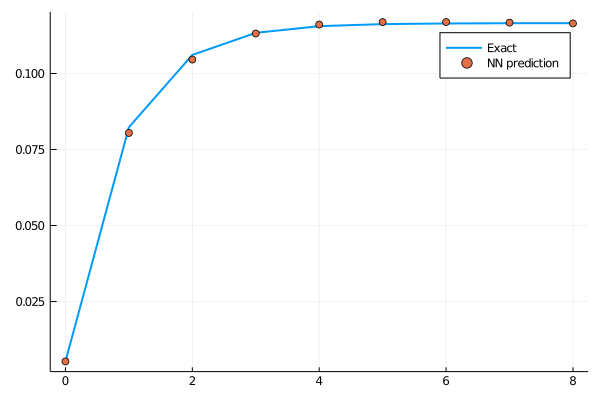

loss: 0.000288:  62%|█████████████████████████▌               |  ETA: 0:00:26

0.0002831766357402091

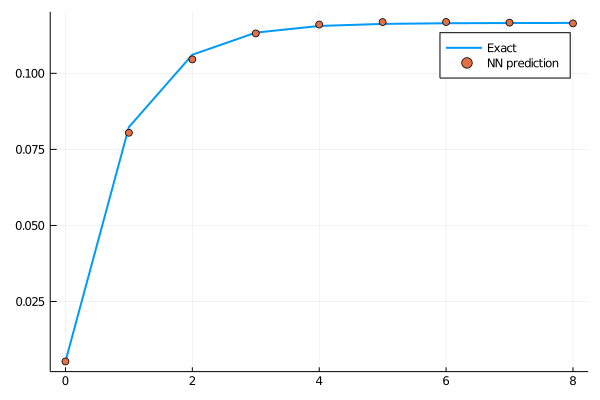

loss: 0.000283:  63%|█████████████████████████▋               |  ETA: 0:00:26

0.0002791536175186956

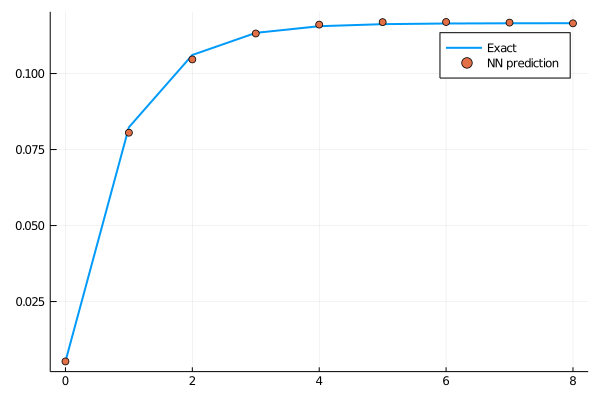

loss: 0.000279:  63%|█████████████████████████▉               |  ETA: 0:00:25

0.00027593631313798837

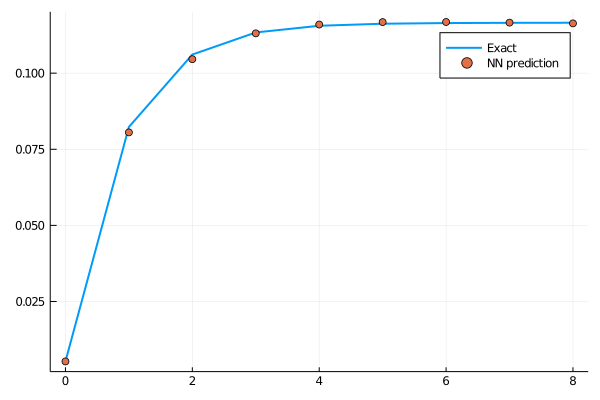

loss: 0.000276:  63%|██████████████████████████               |  ETA: 0:00:25

0.000274518590143273

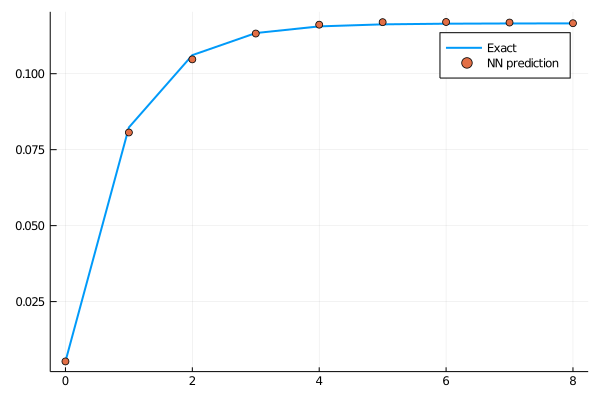

loss: 0.000275:  64%|██████████████████████████▏              |  ETA: 0:00:25

0.00027765045425815225

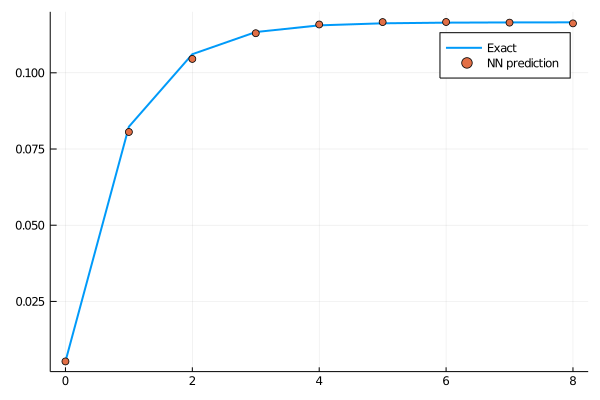

loss: 0.000278:  64%|██████████████████████████▎              |  ETA: 0:00:25

0.00029196897815769366

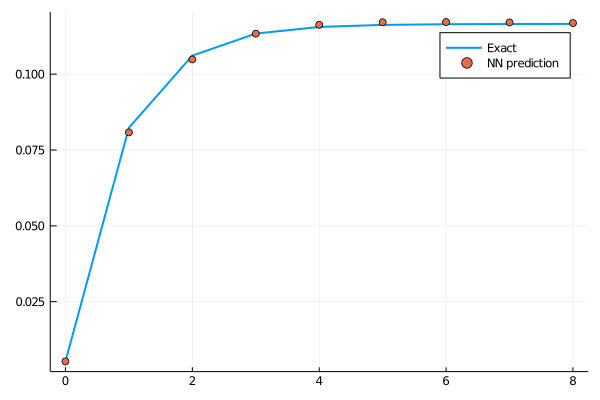

loss: 0.000292:  64%|██████████████████████████▍              |  ETA: 0:00:24

0.00033799066703309004

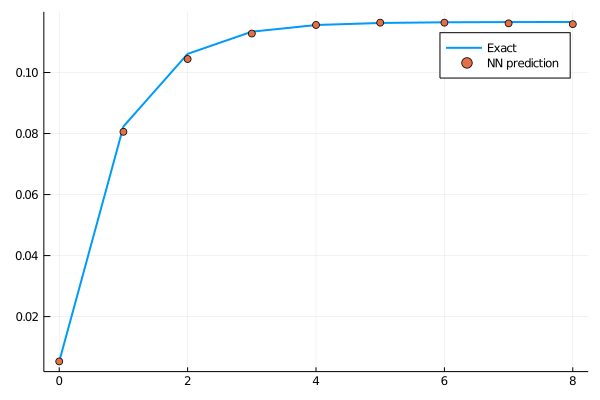

loss: 0.000338:  65%|██████████████████████████▌              |  ETA: 0:00:24

0.0004610400209661947

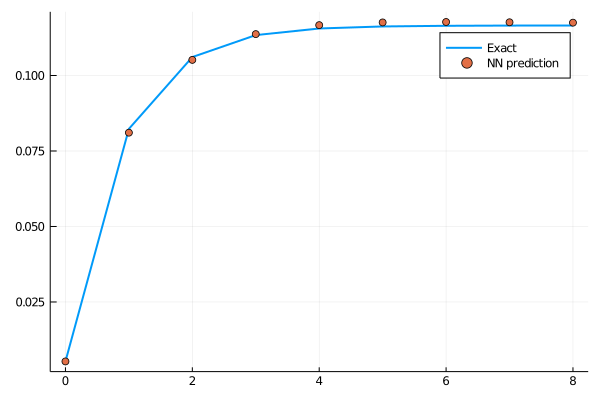

loss: 0.000461:  65%|██████████████████████████▋              |  ETA: 0:00:24

0.0008292775386045342

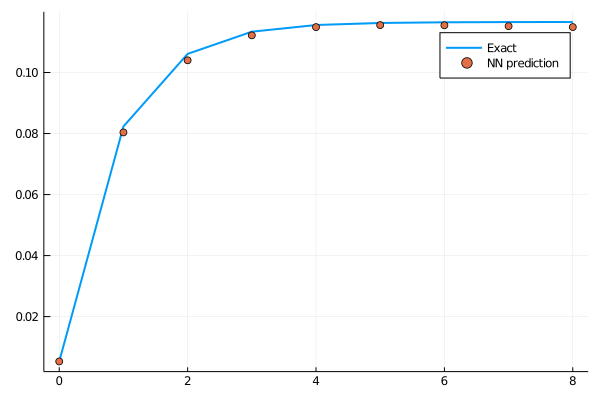

loss: 0.000829:  65%|██████████████████████████▊              |  ETA: 0:00:24

0.0016832934499119725

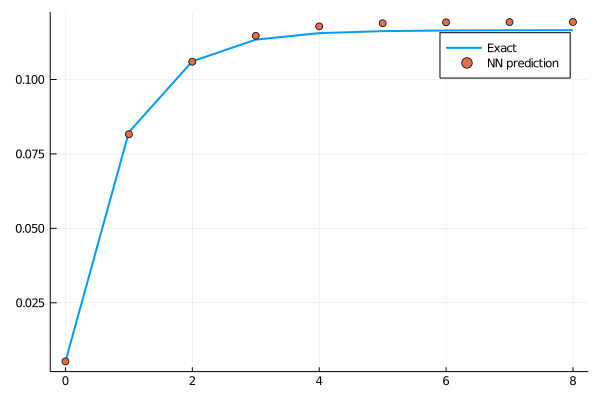

loss: 0.00168:  66%|██████████████████████████▉              |  ETA: 0:00:24

0.004294388271231754

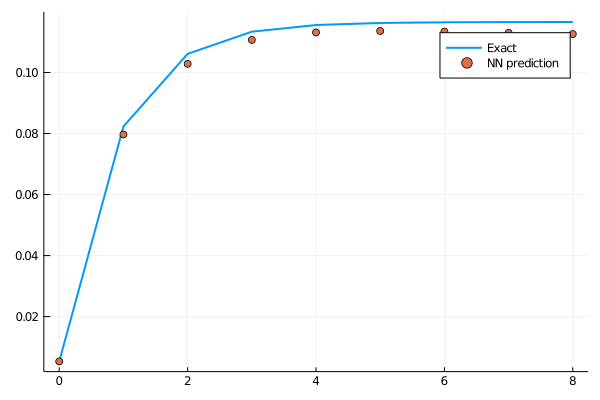

loss: 0.00429:  66%|███████████████████████████              |  ETA: 0:00:23

0.0072337724011884985

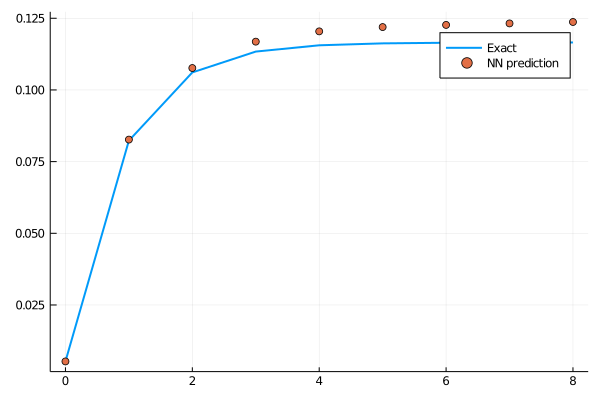

loss: 0.00723:  66%|███████████████████████████▏             |  ETA: 0:00:23

0.013227616174720201

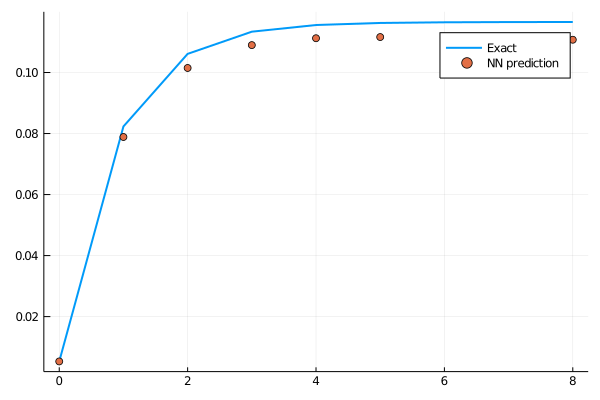

loss: 0.0132:  67%|███████████████████████████▎             |  ETA: 0:00:23

0.005377276856432557

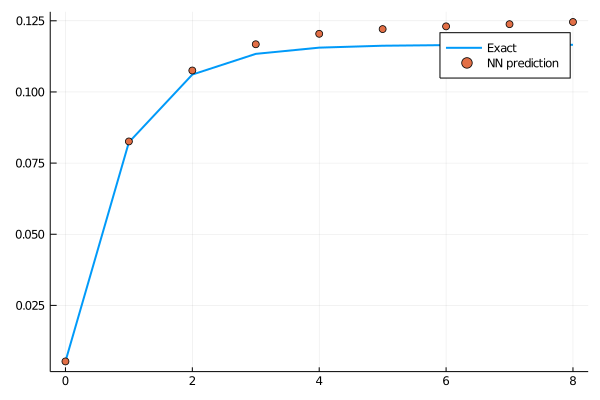

loss: 0.00538:  67%|███████████████████████████▌             |  ETA: 0:00:23

0.0009160379059080093

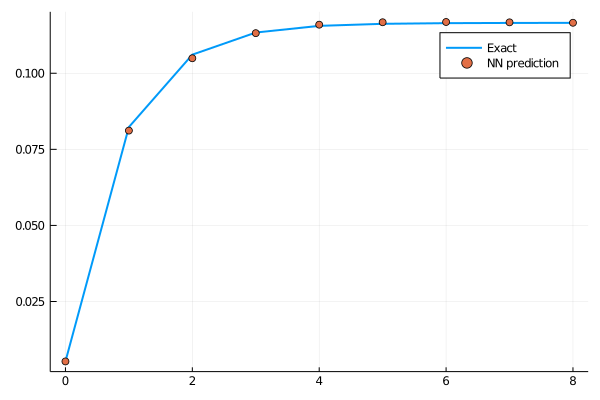

loss: 0.000916:  67%|███████████████████████████▋             |  ETA: 0:00:22

0.005480278274572519

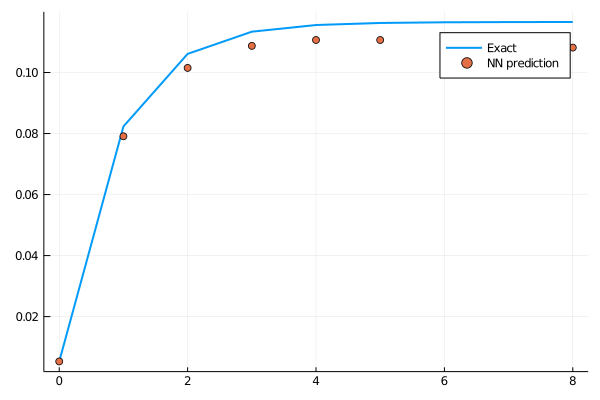

loss: 0.00548:  68%|███████████████████████████▊             |  ETA: 0:00:22

0.007976768660872173

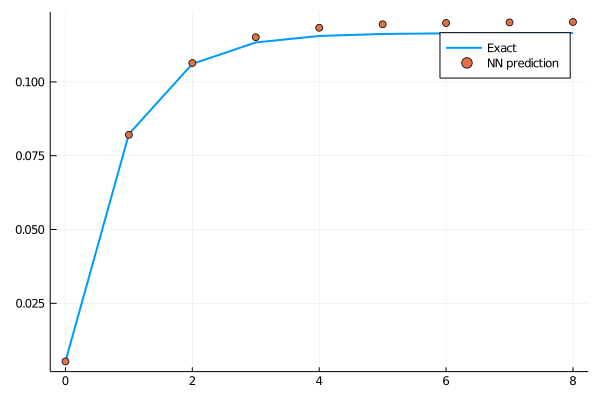

loss: 0.00798:  68%|███████████████████████████▉             |  ETA: 0:00:22

0.006697526673987059

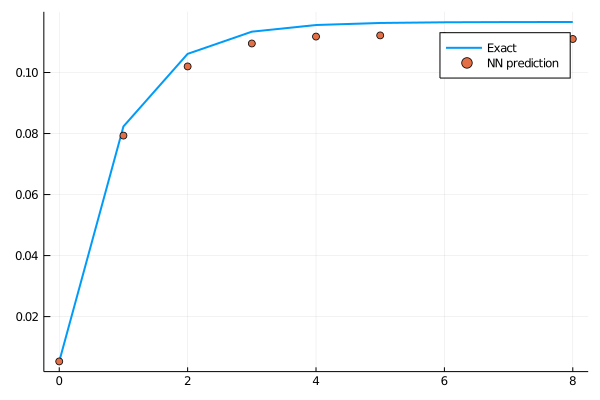

loss: 0.0067:  68%|████████████████████████████             |  ETA: 0:00:22

0.0011994916180956446

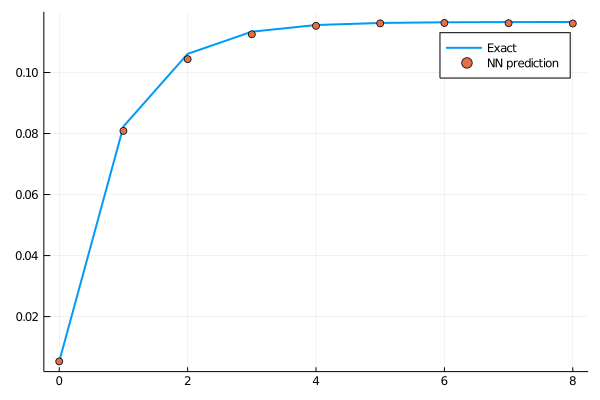

loss: 0.0012:  69%|████████████████████████████▏            |  ETA: 0:00:21

0.006698293508247162

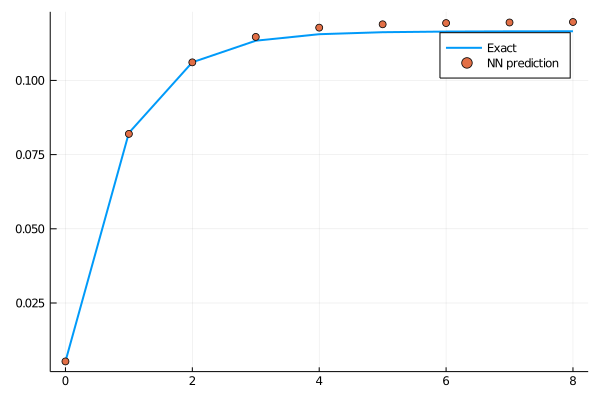

loss: 0.0067:  69%|████████████████████████████▎            |  ETA: 0:00:21

0.011165794654117722

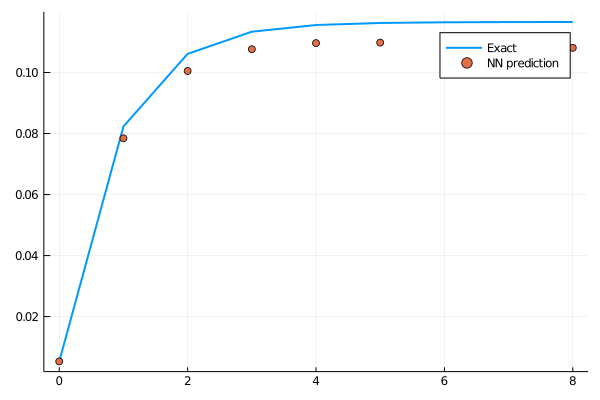

loss: 0.0112:  69%|████████████████████████████▍            |  ETA: 0:00:21

0.0020053859629152824

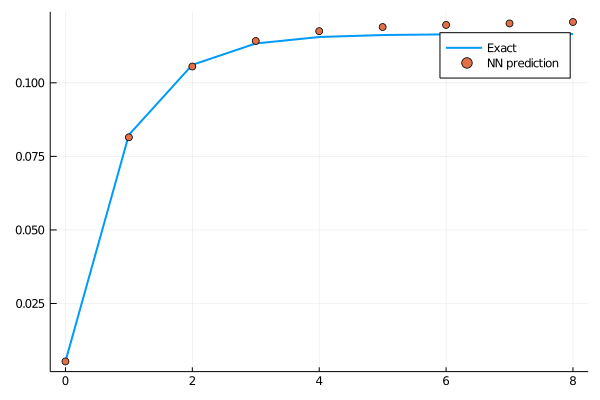

loss: 0.00201:  70%|████████████████████████████▌            |  ETA: 0:00:21

0.007934528819718584

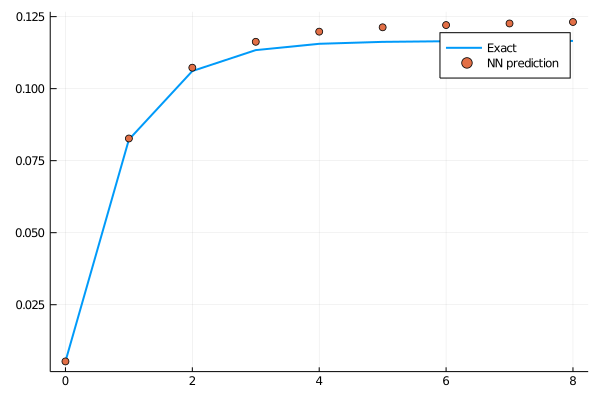

loss: 0.00793:  70%|████████████████████████████▊            |  ETA: 0:00:21

0.012238522536522377

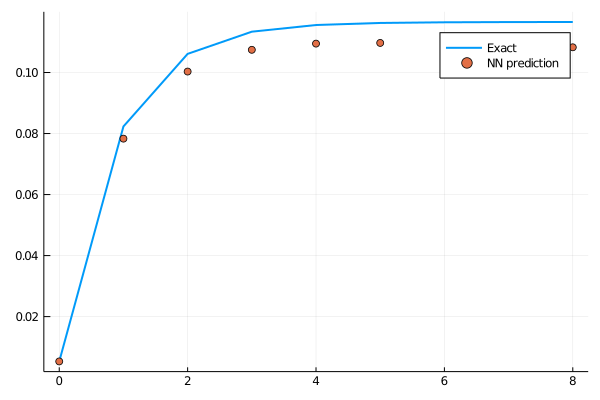

loss: 0.0122:  70%|████████████████████████████▉            |  ETA: 0:00:20

0.0019895927505669255

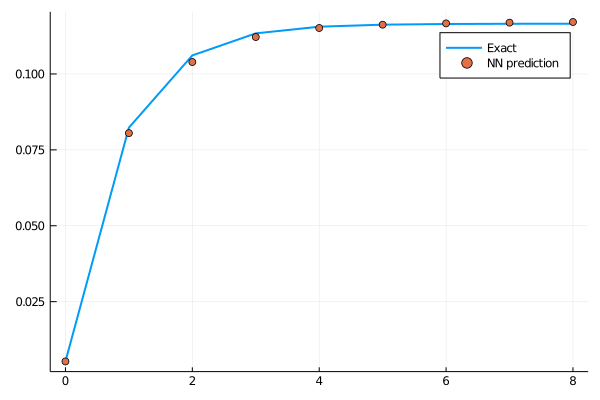

loss: 0.00199:  71%|█████████████████████████████            |  ETA: 0:00:20

0.011365574404277183

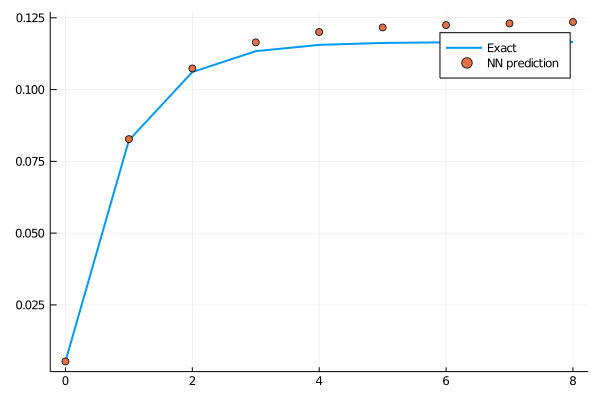

loss: 0.0114:  71%|█████████████████████████████▏           |  ETA: 0:00:20

0.010619610787602651

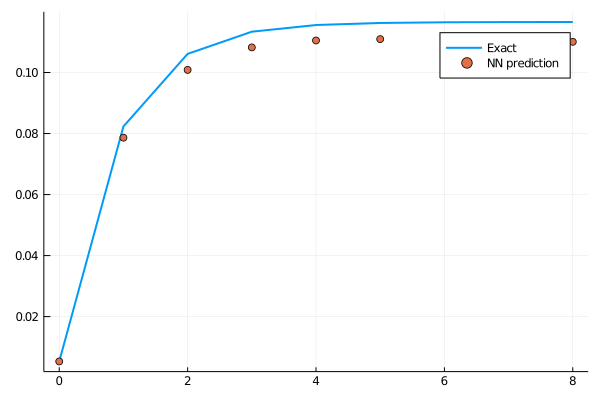

loss: 0.0106:  71%|█████████████████████████████▎           |  ETA: 0:00:20

0.002929734742590226

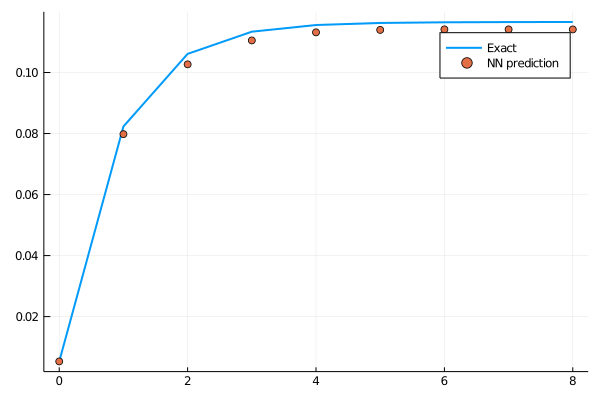

loss: 0.00293:  72%|█████████████████████████████▍           |  ETA: 0:00:19

0.012978060293962384

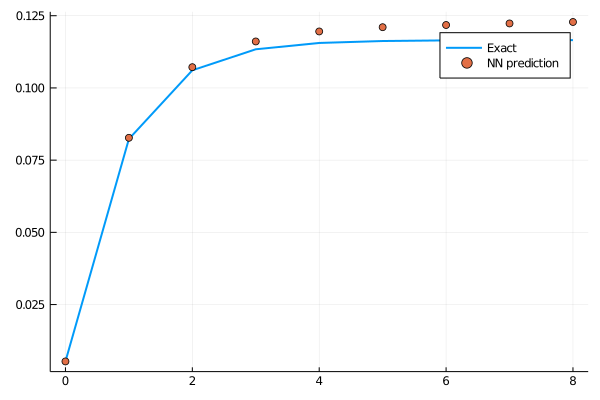

loss: 0.013:  72%|█████████████████████████████▌           |  ETA: 0:00:19

0.0035040845870968093

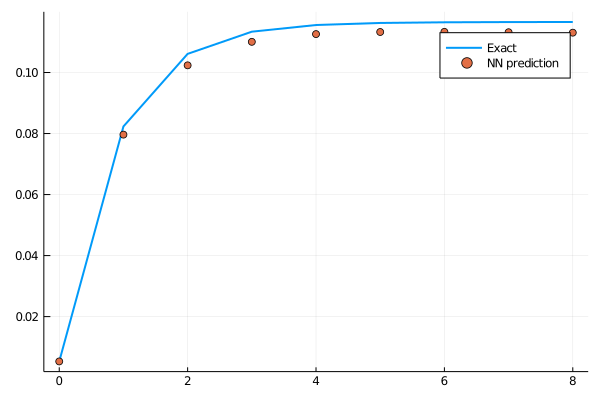

loss: 0.0035:  72%|█████████████████████████████▋           |  ETA: 0:00:19

0.006705457562882317

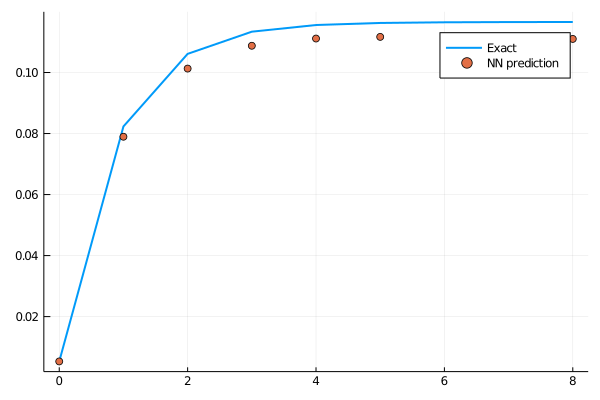

loss: 0.00671:  73%|█████████████████████████████▊           |  ETA: 0:00:19

0.005391426870001503

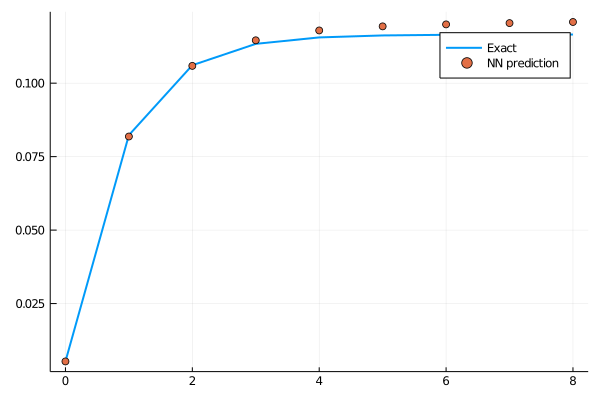

loss: 0.00539:  73%|█████████████████████████████▉           |  ETA: 0:00:19

0.0016743223640129884

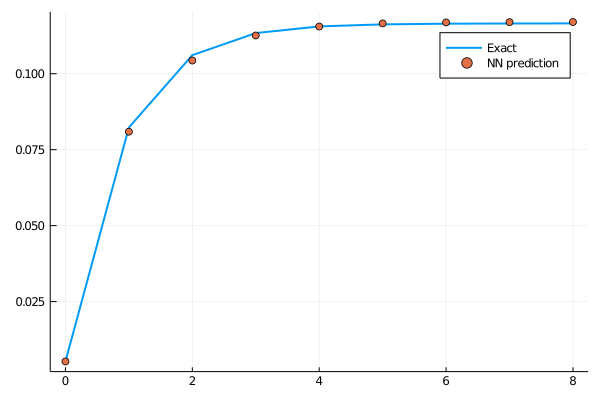

loss: 0.00167:  73%|██████████████████████████████           |  ETA: 0:00:18

0.006088446378651859

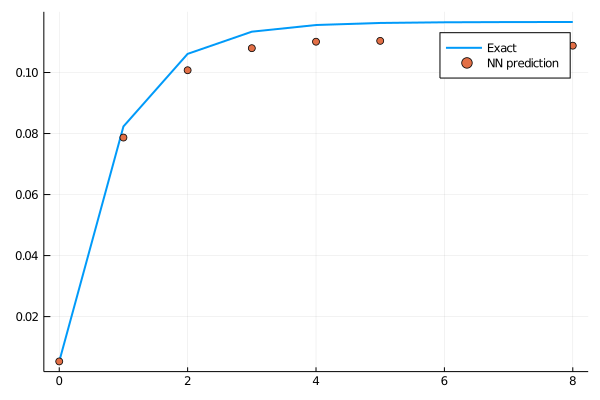

loss: 0.00609:  74%|██████████████████████████████▏          |  ETA: 0:00:18

0.0007312567916371174

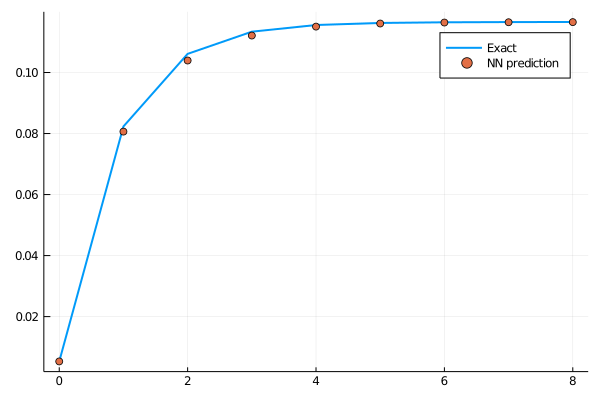

loss: 0.000731:  74%|██████████████████████████████▍          |  ETA: 0:00:18

0.005413803372678792

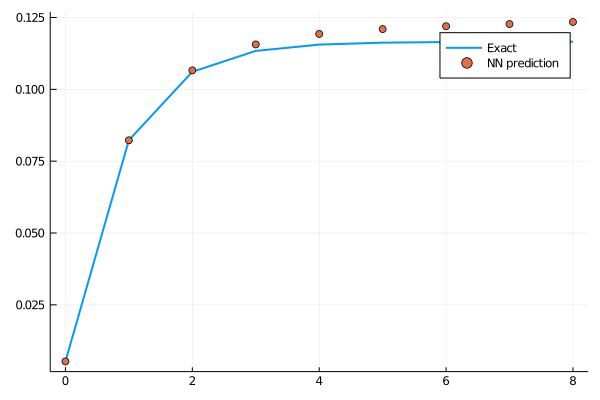

loss: 0.00541:  74%|██████████████████████████████▌          |  ETA: 0:00:18

0.002181517533531334

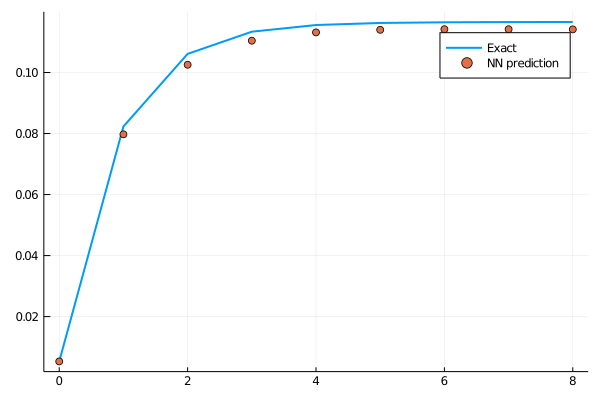

loss: 0.00218:  75%|██████████████████████████████▋          |  ETA: 0:00:17

0.002690628527603772

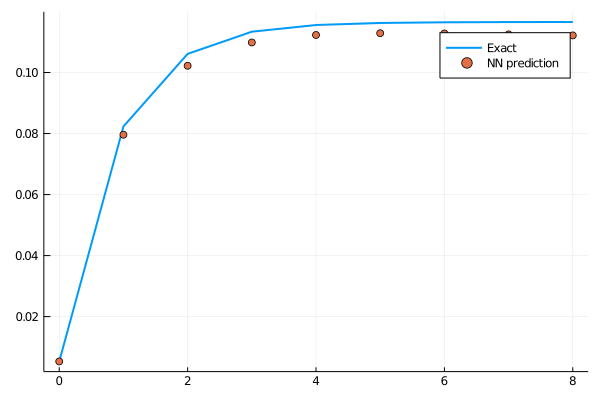

loss: 0.00269:  75%|██████████████████████████████▊          |  ETA: 0:00:17

0.003465875645523443

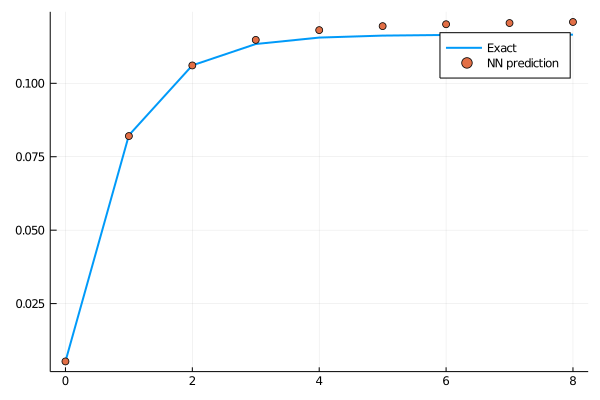

loss: 0.00347:  75%|██████████████████████████████▉          |  ETA: 0:00:17

0.0010206086165968477

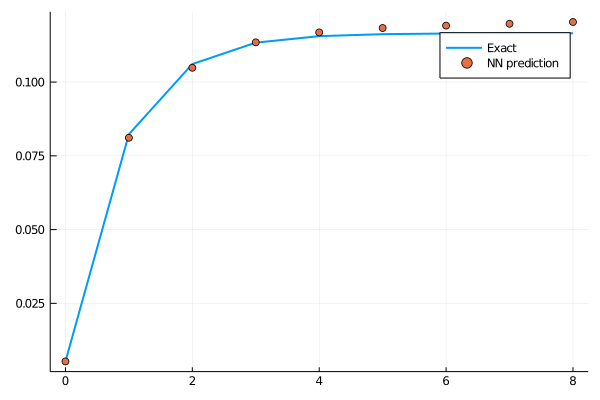

loss: 0.00102:  76%|███████████████████████████████          |  ETA: 0:00:17

0.0028810827990639666

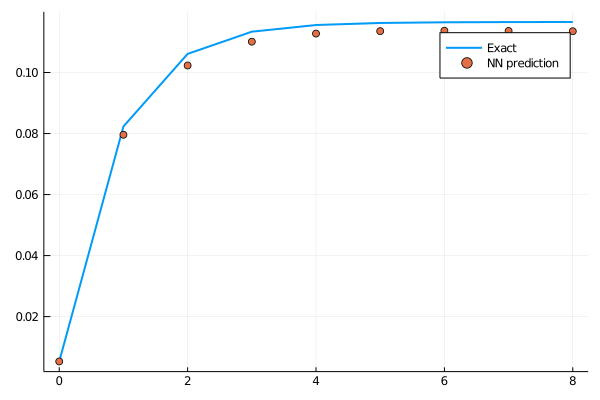

loss: 0.00288:  76%|███████████████████████████████▏         |  ETA: 0:00:16

0.0009140411736478632

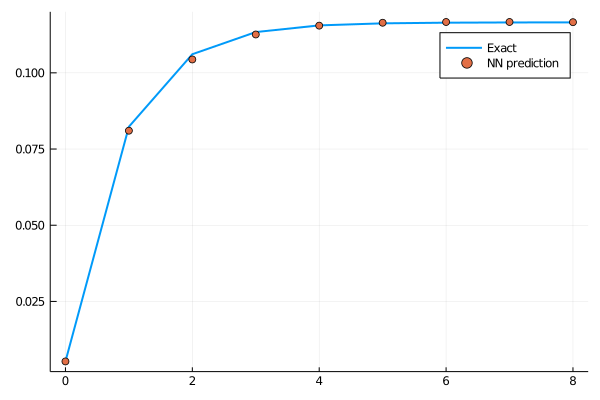

loss: 0.000914:  76%|███████████████████████████████▎         |  ETA: 0:00:16

0.0018454616818339641

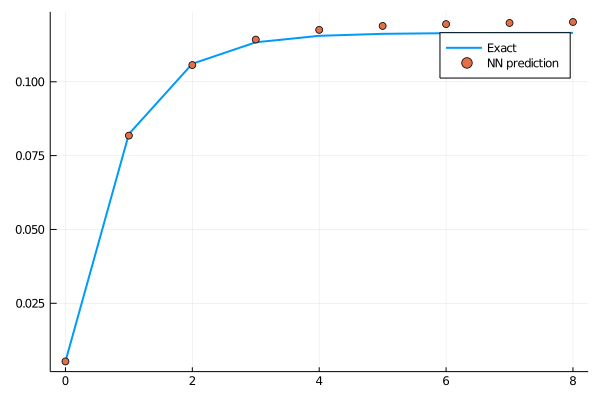

loss: 0.00185:  77%|███████████████████████████████▍         |  ETA: 0:00:16

0.0016826330654328135

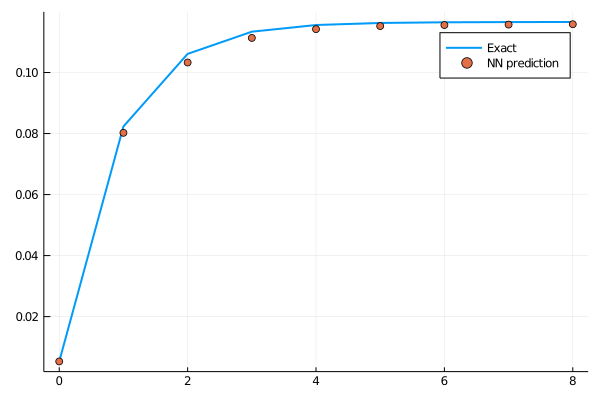

loss: 0.00168:  77%|███████████████████████████████▋         |  ETA: 0:00:16

0.000969707623457793

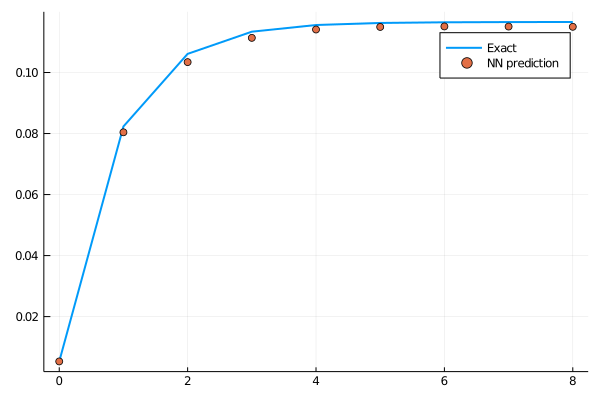

loss: 0.00097:  77%|███████████████████████████████▊         |  ETA: 0:00:16

0.0020519395315254972

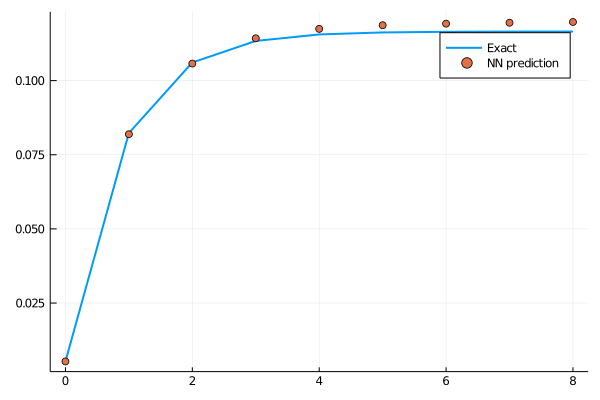

loss: 0.00205:  78%|███████████████████████████████▉         |  ETA: 0:00:15

0.000615304396795662

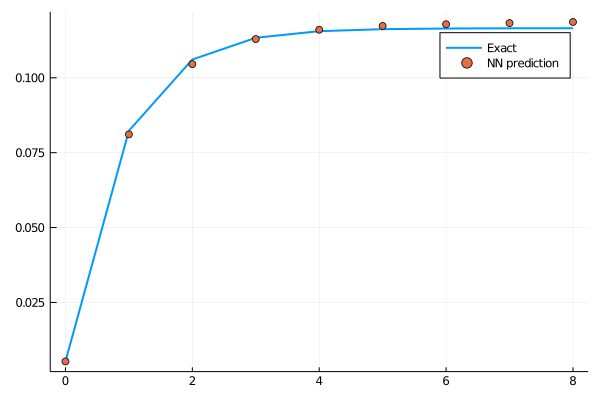

loss: 0.000615:  78%|████████████████████████████████         |  ETA: 0:00:15

0.0014352282074156955

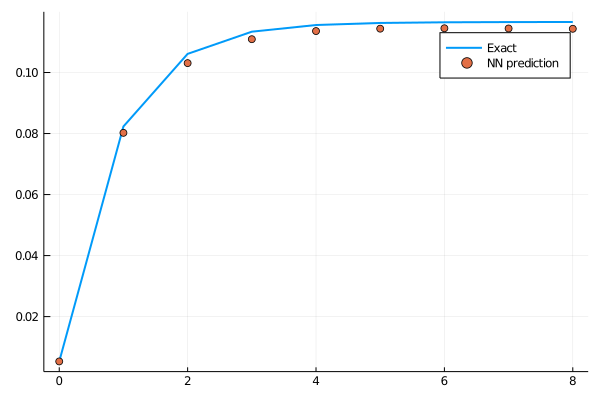

loss: 0.00144:  78%|████████████████████████████████▏        |  ETA: 0:00:15

0.000682064831401809

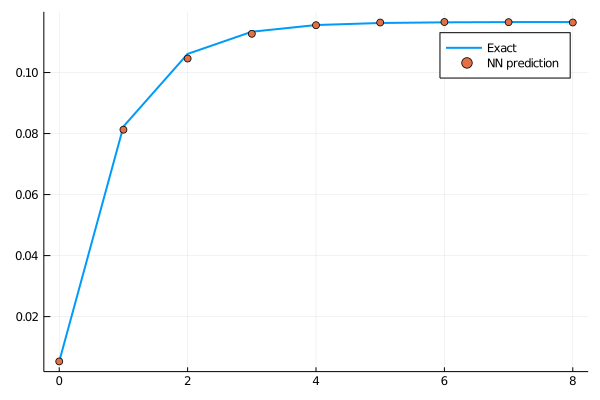

loss: 0.000682:  79%|████████████████████████████████▎        |  ETA: 0:00:15

0.0008829453480759991

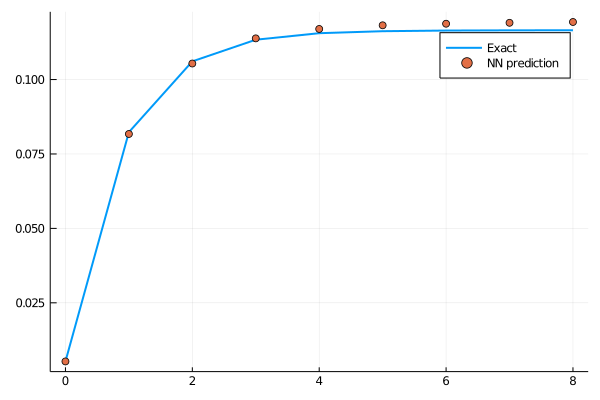

loss: 0.000883:  79%|████████████████████████████████▍        |  ETA: 0:00:14

0.0009854219793970591

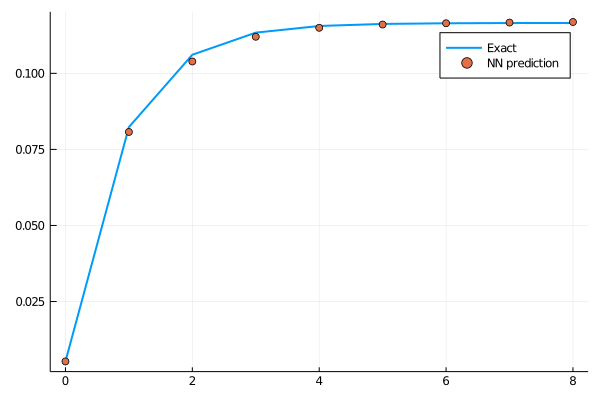

loss: 0.000985:  79%|████████████████████████████████▌        |  ETA: 0:00:14

0.0005306578606106857

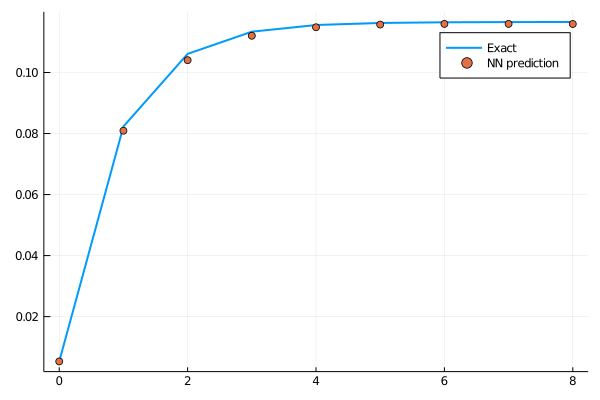

loss: 0.000531:  80%|████████████████████████████████▋        |  ETA: 0:00:14

0.0010202961913365794

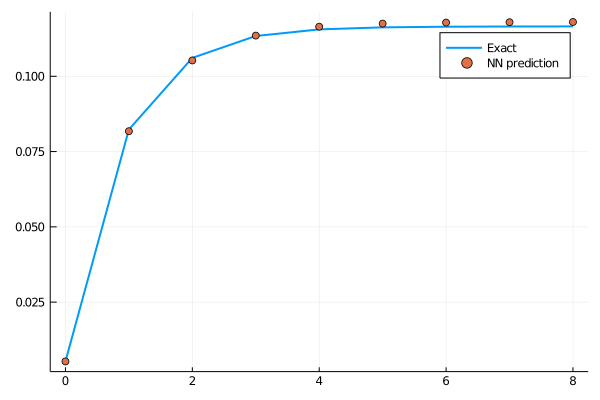

loss: 0.00102:  80%|████████████████████████████████▊        |  ETA: 0:00:14

0.00046792135247535397

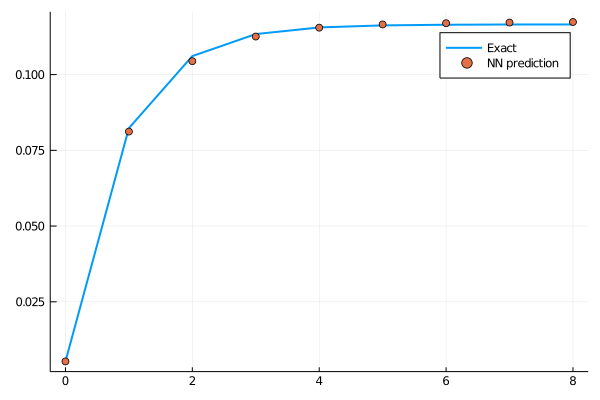

loss: 0.000468:  80%|████████████████████████████████▉        |  ETA: 0:00:14

0.000689809112847629

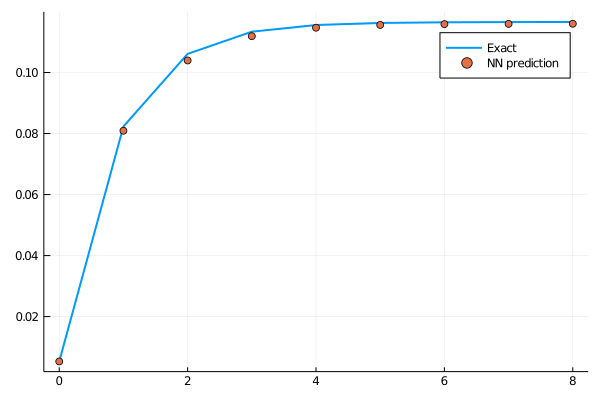

loss: 0.00069:  81%|█████████████████████████████████        |  ETA: 0:00:13

0.0005443026546971256

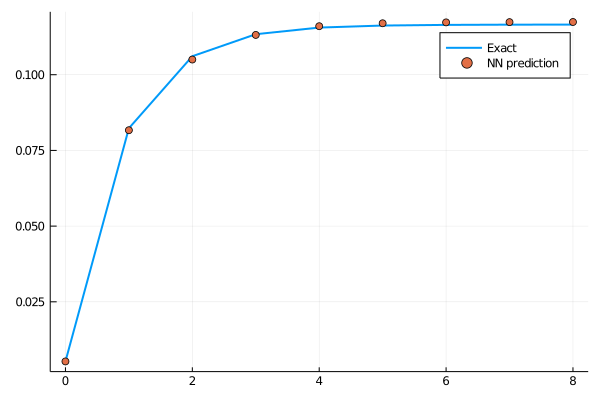

loss: 0.000544:  81%|█████████████████████████████████▎       |  ETA: 0:00:13

0.00046212983624434193

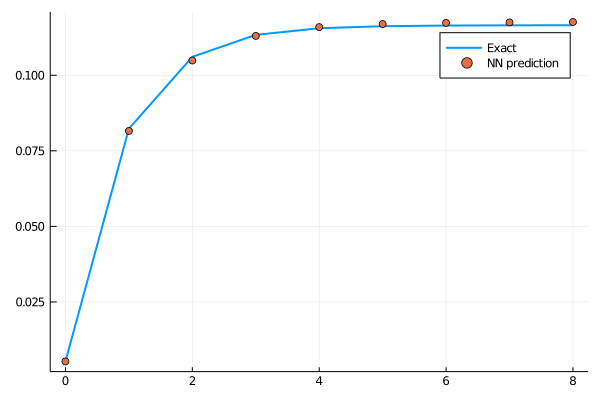

loss: 0.000462:  81%|█████████████████████████████████▍       |  ETA: 0:00:13

0.0005290548800525154

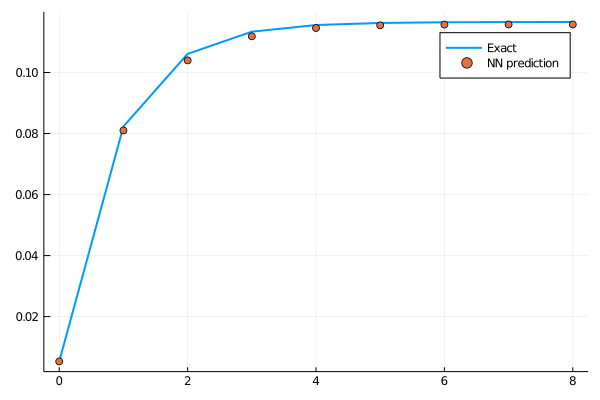

loss: 0.000529:  82%|█████████████████████████████████▌       |  ETA: 0:00:13

0.0004029916587192897

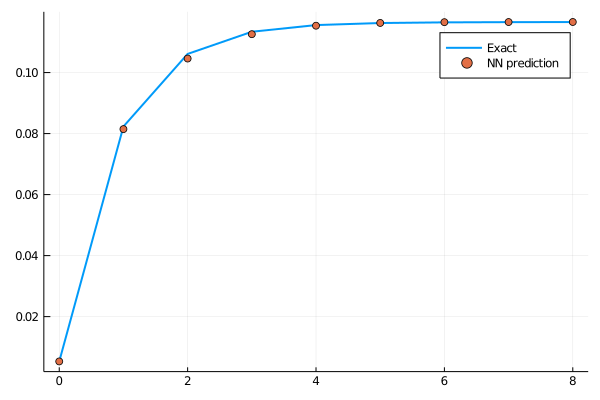

loss: 0.000403:  82%|█████████████████████████████████▋       |  ETA: 0:00:12

0.0004242178013921723

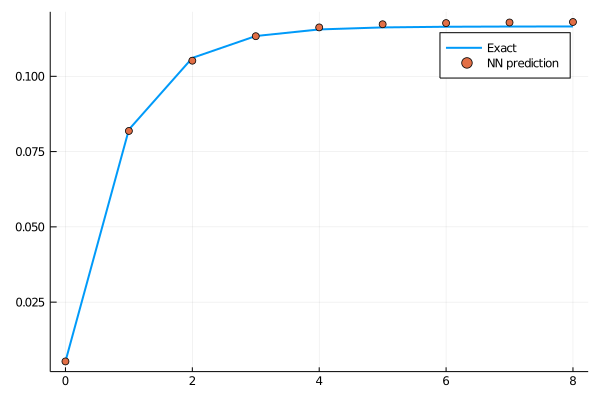

loss: 0.000424:  82%|█████████████████████████████████▊       |  ETA: 0:00:12

0.0004092301037600907

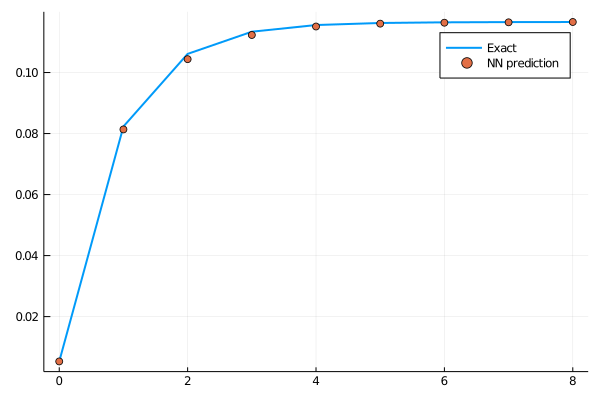

loss: 0.000409:  83%|█████████████████████████████████▉       |  ETA: 0:00:12

0.0003263610327962891

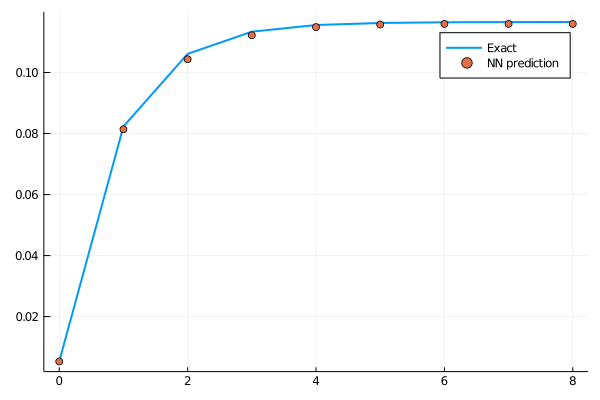

loss: 0.000326:  83%|██████████████████████████████████       |  ETA: 0:00:12

0.0003725928292120627

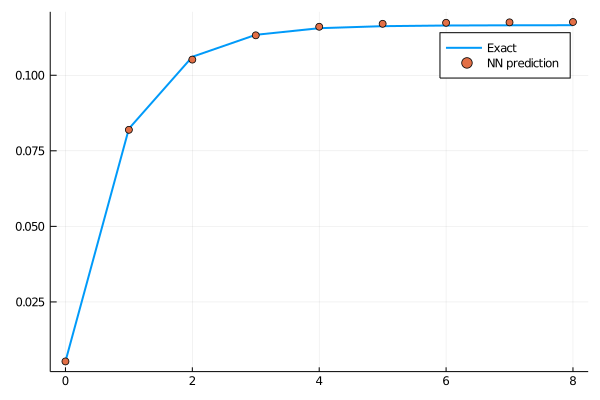

loss: 0.000373:  83%|██████████████████████████████████▏      |  ETA: 0:00:11

0.0003184632227070716

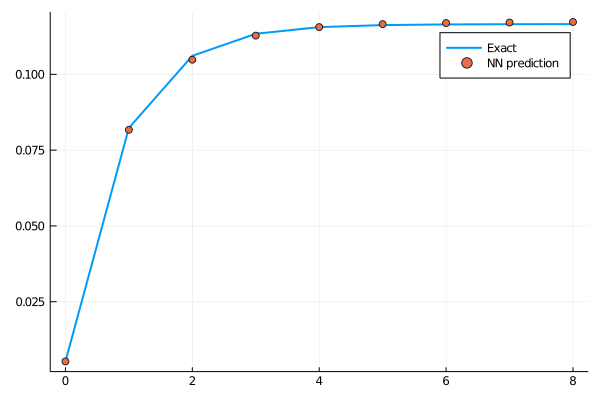

loss: 0.000318:  84%|██████████████████████████████████▎      |  ETA: 0:00:11

0.0002870236891159958

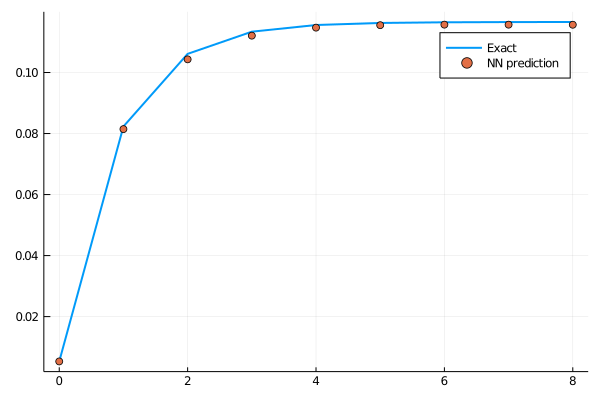

loss: 0.000287:  84%|██████████████████████████████████▌      |  ETA: 0:00:11

0.00032387147894590376

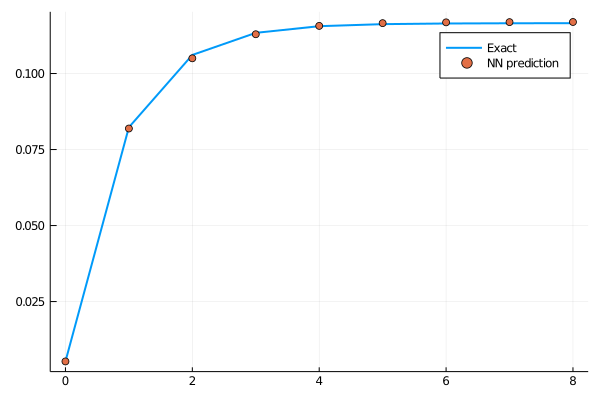

loss: 0.000324:  84%|██████████████████████████████████▋      |  ETA: 0:00:11

0.00024468670784921374

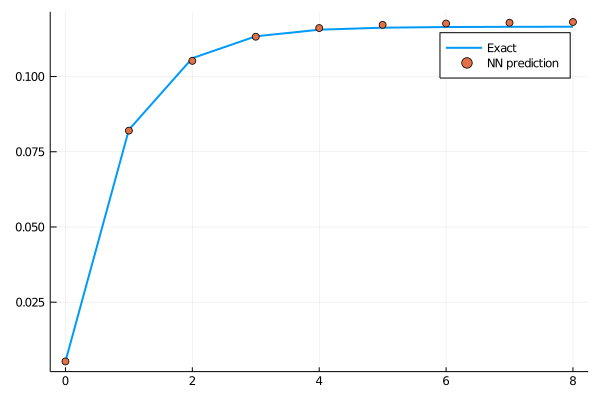

loss: 0.000245:  85%|██████████████████████████████████▋      |  ETA: 0:00:11

0.0002617236155211397

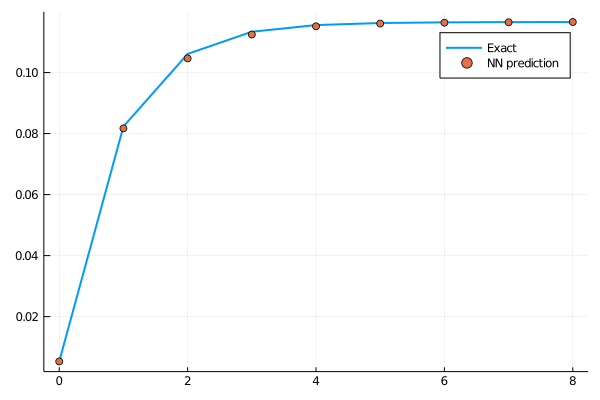

loss: 0.000262:  85%|██████████████████████████████████▉      |  ETA: 0:00:10

0.00026712647870501634

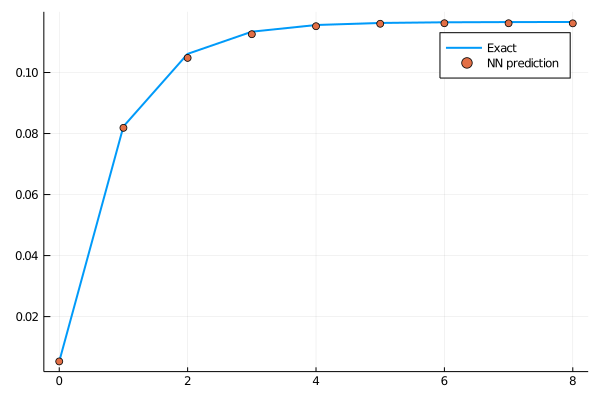

loss: 0.000267:  85%|███████████████████████████████████      |  ETA: 0:00:10

0.0001933969927357602

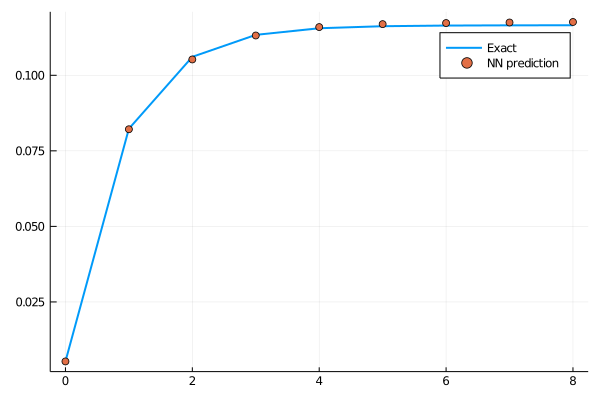

loss: 0.000193:  86%|███████████████████████████████████▏     |  ETA: 0:00:10

0.0002660449735895368

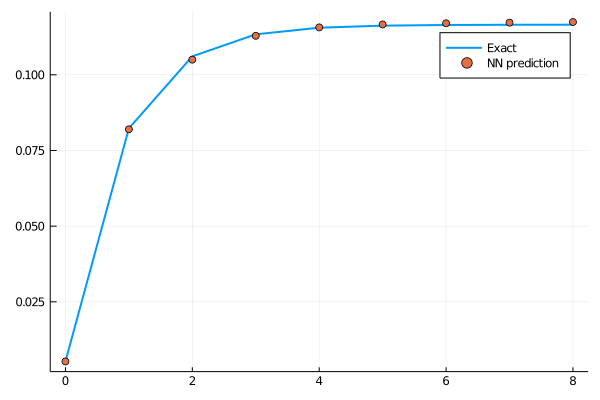

loss: 0.000266:  86%|███████████████████████████████████▎     |  ETA: 0:00:10

0.00018936191682403055

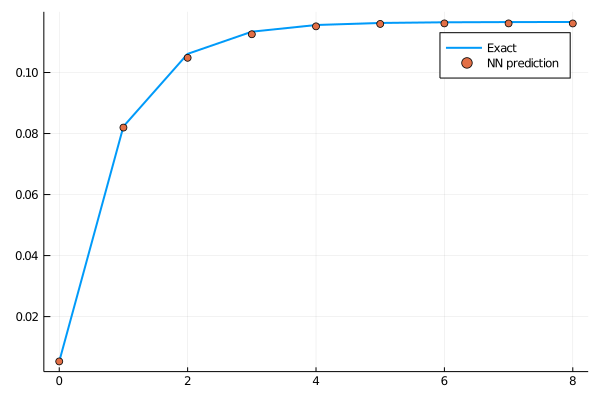

loss: 0.000189:  86%|███████████████████████████████████▍     |  ETA: 0:00:09

0.000208622454995996

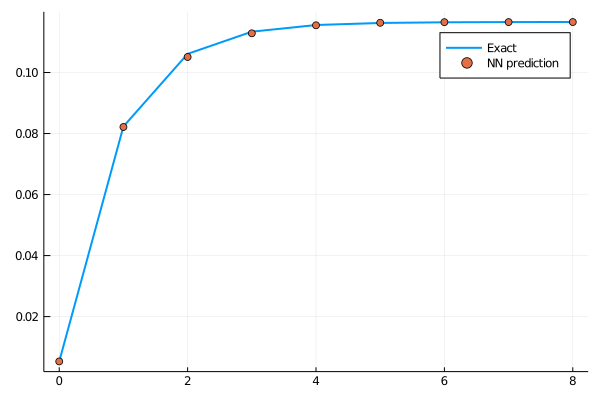

loss: 0.000209:  87%|███████████████████████████████████▌     |  ETA: 0:00:09

0.00022840459454672403

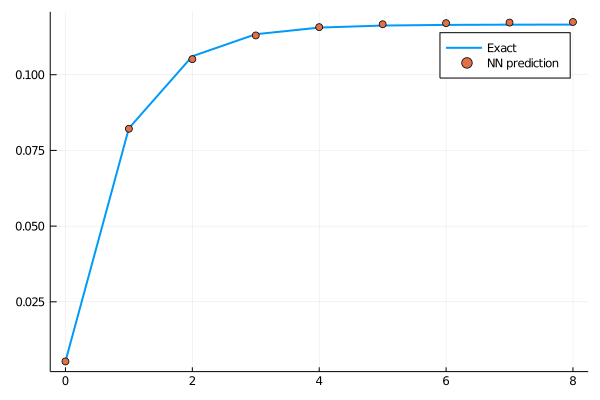

loss: 0.000228:  87%|███████████████████████████████████▋     |  ETA: 0:00:09

0.00015511560591522795

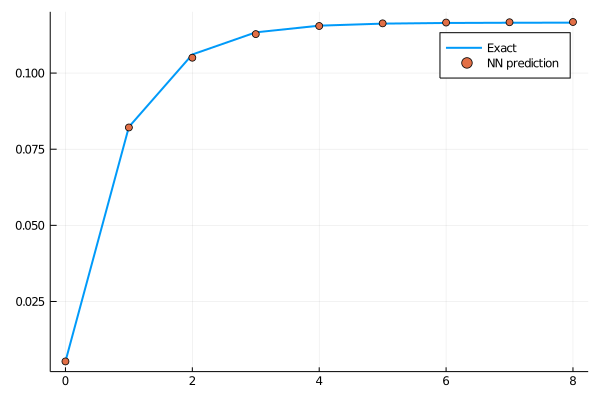

loss: 0.000155:  87%|███████████████████████████████████▊     |  ETA: 0:00:09

0.0002260350251845795

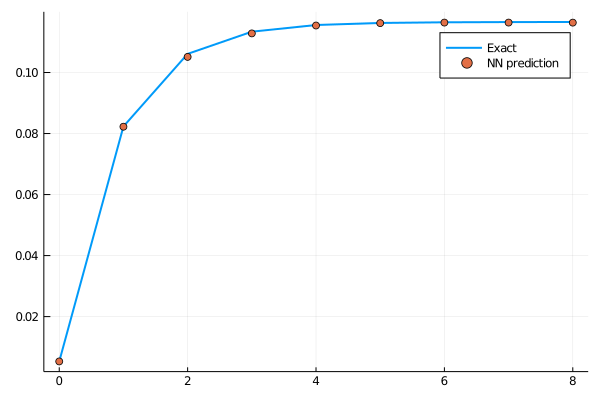

loss: 0.000226:  88%|███████████████████████████████████▉     |  ETA: 0:00:08

0.00016673144165853766

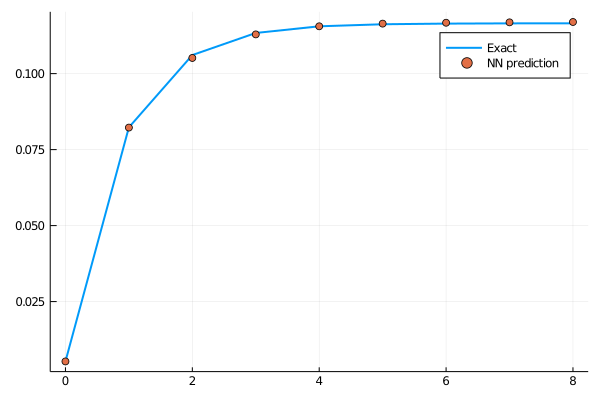

loss: 0.000167:  88%|████████████████████████████████████▏    |  ETA: 0:00:08

0.00017222727952565225

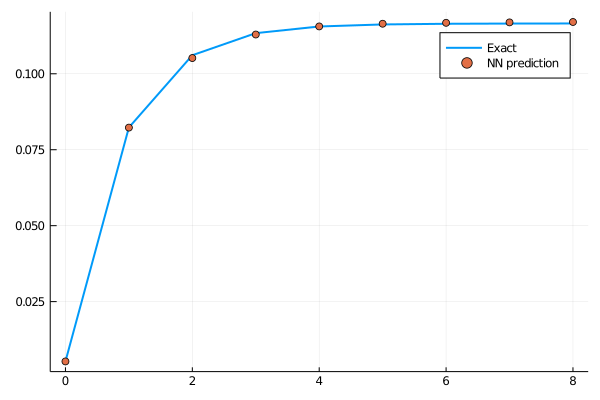

loss: 0.000172:  88%|████████████████████████████████████▎    |  ETA: 0:00:08

0.00019582776715562552

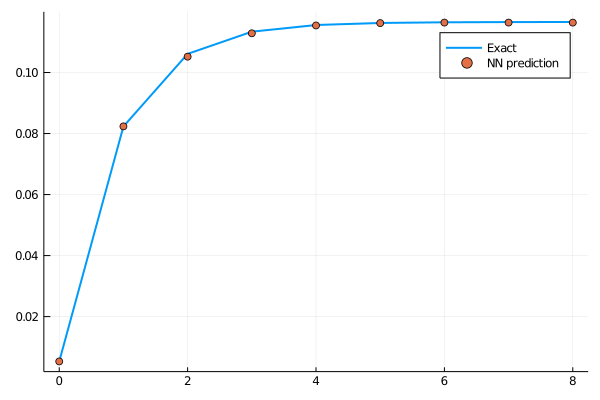

loss: 0.000196:  89%|████████████████████████████████████▍    |  ETA: 0:00:08

0.00014240493402290096

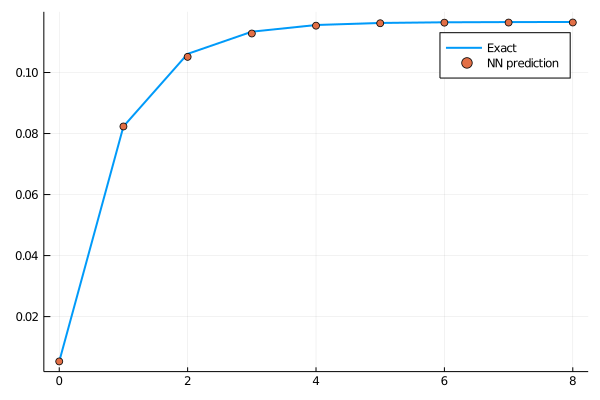

loss: 0.000142:  89%|████████████████████████████████████▌    |  ETA: 0:00:08

0.00018189399815588447

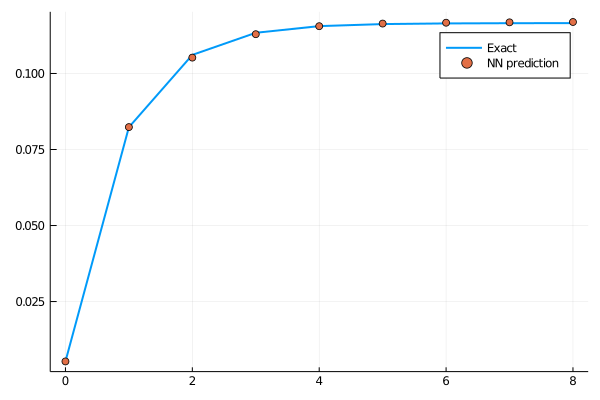

loss: 0.000182:  89%|████████████████████████████████████▋    |  ETA: 0:00:07

0.00015654019458926174

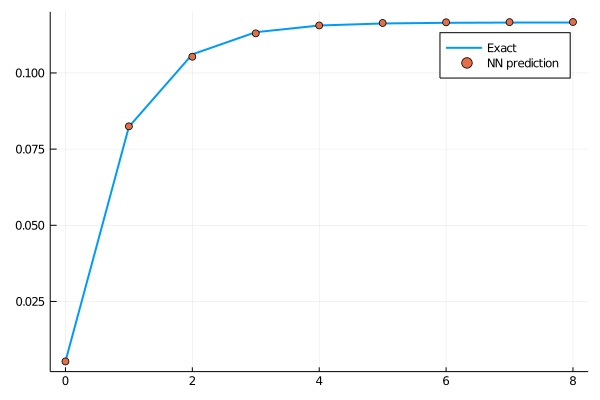

loss: 0.000157:  90%|████████████████████████████████████▊    |  ETA: 0:00:07

0.00014899364061236883

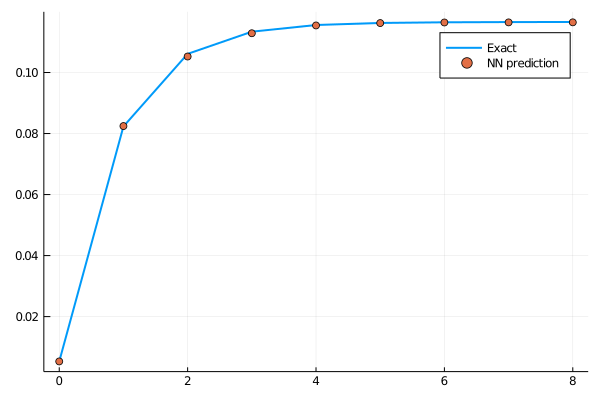

loss: 0.000149:  90%|████████████████████████████████████▉    |  ETA: 0:00:07

0.00016676134715233306

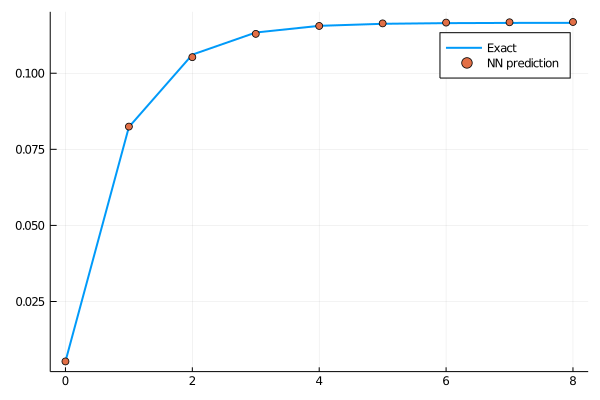

loss: 0.000167:  90%|█████████████████████████████████████    |  ETA: 0:00:07

0.00014049714040359593

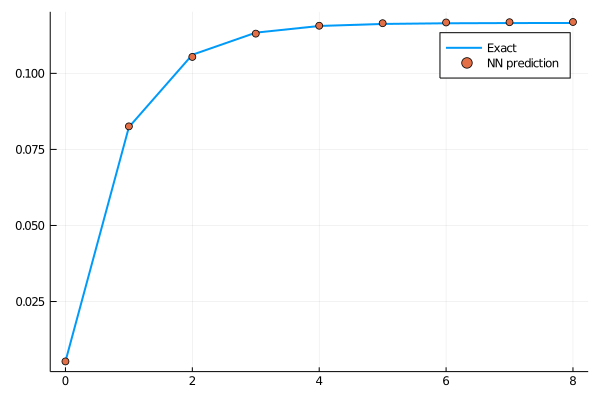

loss: 0.00014:  91%|█████████████████████████████████████▏   |  ETA: 0:00:06

0.00015217510058122754

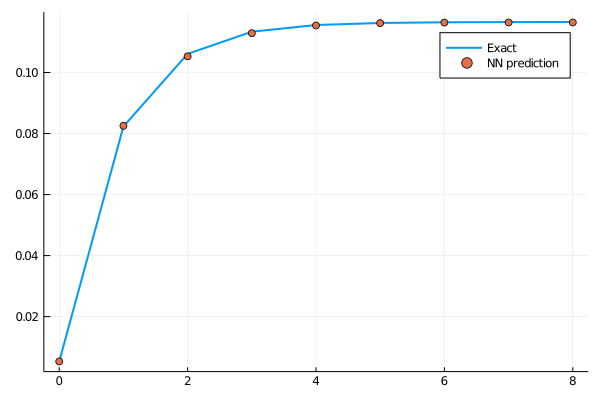

loss: 0.000152:  91%|█████████████████████████████████████▎   |  ETA: 0:00:06

0.00014845001983653061

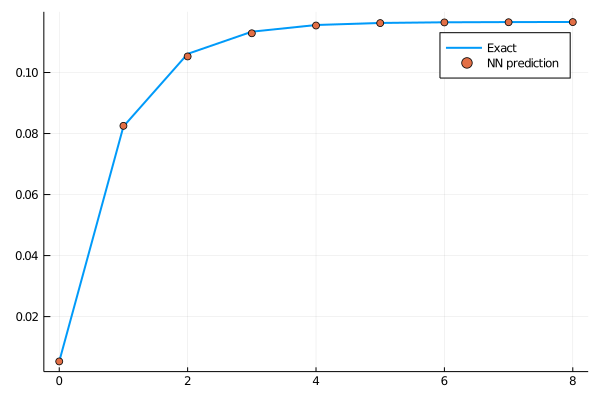

loss: 0.000148:  91%|█████████████████████████████████████▍   |  ETA: 0:00:06

0.00013771924885554244

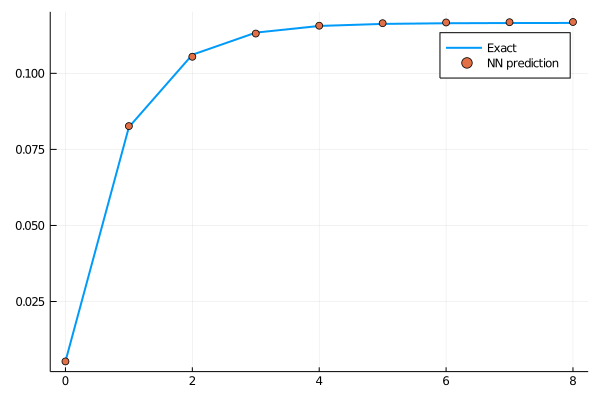

loss: 0.000138:  92%|█████████████████████████████████████▌   |  ETA: 0:00:06

0.0001468234746188254

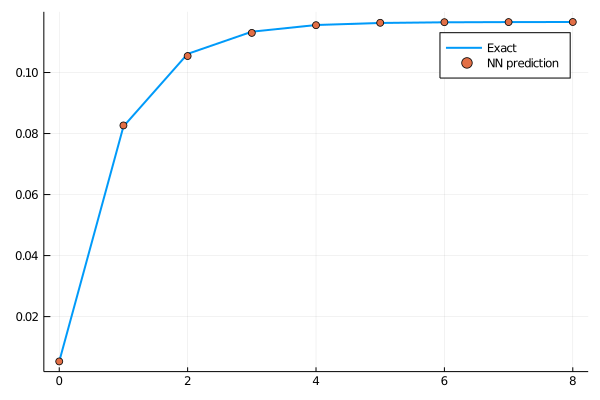

loss: 0.000147:  92%|█████████████████████████████████████▊   |  ETA: 0:00:05

0.00013677807746519574

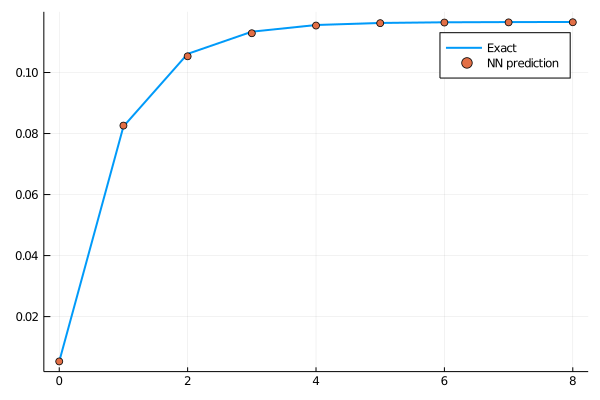

loss: 0.000137:  92%|█████████████████████████████████████▉   |  ETA: 0:00:05

0.00013804197027214644

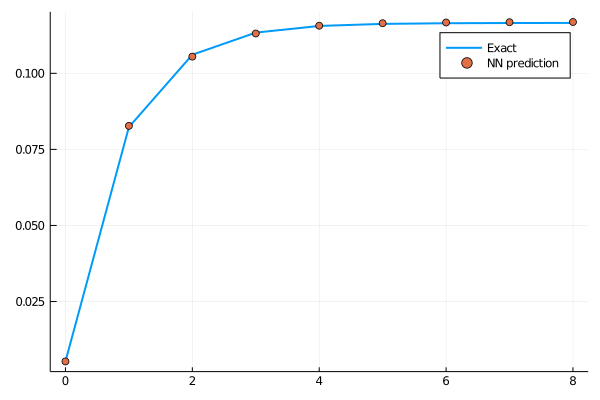

loss: 0.000138:  93%|██████████████████████████████████████   |  ETA: 0:00:05

0.0001363965049258627

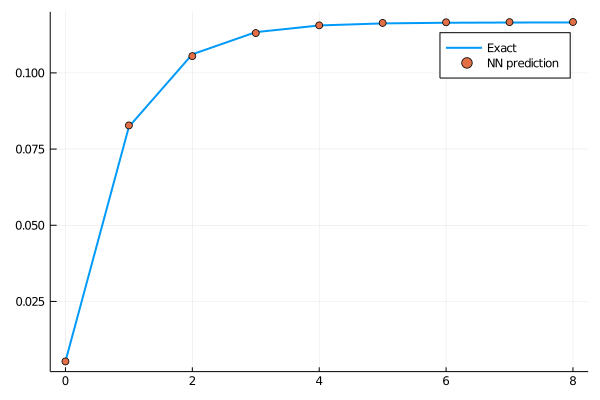

loss: 0.000136:  93%|██████████████████████████████████████▏  |  ETA: 0:00:05

0.00013420741601237167

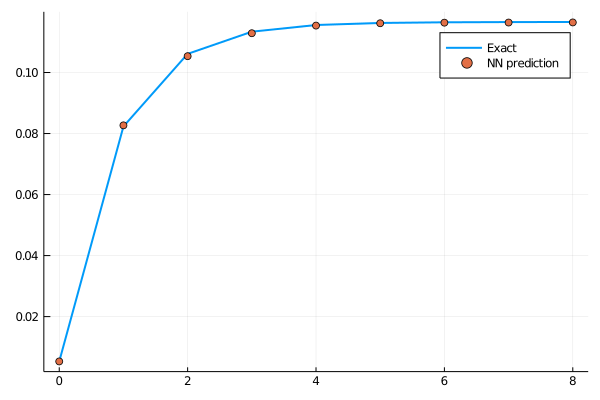

loss: 0.000134:  93%|██████████████████████████████████████▎  |  ETA: 0:00:05

0.00013237764776232678

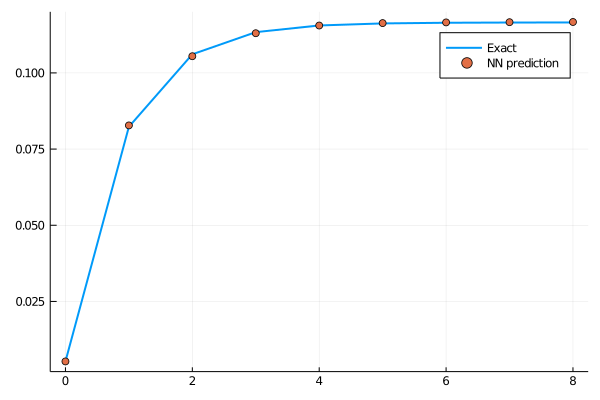

loss: 0.000132:  94%|██████████████████████████████████████▍  |  ETA: 0:00:04

0.00013104326026104583

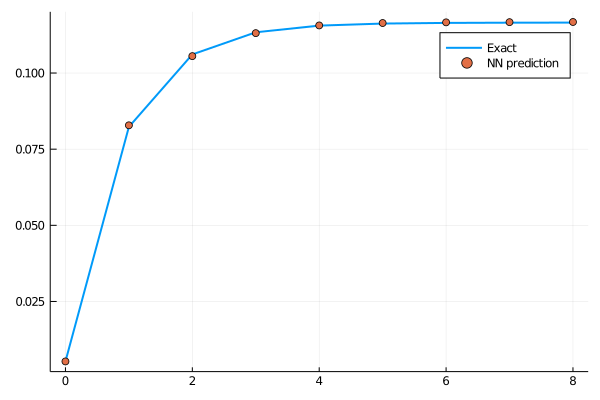

loss: 0.000131:  94%|██████████████████████████████████████▌  |  ETA: 0:00:04

0.00013140876463533187

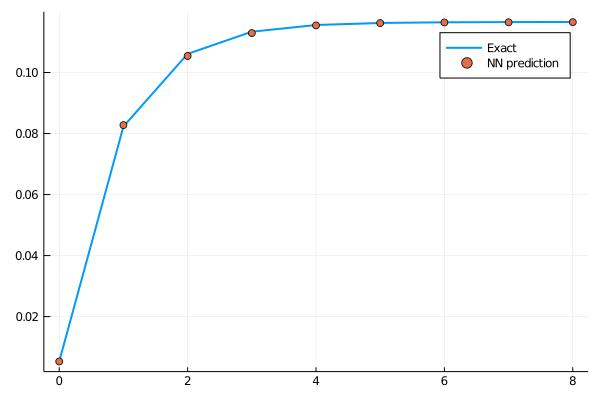

loss: 0.000131:  94%|██████████████████████████████████████▋  |  ETA: 0:00:04

0.0001263326342287558

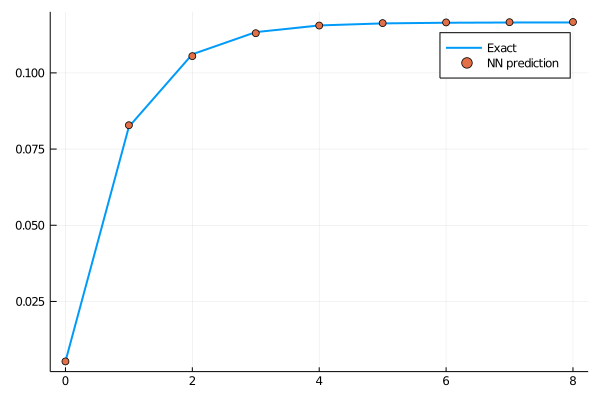

loss: 0.000126:  95%|██████████████████████████████████████▊  |  ETA: 0:00:04

0.00012927198148830296

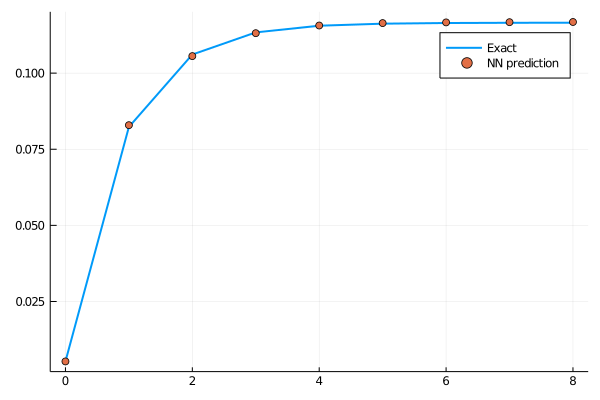

loss: 0.000129:  95%|███████████████████████████████████████  |  ETA: 0:00:03

0.00012635717342655088

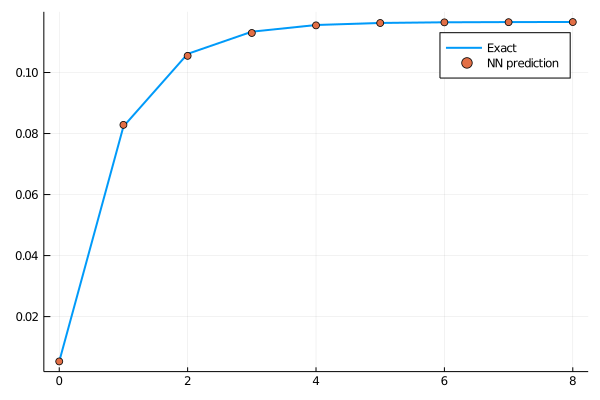

loss: 0.000126:  95%|███████████████████████████████████████▏ |  ETA: 0:00:03

0.00012337593193939054

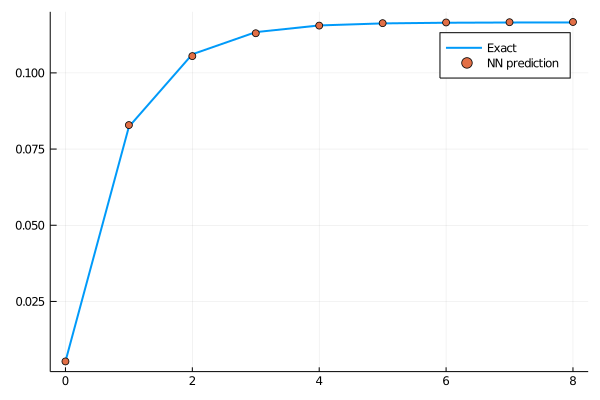

loss: 0.000123:  96%|███████████████████████████████████████▎ |  ETA: 0:00:03

0.00012679361878792383

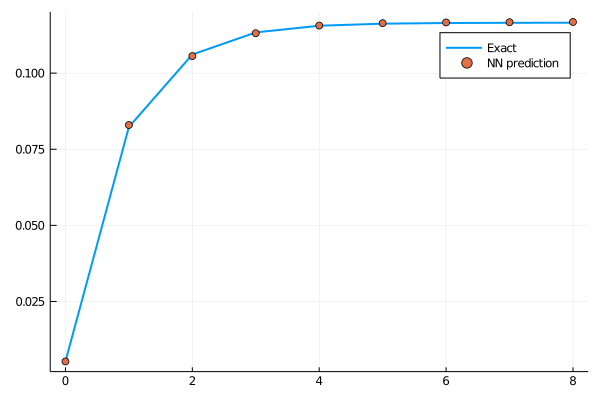

loss: 0.000127:  96%|███████████████████████████████████████▍ |  ETA: 0:00:03

0.00012173147895890359

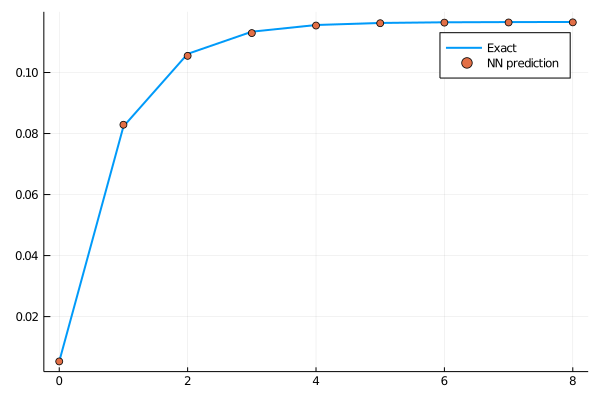

loss: 0.000122:  96%|███████████████████████████████████████▌ |  ETA: 0:00:03

0.00012207107814495399

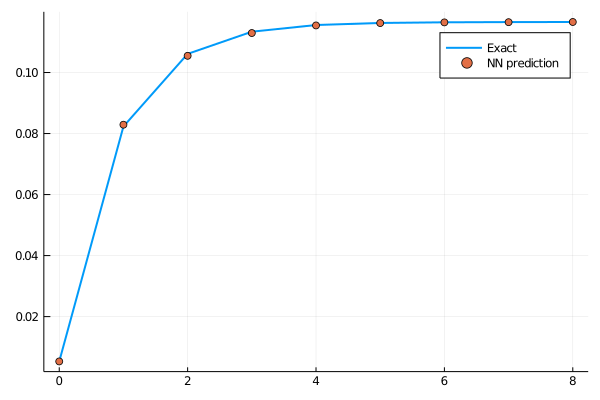

loss: 0.000122:  97%|███████████████████████████████████████▋ |  ETA: 0:00:02

0.00012323826335659065

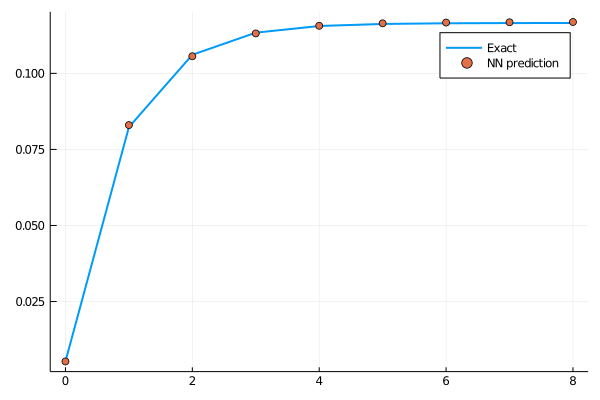

loss: 0.000123:  97%|███████████████████████████████████████▊ |  ETA: 0:00:02

0.00011886246874989718

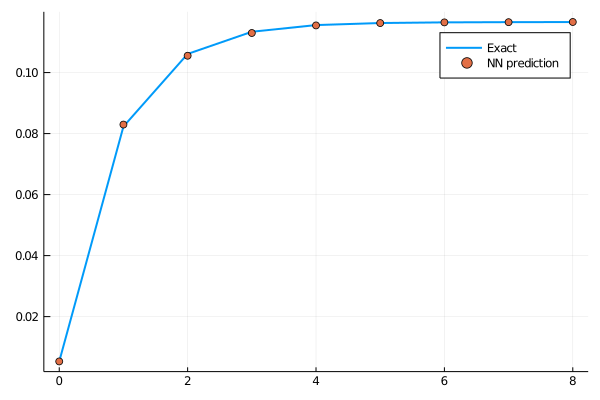

loss: 0.000119:  97%|███████████████████████████████████████▉ |  ETA: 0:00:02

0.00012064755922947599

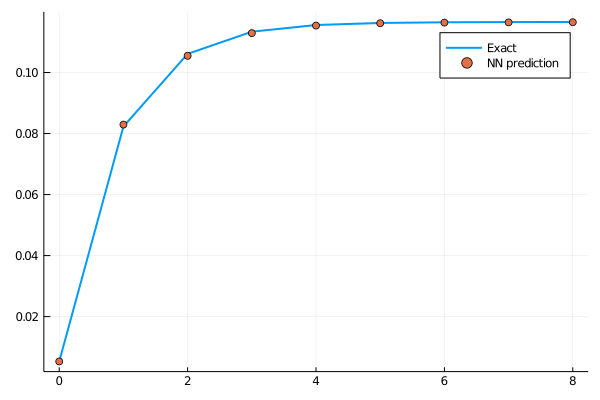

loss: 0.000121:  98%|████████████████████████████████████████ |  ETA: 0:00:02

0.00011987885643739411

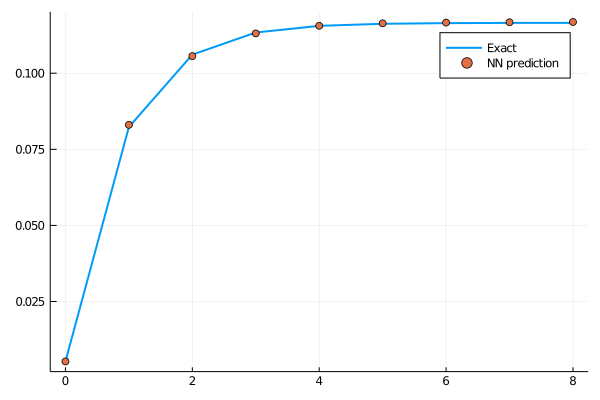

loss: 0.00012:  98%|████████████████████████████████████████▏|  ETA: 0:00:01

0.00011701491658168852

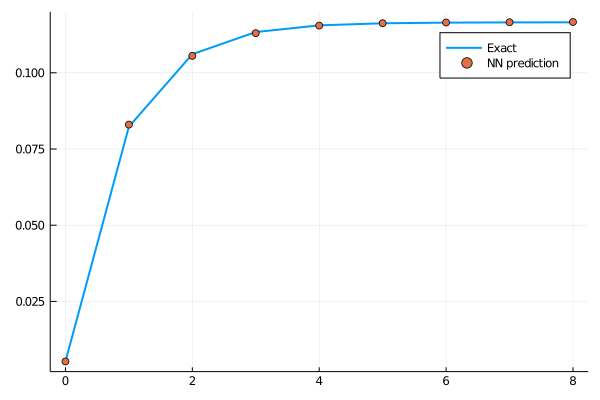

loss: 0.000117:  98%|████████████████████████████████████████▎|  ETA: 0:00:01

0.00011901300640926314

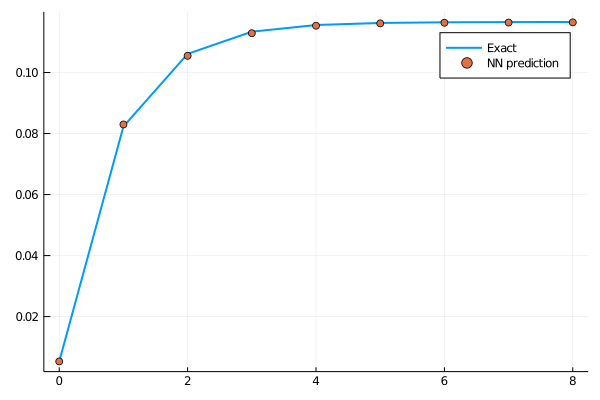

loss: 0.000119:  99%|████████████████████████████████████████▍|  ETA: 0:00:01

0.00011687596401540458

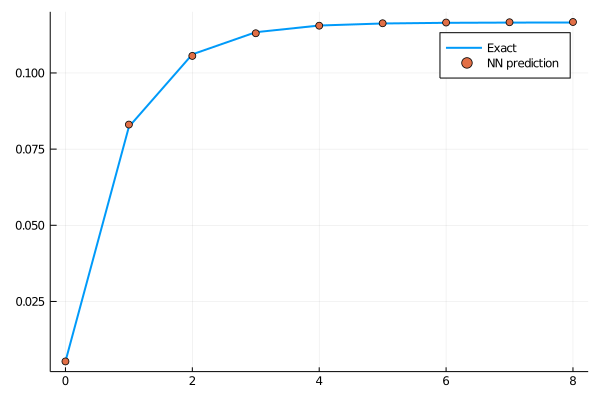

loss: 0.000117:  99%|████████████████████████████████████████▋|  ETA: 0:00:01

0.00011604875928002467

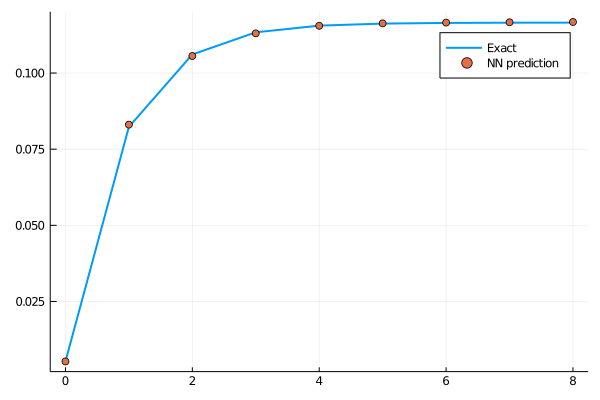

loss: 0.000116:  99%|████████████████████████████████████████▊|  ETA: 0:00:00

0.00011671751020608712

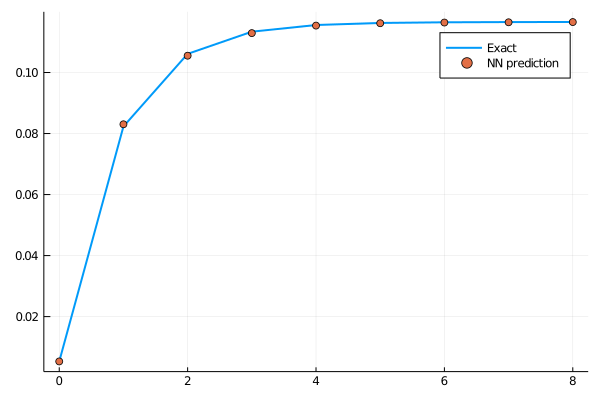

loss: 0.000117: 100%|████████████████████████████████████████▉|  ETA: 0:00:00

0.0001149664307486107

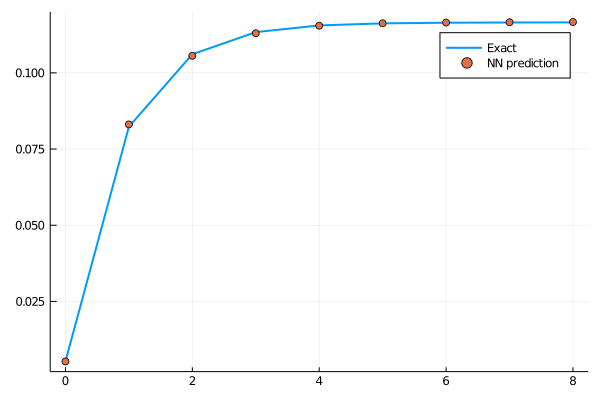

loss: 0.000115: 100%|█████████████████████████████████████████| Time: 0:01:07


0.0001149664307486107

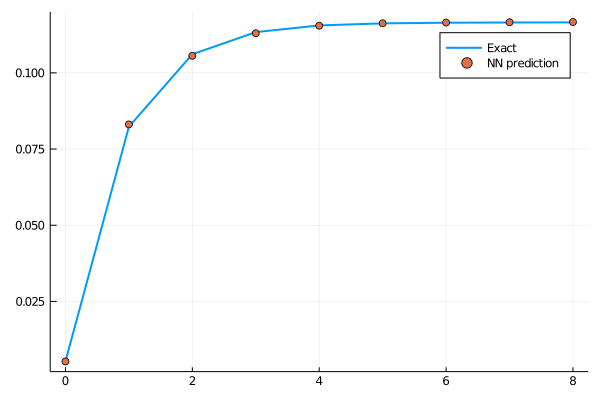

 * Status: failure (reached maximum number of iterations)

 * Candidate solution
    Minimizer: [1.50e-01, -5.73e-02, 7.56e-02,  ...]
    Minimum:   1.149664e-04

 * Found with
    Algorithm:     ADAM
    Initial Point: [1.55e-01, -5.17e-02, 7.49e-02,  ...]

 * Convergence measures
    |x - x'|               = NaN ≰ 0.0e+00
    |x - x'|/|x'|          = NaN ≰ 0.0e+00
    |f(x) - f(x')|         = NaN ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = NaN ≰ 0.0e+00
    |g(x)|                 = NaN ≰ 0.0e+00

 * Work counters
    Seconds run:   68  (vs limit Inf)
    Iterations:    300
    f(x) calls:    300
    ∇f(x) calls:   300


In [60]:
res = DiffEqFlux.sciml_train(loss_n_ode, n_ode.p, ADAM(), cb=cb, maxiters=300)

In [63]:
res = DiffEqFlux.sciml_train(loss_n_ode, res.minimizer, LBFGS(), cb=cb, maxiters=200)

ReadOnlyMemoryError: ReadOnlyMemoryError()

PDF at final instant

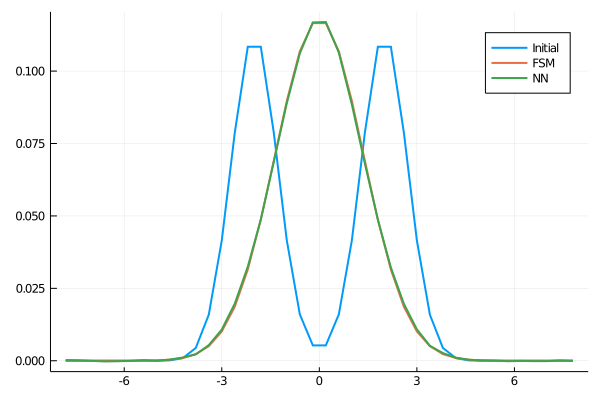

In [61]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[1][:,1], lw=2, label="Initial")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[1][:,end], lw=2, label="FSM")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D[1], res.minimizer).u[end], lw=2, label="NN")

Trajectories of PDF

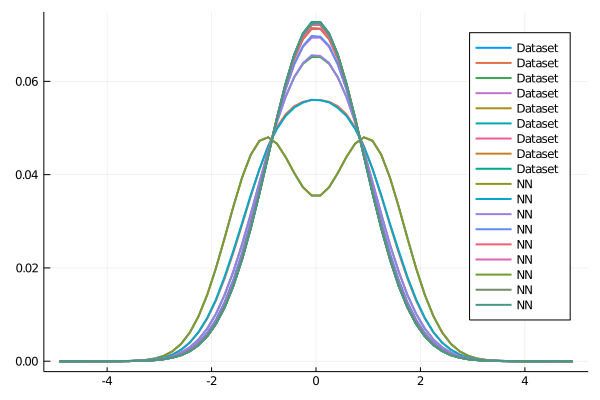

In [16]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], data_boltz_1D[:,:], lw=2, label="Dataset")
plot!(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(f0_1D, res.minimizer).u[:], lw=2, label="NN")

From different given initial value

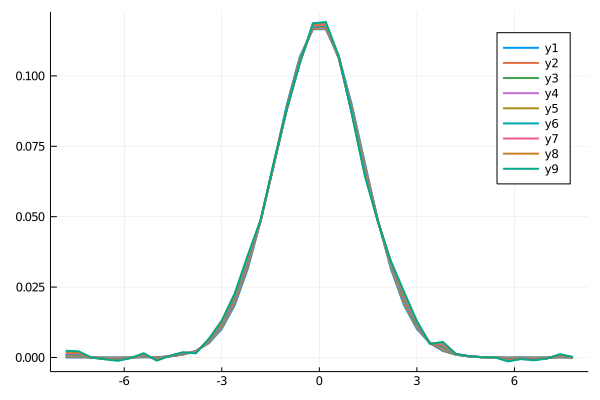

In [62]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(M0_1D1, res.minimizer).u[:], lw=2)

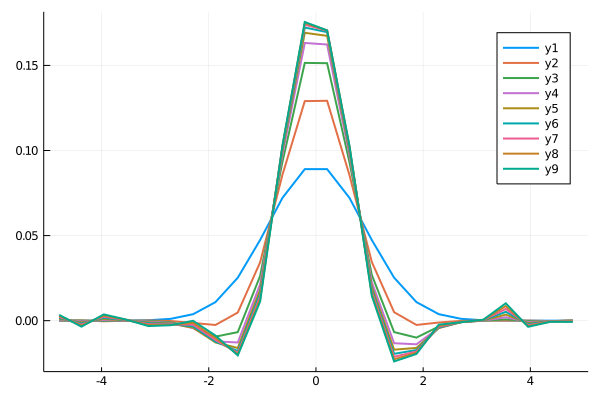

In [45]:
plot(vSpace.u[:,vSpace.nv÷2,vSpace.nw÷2], n_ode(M0_1D1./2, res.minimizer).u[:], lw=2)

In [28]:
[data_bgk1, data_bgk2]

2-element Array{Array{Float32,4},1}:
 [5.4158633e-28 2.4684897e-26 … 2.4684897e-26 5.4158633e-28; 1.0817786e-26 4.9306257e-25 … 4.9306257e-25 1.0817786e-26; … ; 1.0817786e-26 4.9306257e-25 … 4.9306257e-25 1.0817786e-26; 5.4158633e-28 2.4684897e-26 … 2.4684897e-26 5.4158633e-28]

[2.4684897e-26 1.12511e-24 … 1.12511e-24 2.4684897e-26; 4.9306257e-25 2.247324e-23 … 2.247324e-23 4.9306257e-25; … ; 4.9306257e-25 2.247324e-23 … 2.247324e-23 4.9306257e-25; 2.4684897e-26 1.12511e-24 … 1.12511e-24 2.4684897e-26]

[7.95057e-25 3.623781e-23 … 3.623781e-23 7.95057e-25; 1.5880676e-23 7.2382343e-22 … 7.2382343e-22 1.5880676e-23; … ; 1.5880676e-23 7.2382343e-22 … 7.2382343e-22 1.5880676e-23; 7.95057e-25 3.623781e-23 … 3.623781e-23 7.95057e-25]

...

[7.95057e-25 3.623781e-23 … 3.623781e-23 7.95057e-25; 1.5880676e-23 7.2382343e-22 … 7.2382343e-22 1.5880676e-23; … ; 1.5880676e-23 7.2382343e-22 … 7.2382343e-22 1.5880676e-23; 7.95057e-25 3.623781e-23 … 3.623781e-23 7.95057e-25]

[2.4684897e-26 1.12511e-2

In [22]:
randn(5)

5-element Array{Float64,1}:
  1.235688941523508  
 -0.4425029462816983 
  0.4231324420429891 
 -0.31427886064413696
  0.5222252560050824 